# Configs, Imports and Helper Functions

Con Colab Pro, tendrás acceso prioritario a nuestras GPU más veloces. Por ejemplo, podrás obtener una GPU T4 o P100 cuando la mayoría de los usuarios de la versión estándar de Colab reciben una GPU K80, que es más lenta. Puedes ver en cualquier momento qué GPU se te asignó si ejecutas la siguiente celda.

In [ ]:
gpu_info = !nvidia-smi
gpu_info = '\n'.join(gpu_info)
if gpu_info.find('failed') >= 0:
  print('Select the Runtime > "Change runtime type" menu to enable a GPU accelerator, ')
  print('and then re-execute this cell.')
else:
  print(gpu_info)

Tue May 18 21:39:53 2021       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 465.19.01    Driver Version: 460.32.03    CUDA Version: 11.2     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla V100-SXM2...  Off  | 00000000:00:04.0 Off |                    0 |
| N/A   40C    P0    38W / 300W |   2101MiB / 16160MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [ ]:
from psutil import virtual_memory
ram_gb = virtual_memory().total / 1e9
print('Your runtime has {:.1f} gigabytes of available RAM\n'.format(ram_gb))

if ram_gb < 20:
  print('To enable a high-RAM runtime, select the Runtime > "Change runtime type"')
  print('menu, and then select High-RAM in the Runtime shape dropdown. Then, ')
  print('re-execute this cell.')
else:
  print('You are using a high-RAM runtime!')

Your runtime has 27.3 gigabytes of available RAM

You are using a high-RAM runtime!


In [ ]:
# define colors
colors = {'GRAY1':'#231F20', 'GRAY2':'#414040', 'GRAY3':'#555655',
         'GRAY4':'#646369', 'GRAY5':'#76787B', 'GRAY6':'#828282',
         'GRAY7':'#929497', 'GRAY8':'#A6A6A5', 'GRAY9':'#BFBEBE',
         'BLUE1':'#174A7E', 'BLUE2':'#4A81BF', 'BLUE3':'#94B2D7',
         'BLUE4':'#94AFC5', 'RED1':'#C3514E', 'RED2':'#E6BAB7',
         'GREEN1':'#0C8040', 'GREEN2':'#9ABB59', 'ORANGE1':'#F79747',}

In [ ]:
import os
import random
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
from sklearn.preprocessing import MinMaxScaler, StandardScaler

# Tensorflow imports
import tensorflow as tf
from tensorflow.keras.models import Sequential, Model, load_model
from tensorflow.keras.layers import LSTM, Dense, RepeatVector, TimeDistributed, Input, BatchNormalization, \
    multiply, concatenate, Flatten, Activation, dot
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.utils import plot_model
from tensorflow.keras.callbacks import EarlyStopping
from sklearn.metrics import r2_score, mean_squared_error


from dateutil.relativedelta import relativedelta # working with dates with style
from scipy.optimize import minimize              # for function minimization

import statsmodels.formula.api as smf            # statistics and econometrics
import statsmodels.tsa.api as smt
import statsmodels.api as sm
import scipy.stats as scs

from itertools import product                    # some useful functions
from tqdm import tqdm_notebook

# Importing everything from above
from sklearn.metrics import r2_score, median_absolute_error, mean_absolute_error
from sklearn.metrics import median_absolute_error, mean_squared_error, mean_squared_log_error

import warnings                                  # `do not disturbe` mode
warnings.filterwarnings('ignore')
sns.set(style='whitegrid', palette='deep', font_scale=1.2)

## HELPER FUNCTIONS

In [ ]:
def mean_absolute_percentage_error(y_true, y_pred): 
    y_true, y_pred = np.array(y_true), np.array(y_pred)
    return np.mean(np.abs((y_true - y_pred) / y_true)) * 100

def split_sequences_multivariate(sequences, n_steps=32):
    
    '''
    Split a multivariate sequence into samples for single feature prediction
    Taken and adapted from Machinelearningmastery.
    Split the training set into segments of a specified timestep
    and creates the labels.
    '''
    #n_steps = n_steps+1
    # Place the column of the feature to predict at the end of the dataset
    #sequences = np.concatenate([X_train, X_train[:,0].reshape(-1,1)],axis=1)
    
    X, y = list(), list()
    for i in range(len(sequences)):
        # find the end of this pattern
        end_ix = i + n_steps
        # check if we are beyond the dataset
        if end_ix > len(sequences)-1:
            break
        # gather input and output parts of the pattern
        seq_x, seq_y = sequences[i:end_ix, :], sequences[end_ix, :]
        X.append(seq_x)
        y.append(seq_y)
    
    #print(np.shape(X),np.shape(y))
    return np.array(X), np.array(y)

# split a multivariate sequence into samples
def multi_step_output(sequences, n_steps_in, n_steps_out):
    X, y = list(), list()
    for i in range(len(sequences)):
        # find the end of this pattern
        end_ix = i + n_steps_in
        out_end_ix = end_ix + n_steps_out
        # check if we are beyond the dataset
        if out_end_ix > len(sequences):
            break
        # gather input and output parts of the pattern
        seq_x, seq_y = sequences[i:end_ix, :], sequences[end_ix:out_end_ix, :]
        X.append(seq_x)
        y.append(seq_y)
    return np.array(X), np.array(y)


def plot_distribution_error(model, train_X, test_X, train_y, test_y):
    train_predictions = model.predict(train_X)
    test_predictions = model.predict(test_X)

    fig, (ax1,ax2) = plt.subplots(1, 2, figsize=(14,4))
    fig.suptitle('Distributions of Prediction and True Values', y=1.02, fontsize=13.5)
    sns.distplot(a=train_predictions.flatten(), ax=ax1, label='Prediction')
    sns.distplot(a=train_y.flatten(), ax=ax1, label= 'True')
    sns.distplot(a=test_predictions.flatten(), ax=ax2, label='Prediction')
    sns.distplot(a=test_y.flatten(), ax=ax2, label='True')
    plt.legend()
    plt.tight_layout()

def get_errors(model, train_X, test_X, train_y, test_y):
    
    train_predictions = model.predict(train_X)
    test_predictions = model.predict(test_X)
    MAE_train = abs(train_predictions - train_y).mean()
    MAE_test = abs(test_predictions - test_y).mean()
    if train_y.shape[1] == 3:
        mae_overall_train = abs(train_predictions-train_y).mean(axis=(1))
        mae_overall_test = abs(test_predictions-test_y).mean(axis=(1))
        mse_test = mean_squared_error(test_y, test_predictions)
        rmse_test = np.sqrt(mse_test)
        r2_test = r2_score(test_y, test_predictions)
        #mape = mean_absolute_percentage_error(test_y, test_predictions)
    else:
        mae_overall_train = abs(train_predictions-train_y).mean(axis=(1,2))
        mae_overall_test = abs(test_predictions-test_y).mean(axis=(1,2))
        mse_test = mean_squared_error(test_y.reshape(-1,3), test_predictions.reshape(-1,3))
        r2_test = r2_score(test_y.reshape(-1,3), test_predictions.reshape(-1,3)) 

    rmse_test = np.sqrt(mse_test)
    return MAE_train, MAE_test, mae_overall_train, mae_overall_test, mse_test, r2_test, rmse_test

def plot_mae_overall(MAE_train, MAE_test, mae_overall_train, mae_overall_test, suptitle):
    
    fig, (ax1,ax2) = plt.subplots(1,2,figsize=(24,4))
    fig.suptitle(suptitle, y=1.02, fontsize=16.5)
    
    ax1.plot(mae_overall_train, label='MAE Train')
    ax1.set_title('MAE Train={}'.format(MAE_train))
    ax2.plot(mae_overall_test, label='MAE Test', color='teal')
    ax2.set_title('MAE Test={}'.format(MAE_test))
    fig.legend(loc='upper right')
    plt.tight_layout()

def plot_lstm(model, X, y, feature_index=0):

    prediction = model.predict(X)
    if prediction.shape[-1] == 1:
        pred_df = pd.DataFrame(data= np.concatenate((model.predict(X), y.reshape(-1,1)), axis=1), columns=['Prediction', 'True'])
    else:
        pred_df = pd.DataFrame(data= np.concatenate((model.predict(X)[:,feature_index].reshape(-1,1),
                                                     y[:,feature_index].reshape(-1,1)), axis=1), columns=['Prediction', 'True'])
    mse = mean_squared_error(y, prediction)
    rmse = np.sqrt(mse_test)
    r2 = r2_score(y, prediction)

    fig, ax1 = plt.subplots(1,1,figsize=(14,4))
    pred_df.plot(ax=ax1)
    plt.legend(loc='upper left')
    plt.title('Prediction and Truth rmse = {}, r2 score = {}'.format(np.round(rmse,4), np.round(r2,4)))    
    plt.tight_layout()

def plot_single_seq(model, X, y, feature_index=0):

  prediction = model.predict(X)[:,7,:]
  y = y[:,7,:]
  pred_df = pd.DataFrame(data= np.column_stack((prediction.reshape(-1,3)[:,feature_index],
                                                y.reshape(-1,3)[:,feature_index])),
                          columns=['Prediction', 'True'])
    
  mse = mean_squared_error(y.reshape(-1,3), prediction.reshape(-1,3))
  rmse = np.sqrt(mse)
  r2 = r2_score(y.reshape(-1,3), prediction.reshape(-1,3)) 


  fig, ax1 = plt.subplots(1,1,figsize=(14,4))
  pred_df.plot(ax=ax1)
  plt.legend(loc='upper left')
  plt.title('Prediction and Truth rmse = {}, r2 score = {}'.format(np.round(rmse,4), np.round(r2,4)))    
  plt.tight_layout()
    
def plot_predictions(model, train_X, test_X, train_y, test_y):
    train_predictions = model.predict(train_X)
    test_predictions = model.predict(test_X)
    
    data_final = dict(train_pred=train_predictions, train_true=train_y,
                      test_pred=test_predictions, test_true=test_y)

    # Number of time steps in the future, as increases the accuracy decreases
    ith_timestep = 7

    for lb in ['train', 'test']:   
        fig, axx = plt.subplots(3,1,figsize=(18,9))
        for i, x_lbl, clr,axi in zip([0, 1, 2], ['Temperature', 'VMPPT','VPanel'], ['salmon', 'teal','darkblue'], axx):
            axi.plot(data_final[lb+'_pred'][:, ith_timestep, i], linestyle='-', color='r', label='pred '+x_lbl)
            axi.plot(data_final[lb+'_true'][:, ith_timestep, i], linestyle='-', color=clr, label='true '+x_lbl)
            axi.legend(loc='upper center', bbox_to_anchor=(0.5, -0.15), ncol=2)
        fig.suptitle('({}): {}th time step in all samples'.format(lb, ith_timestep), y=1.02,fontsize=15)
        plt.tight_layout()

def train_model(model, train_X, train_y, callbacks, epochs=100, batch_size=256, patience=5, verbose=1, validation_split=0.25):

  if verbose==0:
    print('Training model')
  history = model.fit(train_X, train_y,
                      validation_split=validation_split, 
                      epochs=epochs, verbose=verbose,
                      callbacks=callbacks, 
                      batch_size=batch_size)
  return history

class myCallback(tf.keras.callbacks.Callback):
  def __init__(self, mae=0.03):
    super(myCallback, self).__init__()
    self.mae = mae

  def on_epoch_end(self, epoch, logs={}):
    if(logs.get('val_mae') <= self.mae):
      print("\nReached 0.03 mae so cancelling training!")
      self.model.stop_training = True

def forecast_att(model, train_X, train_y, forecast_range=100):

  n_timesteps_in = train_X.shape[1]
  n_timesteps_out = train_y.shape[1]
  n_features = train_X.shape[2]
  
  # first set of samples

  batch = train_X[-1, :, :]
  predictions_forecast = batch
  # future timesteps to forcast times X horizon timesteps
  for i in range(forecast_range):
    one_step_pred = model.predict(batch.reshape(1, n_timesteps_in, n_features))
    batch = np.concatenate([batch[n_timesteps_out:], one_step_pred.reshape(n_timesteps_out, n_features)], axis=0)
    predictions_forecast = np.row_stack([predictions_forecast, one_step_pred.reshape(n_timesteps_out, n_features)])

  fig, axx = plt.subplots(3, 1, figsize=(18,7))

  forecast = np.concatenate([train_y[:, n_timesteps_out-1, :], predictions_forecast], axis=0)
  forecast[:train_y.shape[0]] = None
  axx[0].plot(train_y[:, 0, 0])
  axx[0].plot(forecast[:,0])
  axx[1].plot(train_y[:, 0, 1])
  axx[1].plot(forecast[:,1])
  axx[2].plot(train_y[:, 0, 2])
  axx[2].plot(forecast[:,2])
  plt.tight_layout()

### MODELS
def serialize_model(model, history, name='model'):    ##--------------------Save the models 
  # serialize model to JSON
  model_json = model.to_json()
  with open(name+'.json', "w") as json_file:
      json_file.write(model_json)
  # serialize weights to HDF5
  model.save_weights(name+'.h5')
  history.to_csv(name+'.csv')
  print("Saved model to disk")

def load_model(name='model'):   ##----------------------------Load the models
  json_file = open(name+'.json', 'r')
  loaded_model_json = json_file.read()
  json_file.close()
  loaded_model = tf.keras.models.model_from_json(loaded_model_json)
  # load weights into new model
  loaded_model.load_weights(name+'.h5')
  print("Loaded model from disk")
  return loaded_model

def plotMovingAverage(series, window=4, plot_intervals=False, scale=1.96, plot_anomalies=False, plot=True, color='g', figsize=(20,5)):

    """
        series - dataframe with timeseries
        window - rolling window size 
        plot_intervals - show confidence intervals
        plot_anomalies - show anomalies 
    """
    rolling_mean = series.rolling(window=window).mean()

    fig, ax = plt.subplots(1, 1, figsize=figsize)
    plt.title("Moving average\n window size = {}".format(window))
    plt.plot(rolling_mean, color, label="Rolling mean trend")
    
    # Plot confidence intervals for smoothed values
    if plot_intervals:
        mae = mean_absolute_error(series[window:], rolling_mean[window:])
        deviation = np.std(series[window:] - rolling_mean[window:])
        lower_bond = rolling_mean - (mae + scale * deviation)
        upper_bond = rolling_mean + (mae + scale * deviation)
        plt.plot(upper_bond, "r--", label="Upper Bond / Lower Bond")
        plt.plot(lower_bond, "r--")
        
        # Having the intervals, find abnormal values
        if plot_anomalies:
            anomalies = pd.DataFrame(index=series.index, columns=series.columns)
            anomalies[series<lower_bond] = series[series<lower_bond]
            anomalies[series>upper_bond] = series[series>upper_bond]
            plt.plot(anomalies, "ro", markersize=10)
        
    plt.plot(series[window:], label="Actual values")
    plt.legend(loc="upper left")
    plt.grid(True)
    return ax

def tsplot(y, lags=None, figsize=(12, 7), style='bmh'):
    """
        Plot time series, its ACF and PACF, calculate Dickey–Fuller test
        
        y - timeseries
        lags - how many lags to include in ACF, PACF calculation
    """
    if not isinstance(y, pd.Series):
        y = pd.Series(y)
            
    fig = plt.figure(figsize=figsize)
    layout = (2, 2)
    ts_ax = plt.subplot2grid(layout, (0, 0), colspan=2)
    acf_ax = plt.subplot2grid(layout, (1, 0))
    pacf_ax = plt.subplot2grid(layout, (1, 1))

    y.plot(ax=ts_ax)
    stats = sm.tsa.stattools.adfuller(y)
    p_value = stats[1]
    print('P Value {}'.format(p_value))
    print('ADF Stats {}'.format(stats[0]))
    
    for key, value in stats[4].items():
        print(key, value)
        
    if stats[0] < stats[4]['5%']:
        print('Reject Hipothesis --> Time Serie Stationary')
    else:
        print('Failed To Reject Ho --> Time Serie non Stat')
    
    ts_ax.set_title('Time Series Analysis Plots\n Dickey-Fuller: p={0:.5f}'.format(p_value))
    smt.graphics.plot_acf(y, lags=lags, ax=acf_ax)
    smt.graphics.plot_pacf(y, lags=lags, ax=pacf_ax)
    plt.tight_layout()
    return fig

def optimizeSARIMA(parameters_list, d, D, s, serie):
    """
        Return dataframe with parameters and corresponding AIC
        
        parameters_list - list with (p, q, P, Q) tuples
        d - integration order in ARIMA model
        D - seasonal integration order 
        s - length of season
    """
    
    results = []
    best_aic = float("inf")

    for param in tqdm_notebook(parameters_list):
        # we need try-except because on some combinations model fails to converge
        try:
            model=sm.tsa.statespace.SARIMAX(serie, order=(param[0], d, param[1]), 
                                            seasonal_order=(param[2], D, param[3], s)).fit(disp=-1)
        except:
            continue
        aic = model.aic
        # saving best model, AIC and parameters
        if aic < best_aic:
            best_model = model
            best_aic = aic
            best_param = param
        results.append([param, model.aic])

    result_table = pd.DataFrame(results)
    result_table.columns = ['parameters', 'aic']
    # sorting in ascending order, the lower AIC is - the better
    result_table = result_table.sort_values(by='aic', ascending=True).reset_index(drop=True)
    
    return result_table

def plotSARIMA(series, model, n_steps):
    """
        Plots model vs predicted values
        
        series - dataset with timeseries
        model - fitted SARIMA model
        n_steps - number of steps to predict in the future
        
    """
    # adding model values
    data = series.copy()
    data.columns = ['actual']
    data['arima_model'] = model.fittedvalues
    # making a shift on s+d steps, because these values were unobserved by the model
    # due to the differentiating
    data['arima_model'][:s+d] = np.NaN
    
    # forecasting on n_steps forward 
    forecast = model.predict(start = data.shape[0], end = data.shape[0]+n_steps)
    forecast = data.arima_model.append(forecast)
    # calculate error, again having shifted on s+d steps from the beginning
    error = mean_absolute_percentage_error(data['actual'][s+d:], data['arima_model'][s+d:])
    mae = mean_absolute_error(data['actual'][s+d:], data['arima_model'][s+d:])
    r2 = r2_score(data['actual'][s+d:], data['arima_model'][s+d:])

    plt.figure(figsize=(20, 7))
    print(f'MAE: {mae}, R2: {r2}')
    plt.title("Mean Absolute Percentage Error: {0:.2f}%".format(error))
    plt.plot(forecast, color='r', label="model")
    plt.axvspan(data.index[-1], forecast.index[-1], alpha=0.5, color='lightgrey')
    plt.plot(data.actual, label="actual")
    plt.legend()
    plt.grid(True);

In [ ]:
def forecast_for_tx(model, train_X, normalized_train, n_timesteps_out, pred_range=100, threshold=0.08):
  '''
  Function to make a forecast checking the error in prediction.
  If the error is too big, then the real values are copied t the prediction
  so next prediction will consider real points. This will diminish the error in
  forecast. Considering only error in temperature to make it simple.
  '''
  n_timesteps_in = train_X.shape[1]
  n_features = train_X.shape[-1]
  
  # next_bath starts with the last batch of the training set
  next_batch = train_X[-1, :, :]
  predictions_forecast = []
  next_step_truth_list = []
  counter = 0
  error_stack = []

  # Repeat a number of future timesteps
  for ii in range(pred_range):
    # Reshape to 3D for prediction
    next_step_pred = model.predict(next_batch.reshape(1, n_timesteps_in, n_features))
    # Reshape to 2D
    next_step_pred = next_step_pred.reshape(n_timesteps_out, n_features)

    # the real values are in normalized_train. Starting from train_len is the testing data set
    # which is the continuation (or truth) of the values predicted in from the last training batch
    # but only n_timesteps_out amounth. We have to shift the timesteps in validation by n_timesteps_out times 
    next_step_truth = normalized_train[train_len:][ii * n_timesteps_out : n_timesteps_out*(ii+1)]
    next_step_truth_list.append(next_step_truth)
    # calculate error
    error_temp = abs(next_step_truth[:,0] - next_step_pred[:,0])
    error_vmppt = abs(next_step_truth[:,1] - next_step_pred[:,1])
    error_vpanel = abs(next_step_truth[:,2] - next_step_pred[:,2])
    error = abs(next_step_truth - next_step_pred).mean()

    # Stack the rolling MAE for counting the points
    # Next we have to ensamble the data with the points and 
    # not with the sequences but for now let's just count
    error_temp = error_temp.reshape(-1,1).mean(axis=1)
    error_stack.append(error_temp)

    #transmitting points with higher error
    prep_batch = next_step_pred
    for elem in range(len(error_temp)):
      if error_temp[elem] > threshold:
        prep_batch[elem] = next_step_truth[elem]
        counter+=1

    predictions_forecast.append(prep_batch)
    # Take the next batch for predcition
    next_batch = np.row_stack([next_batch[n_timesteps_out:], prep_batch])

  # convert to numpy & reshape predictions
  predictions_forecast = np.array(predictions_forecast).reshape(-1,3)
  # convert to numpy & reshape real values
  forecast_truth = np.array(next_step_truth_list).reshape(-1,3)
  # Stack error and real values
  forecast_result = np.column_stack([predictions_forecast,forecast_truth])

  return error_stack, forecast_result, counter

def mean_absolute_percentage_error(y_true, y_pred): 
    return np.mean(np.abs((y_true - y_pred) / y_true)) * 100

def moving_average(series, n):
    """
        Calculate average of last n observations
    """
    return np.average(series[-n:])

## MODELS BUILD



In [ ]:
def build_lstm(units, n_timesteps_in, n_features, dropout=0.2):
  ###-------------LSTM MODEL--------------------------#####
  input_shape = (n_timesteps_in, n_features)

  #tf.keras.backend.clear_session()

  model_lstm = tf.keras.models.Sequential()

  model_lstm.add(tf.keras.layers.LSTM(units=units, input_shape=input_shape,
                                    return_sequences=True, dropout=dropout))
  model_lstm.add(tf.keras.layers.LSTM(units=units, return_sequences=False,
                                  dropout=dropout))
  #model_lstm.add(tf.keras.layers.LSTM(units=units, return_sequences=False,
  #                                dropout=dropout))
  
  #model_lstm.add(tf.keras.layers.BatchNormalization())
  model_lstm.add(tf.keras.layers.Dense(120))
  model_lstm.add(tf.keras.layers.Dense(3))

  return model_lstm
###-----------------------------------------------------

def build_GRU(units, n_timesteps_in, n_features, dropout=0.2):

  input_shape = (n_timesteps_in, n_features)
  
  #tf.keras.backend.clear_session()
  model_gru = tf.keras.models.Sequential()

  model_gru.add(tf.keras.layers.GRU(units=units, dropout=dropout, return_sequences=True, input_shape=input_shape)) 
  model_gru.add(tf.keras.layers.GRU(units=units, input_shape=input_shape, return_sequences=False, dropout=dropout))
  #model_gru.add(tf.keras.layers.GRU(units=units, input_shape=input_shape, return_sequences=False, dropout=dropout))
  
  #model_gru.add(tf.keras.layers.BatchNormalization())
  model_gru.add(tf.keras.layers.Dense(120))
  model_gru.add(tf.keras.layers.Dense(3))

  return model_gru
###-----------------------------------------------------

def Model_cnn(input_shape, units=128, filters=64, kernel_size=3, dropout=0.2, LSTM=False):
  #tf.keras.backend.clear_session()
  model = tf.keras.models.Sequential()

  if LSTM==False:
    model.add(tf.keras.layers.Conv1D(filters=filters, kernel_size=kernel_size, input_shape=input_shape,
                                     activation='relu')) 
    model.add(tf.keras.layers.Conv1D(filters=filters, kernel_size=kernel_size, activation='relu'))
    model.add(tf.keras.layers.Dropout(dropout))
    model.add(tf.keras.layers.MaxPooling1D(pool_size=2))
    model.add(tf.keras.layers.Flatten())
    model.add(tf.keras.layers.Dense(120))
    
  else:
    model.add(tf.keras.layers.Conv1D(filters=filters, kernel_size=kernel_size, input_shape=input_shape,
                                     activation='relu'))
    model.add(tf.keras.layers.LSTM(units=units, input_shape=input_shape,
                                      return_sequences=False, dropout=dropout))
    model.add(tf.keras.layers.LSTM(units=units, return_sequences=False,
                                   dropout=dropout))
    
  #model_LSTM.add(tf.keras.layers.BatchNormalization())
  model.add(tf.keras.layers.Dense(3))
  
  return model
  #####----------------------------------------------------------------------

def Model_dnn(units, input_shape, dropout=0.2):   # Simple Deep Learning Model
  tf.keras.backend.clear_session()
  model = Sequential()
  #model.add(tf.keras.layers.Reshape(input_shape, input_shape=(input_shape,)))
  model.add(tf.keras.layers.Dense(units=128, activation='relu', input_shape=input_shape))
  model.add(tf.keras.layers.Dense(units=128, activation='relu'))
  model.add(tf.keras.layers.Dropout(dropout))
  model.add(tf.keras.layers.MaxPooling1D(pool_size=2))
  model.add(tf.keras.layers.Flatten())
  model.add(tf.keras.layers.Dense(units=3))
  return model
###-------------------------------------------------------------------------

def Model_Seq(n_hidden, input_shape, output_shape, dropout):
  #tf.keras.backend.clear_session()
  input_train = Input(shape=input_shape)
  output_train = Input(shape=output_shape)

  encoder_last_h1, encoder_last_h2, encoder_last_c = \
  tf.keras.layers.LSTM(n_hidden, activation='relu', dropout=dropout,
                       return_sequences=False,
                       return_state=True)(input_train)

  #Batch normalisation is added because we want to avoid gradient
  #explosion caused by the activation function ELU in the encoder.
  #encoder_last_h1 = BatchNormalization(momentum=0.9)(encoder_last_h1)
  #encoder_last_c = BatchNormalization(momentum=0.9)(encoder_last_c)

  # Create copies of las hidden state
  decoder = RepeatVector(output_train.shape[1])(encoder_last_h1)

  # nitial_state: List of initial state tensors to be passed to the first call of the cell 
  #(optional, defaults to None which causes creation of zero-filled initial state tensors).
  # In this case initial state is the output from encoder
  decoder = tf.keras.layers.LSTM(n_hidden, activation='relu', dropout=dropout,
                                return_state=False,
                                return_sequences=True)(decoder, initial_state=[encoder_last_h1, encoder_last_c])

  out = TimeDistributed(Dense(output_train.shape[2]))(decoder)
  model = tf.keras.Model(inputs=input_train, outputs=out)
  return model
####------------------------------------------------------------------------

def Model_Attention(n_hidden, input_shape, output_shape, dropout):

  input_train = Input(shape=input_shape)
  output_train = Input(shape=output_shape)

  encoder_stack_h, encoder_last_h, encoder_last_c = \
  tf.keras.layers.LSTM(n_hidden, activation='tanh', 
                      return_sequences=True,
                      return_state=True)(input_train)

  #encoder_last_h = BatchNormalization(momentum=0.6)(encoder_last_h)
  #encoder_last_c = BatchNormalization(momentum=0.6)(encoder_last_c)

  # Repeat the last hidden state of encoder 20 times, and use them as input to decoder LSTM.
  decoder_input = tf.keras.layers.RepeatVector(output_train.shape[1])(encoder_last_h)

  decoder_stack_h = tf.keras.layers.LSTM(n_hidden, activation='tanh', return_state=False,
                                        return_sequences=True)(decoder_input, initial_state=[encoder_last_h, encoder_last_c])

  # Alignment Score is Dot Product in Luong Attention
  attention = tf.keras.layers.dot([decoder_stack_h, encoder_stack_h], axes=[2, 2])
  attention = tf.keras.layers.Activation('softmax', name='Softmax')(attention)
  context = tf.keras.layers.dot([attention, encoder_stack_h], axes=[2,1])
  #context = BatchNormalization(momentum=0.6)(context)
  # Now we concat the context vector and stacked hidden states of decoder, 
  # and use it as input to the last dense layer.
  decoder_combined_context = tf.keras.layers.concatenate([context, decoder_stack_h])
  out = tf.keras.layers.TimeDistributed(tf.keras.layers.Dense(output_train.shape[2]))(decoder_combined_context)

  model = tf.keras.models.Model(inputs=input_train, outputs=out)
  
  return model

# Load Dataset and preprocess

Running on CoLab
Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
                          Module           Type  ...  V_MPPT  V_Panel
Timestamp                                        ...                 
2018-10-01 00:01:39  34.B2.9F.A9  P-Solar Panel  ...   3.285      0.0
2018-10-01 00:06:35  34.B2.9F.A9  P-Solar Panel  ...   3.285      0.0
2018-10-01 00:16:35  34.B2.9F.A9  P-Solar Panel  ...   3.290      0.0
2018-10-01 00:21:38  34.B2.9F.A9  P-Solar Panel  ...   3.285      0.0
2018-10-01 00:26:34  34.B2.9F.A9  P-Solar Panel  ...   3.294      0.0

[5 rows x 6 columns]
Lenght of Data 61344
Lenght of Train 49075
Lenght of Test 12269


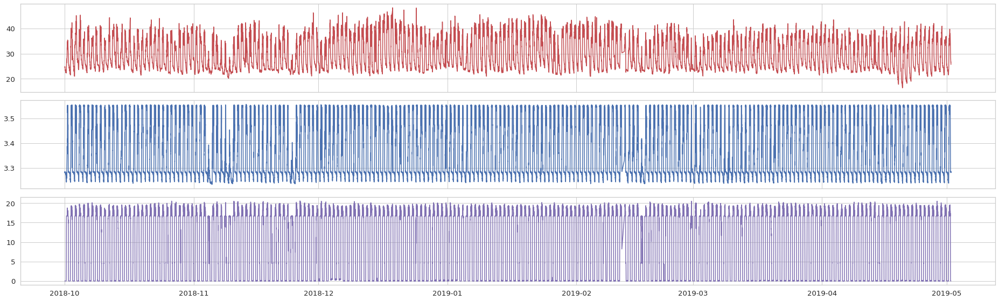

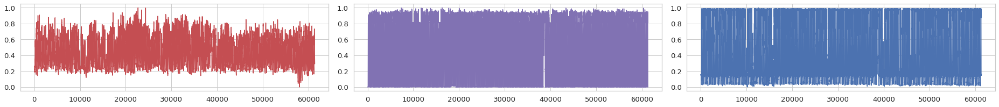

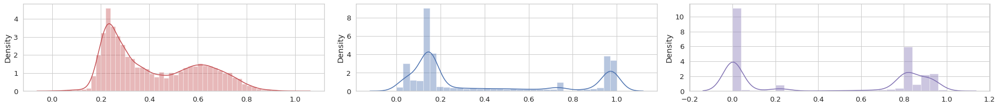

In [ ]:
#@title Choose the Module to Download{ display-mode: "form" }
module = '34.B2.9F.A9' #@param ["A7.CB.0A.C0", '9F.8D.AC.91', '29.E5.5A.24', '34.B2.9F.A9', '01.E9.39.32', 'A4.0D.82.38', '9F.8D.AC.91', '50.39.E2.80']
resample_time = '5Min' #@param ["5Min","10Min", '30Min', '60Min']
init_date = '2018-10-01' #@param {type:"date"}
end_date = '2019-05-01' #@param {type:"date"}

#defaults '2018-10-01'   '2019-04'

# Block to load file depending if you are in Colab or in Jupyter
if 'google.colab' in str(get_ipython()):
    print('Running on CoLab')
    
    from google.colab import drive
    drive.mount('/content/drive')
    path = '/content/drive/My Drive/DeepLearning/Data/Features.csv'
    data = pd.read_csv(path, parse_dates=['Timestamp'], index_col='Timestamp')
    data = data.drop('Unnamed: 0', axis=1)
else:
    path_of_file = '../Data/single_feature.csv'
    data = pd.read_csv(path_of_file, parse_dates=['Timestamp'], index_col='Timestamp')

data = data[data['Module']==module].dropna(axis=1, how='all')[init_date:end_date]

print(data.head())

try:
  data = data.drop(['Module','Type'], axis=1)
except:
  pass

if len(data.columns) > 3:
  if module == '34.B2.9F.A9':
    data = data.drop(data.columns[2], axis=1)
  else:
    data = data.drop(data.columns[-1], axis=1)

fig, axx = plt.subplots(len(data.columns), 1, figsize=(26,8), sharex=True)
for ax, ii, c in zip(axx, range(len(data.columns)), ['r','b','m']):
  ax.plot(data[data.columns[ii]], color=c)
plt.tight_layout()

# The data is higly irregular so let's resample it to 10 min and take the mean
resampled = data.resample(resample_time).mean()
resampled = resampled.fillna(resampled.bfill())
# Now let's take only a slice of it

more_features = False #@param {type:"boolean"}

if more_features == True:
  resampled['temp_mean'] = resampled[data.columns[0]].rolling(12*12).mean()
  resampled['volt_mean'] = resampled[data.columns[1]].rolling(12*12).mean()
  resampled['lvl_mean'] = resampled[data.columns[2]].rolling(12*12).mean()
  resampled['sine'] = np.sin(resampled.index.day.values)
  resampled['cosine'] = np.cos(resampled.index.day.values)
  resampled = resampled.dropna(axis=0)

#Separate Train and test
train_data = resampled[init_date:end_date]

train_ratio = 0.8
train_len = int(train_ratio*len(train_data))
scaler = MinMaxScaler()
normalized_train = scaler.fit_transform(train_data)

print('Lenght of Data {}'.format(len(normalized_train)))
print('Lenght of Train {}'.format(train_len))
print('Lenght of Test {}'.format(len(normalized_train) - train_len)) 

fig, (ax1, ax2,ax3) = plt.subplots(1,3, figsize=(26,3))
ax1.plot(normalized_train[:,0], color='r')
ax3.plot(normalized_train[:,1], color='b')
ax2.plot(normalized_train[:,2], color='m')
plt.tight_layout()

fig, (ax1, ax2,ax3) = plt.subplots(1,3, figsize=(26,3))
sns.distplot(a = normalized_train[:,0], color='r', ax=ax1)
sns.distplot(normalized_train[:,1], color='b', ax=ax2)
sns.distplot(normalized_train[:,2], color='m', ax=ax3)
plt.tight_layout()

if more_features == True:
  fig, (ax1, ax2,ax3) = plt.subplots(1,3, figsize=(26,3))
  ax1.plot(normalized_train[:,3], color='r')
  ax3.plot(normalized_train[:,4], color='b')
  ax2.plot(normalized_train[:,5], color='m')
  plt.tight_layout()
  fig, (ax1, ax2) = plt.subplots(1,2, figsize=(20,3))
  ax1.plot(normalized_train[:,6], color='r')
  ax2.plot(normalized_train[:,7], color='m')
  plt.tight_layout()


## ARIMA

P Value 0.14049787524394453
ADF Stats -2.4044018367921955
1% -3.4371729482129885
5% -2.8645522259969534
10% -2.568373874086242
Failed To Reject Ho --> Time Serie non Stat
P Value 0.03141846355741451
ADF Stats -3.0388932358671807
1% -3.4371729482129885
5% -2.8645522259969534
10% -2.568373874086242
Reject Hipothesis --> Time Serie Stationary
P Value 1.379795177233466e-06
ADF Stats -5.583461791780139
1% -3.4371729482129885
5% -2.8645522259969534
10% -2.568373874086242
Reject Hipothesis --> Time Serie Stationary


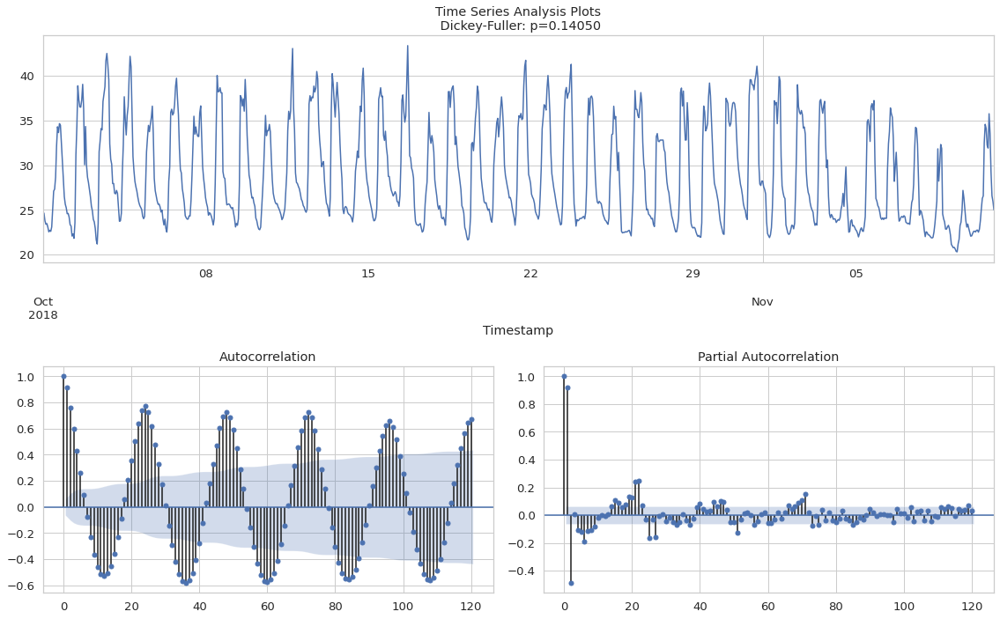

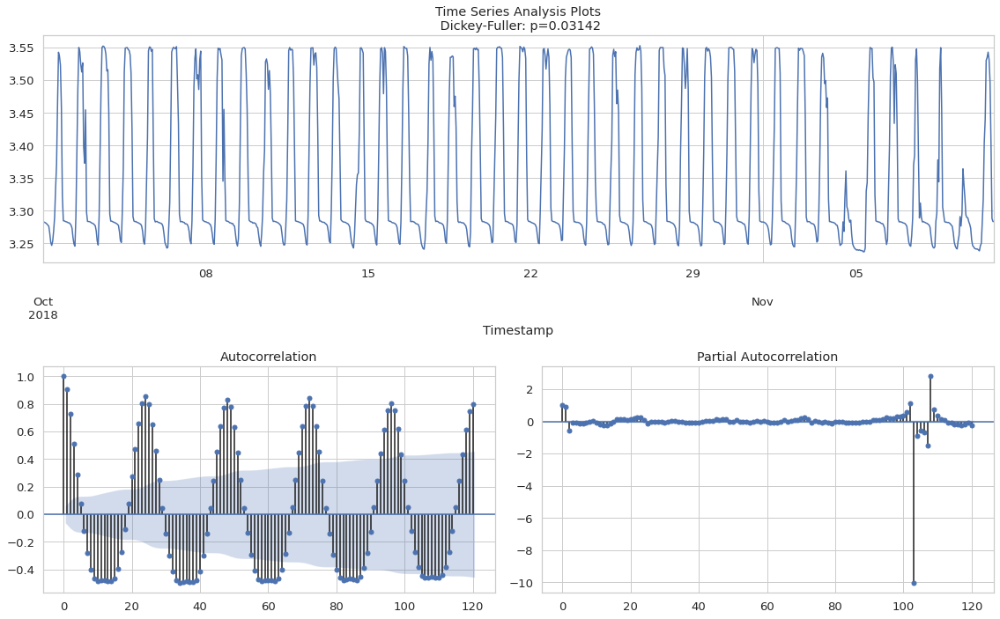

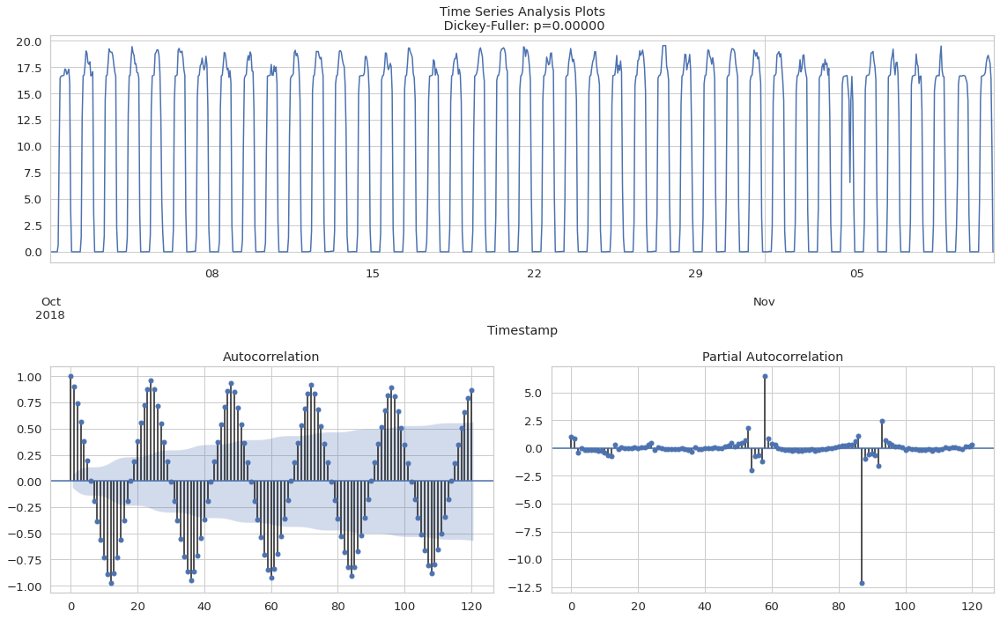

In [ ]:
#@title Fit SARIMA Model{ display-mode: "form" }

train = True #@param ["False", "True"] {type:"raw"}
#@markdown Smoothing window for Moving Average
smoothing =  144#@param {type:"raw"}
lags =  120 #@param {type:"raw"}  
from_date = '2018-10-01' #@param {type:"date"}
to_date = '2018-11-10' #@param {type:"date"}
plot_intervals=False #@param {type:"boolean"}
diff = False #@param {type:"boolean"}


serie_temp = resampled[[resampled.columns[0]]][from_date:to_date]
serie_vbus = resampled[[resampled.columns[1]]][from_date:to_date]
serie_vpanel = resampled[[resampled.columns[2]]][from_date:to_date]

plot_moving_average=False #@param {type:"boolean"}
if plot_moving_average:
  plotMovingAverage(serie_temp, smoothing, plot_intervals=plot_intervals, color=colors['RED1'], figsize=(20,7)) # Smothing by 12 hours
  plt.tight_layout()
if diff:
  serie_temp = serie_temp.diff(1).dropna()
  serie_vbus = serie_vbus.diff(1).dropna()
  serie_vpanel = serie_vpanel.diff(1).dropna()
#@markdown Getting rid of non-stationarity and building SARIMA
#@markdown Now let’s build an ARIMA model by walking through all the circles of hell stages
#@markdown of making series stationary. The most commonly used is the ADF test, where the null hypothesis
#@markdown is the time series possesses a unit root and is non-stationary. 
#@markdown So, if the P-Value in ADH test is less than the significance level or critical value (0.05),
#@markdown you reject the null hypothesis

#@markdown ##Augmented Dickey-Fuller test
#@markdown Statistical tests make strong assumptions about your data. 
#@markdown They can only be used to inform the degree to which a null hypothesis can be rejected
#@markdown or fail to be reject. The result must be interpreted for a given problem to be meaningful. 
#@markdown Nevertheless, they can provide a quick check and confirmatory evidence that your time series
#@markdown is stationary or non-stationary. The Augmented Dickey-Fuller test is a type of statistical test 
#@markdown called a unit root test. The intuition behind a unit root test is that it determines how 
#@markdown strongly a time series is defined by a trend.<br>
#@markdown There are a number of unit root tests and the Augmented Dickey-Fuller
#@markdown may be one of the more widely used. It uses an autoregressive model and optimizes an
#@markdown information criterion across multiple different lag values.<br>
#@markdown The null hypothesis of the test is that the time series can be represented by a unit root,
#@markdown that it is not stationary (has some time-dependent structure). The alternate hypothesis (rejecting the null hypothesis) is that the time series is stationary.
#@markdown - Null Hypothesis (H0): If failed to be rejected, it suggests the time series has a unit root, meaning it is non-stationary. It has some time dependent structure.
#@markdown - Alternate Hypothesis (H1): The null hypothesis is rejected; it suggests the time series does not have a unit root, meaning it is stationary. It does not have time-dependent structure. We interpret this result using the p-value from the test. A p-value below a threshold (such as 5% or 1%) suggests we reject the null hypothesis (stationary), otherwise a p-value above the threshold suggests we fail to reject the null hypothesis (non-stationary).
#@markdown p-value > 0.05: Fail to reject the null hypothesis (H0), the data has a unit root and is non-stationary.
#@markdown p-value <= 0.05: Reject the null hypothesis (H0), the data does not have a unit root and is stationary. Below is an example of calculating the Augmented Dickey-Fuller test on the Daily Female Births dataset. The statsmodels library provides the adfuller() function that implements the test.

fig1 = tsplot(serie_temp[resampled.columns[0]], lags=lags, figsize=(16,10))
fig2 = tsplot(serie_vbus[resampled.columns[1]], lags=lags, figsize=(16,10))
fig3 = tsplot(serie_vpanel[resampled.columns[2]], lags=lags, figsize=(16,10))

fig1.savefig('TSPLOT1.pdf', bbox_inches='tight', dpi=300)
fig2.savefig('TSPLOT2.pdf', bbox_inches='tight', dpi=300)
fig3.savefig('TSPLOT3.pdf', bbox_inches='tight', dpi=300)

In [ ]:
#@title list with all the possible combinations of parameters for SARIMA{ display-mode: "form" }

## setting initial values and some bounds for them
ps_range = 2 #@param {type:"raw"}
d =  1#@param {type:"raw"}
qs_range = 2 #@param {type:"raw"}
Ps_range = 2 #@param {type:"raw"}
D =  1#@param {type:"raw"}
Qs_range =  1#@param {type:"raw"}

ps = range(1, ps_range)
qs = range(1, qs_range)
Ps = range(0, Ps_range)
Qs = range(0, Qs_range)
s = 24 # season length is still 24

# creating list with all the possible combinations of parameters
parameters = product(ps, qs, Ps, Qs)
parameters_list = list(parameters)
print(len(parameters_list))

%time result_table1 = optimizeSARIMA(parameters_list, d, D, s, serie_temp['Temp_Mod'])
%time result_table2 = optimizeSARIMA(parameters_list, d, D, s, serie_vbus['VBus'])
%time result_table3 = optimizeSARIMA(parameters_list, d, D, s, serie_vpanel['V_Panel'])

#@markdown ### ARIMA-family Crash-Course
#@markdown  A few words about the model. Letter by letter we’ll build the full name — SARIMA(p,d,q)(P,D,Q,s), Seasonal Autoregression Moving Average model:

#@markdown - AR(p) — autoregression model, i.e., regression of the time series onto itself. Basic assumption — current series values depend on its previous values with some lag (or several lags). The maximum lag in the model is referred to as p. To determine the initial p you need to have a look at PACF plot — find the biggest significant lag, after which most other lags are becoming not significant.
#@markdown - MA(q) — moving average model. Without going into detail it models the error of the time series, again the assumption is — current error depends on the previous with some lag, which is referred to as q. Initial value can be found on ACF plot with the same logic.
#@markdown - Let’s have a small break and combine the first 4 letters:

#@markdown AR(p) + MA(q) = ARMA(p,q) \\
#@markdown What we have here is the Autoregressive–moving-average model! If the series is stationary, it can be approximated with those 4 letters. Shall we continue?

#@markdown  - I(d)— order of integration. It is simply the number of nonseasonal differences needed for making the series stationary. In our case it’s just 1, because we used first differences.
#@markdown  Adding this letter to four previous gives us ARIMA model which knows how to handle non-stationary data with the help of nonseasonal differences. Awesome, last letter left!

#@markdown - S(s) — this letter is responsible for seasonality and equals the season period length of the series
#@markdown  After attaching the last letter we find out that instead of one additional parameter we get three in a row — (P,D,Q)

#@markdown - P — order of autoregression for seasonal component of the model, again can be derived from PACF, but this time you need to look at the number of significant lags, which are the multiples of the season period length, for example, if the period equals 24 and looking at PACF we see 24-th and 48-th lags are significant, that means initial P should be 2.
#@markdown - Q — same logic, but for the moving average model of the seasonal component, use ACF plot
#@markdown - D — order of seasonal integration. Can be equal to 1 or 0, depending on whether seasonal differences were applied or not

2



CPU times: user 4.02 s, sys: 6.29 s, total: 10.3 s
Wall time: 2.89 s



CPU times: user 29.1 s, sys: 43.9 s, total: 1min 13s
Wall time: 20.9 s



CPU times: user 34.2 s, sys: 53.9 s, total: 1min 28s
Wall time: 24.1 s


In [ ]:
#@title GRID SEARCH SARIMA{ display-mode: "form" }

from statsmodels.tsa.statespace.sarimax import SARIMAX
from sklearn.metrics import mean_squared_error
from math import sqrt
from multiprocessing import cpu_count
from joblib import Parallel
from joblib import delayed
from warnings import catch_warnings
from warnings import filterwarnings

# one-step sarima forecast
def sarima_forecast(history, config):
	order, sorder, trend = config
	# define model
	model = SARIMAX(history, order=order, seasonal_order=sorder, trend=trend, enforce_stationarity=False, enforce_invertibility=False)
	# fit model
	model_fit = model.fit(disp=False)
	# make one step forecast
	yhat = model_fit.predict(len(history), len(history))
	return yhat[0]

# root mean squared error or rmse
def measure_rmse(actual, predicted):
	return sqrt(mean_squared_error(actual, predicted))

# split a univariate dataset into train/test sets
def train_test_split(data, n_test):
	return data[:-n_test], data[-n_test:]

# walk-forward validation for univariate data
def walk_forward_validation(data, n_test, cfg):
	predictions = list()
	# split dataset
	train, test = train_test_split(data, n_test)
	# seed history with training dataset
	history = [x for x in train]
	# step over each time-step in the test set
	for i in range(len(test)):
		# fit model and make forecast for history
		yhat = sarima_forecast(history, cfg)
		# store forecast in list of predictions
		predictions.append(yhat)
		# add actual observation to history for the next loop
		history.append(test[i])
	# estimate prediction error
	error = measure_rmse(test, predictions)
	return error

# score a model, return None on failure
def score_model(data, n_test, cfg, debug=False):
	result = None
	# convert config to a key
	key = str(cfg)
	# show all warnings and fail on exception if debugging
	if debug:
		result = walk_forward_validation(data, n_test, cfg)
	else:
		# one failure during model validation suggests an unstable config
		try:
			# never show warnings when grid searching, too noisy
			with catch_warnings():
				filterwarnings("ignore")
				result = walk_forward_validation(data, n_test, cfg)
		except:
			error = None
	# check for an interesting result
	if result is not None:
		print(' > Parameters[%s] %.3f' % (key, result))
	return (key, result)

# grid search configs
def grid_search(data, cfg_list, n_test, parallel=True):
	scores = None
	if parallel:
		# execute configs in parallel
		executor = Parallel(n_jobs=cpu_count(), backend='multiprocessing')
		tasks = (delayed(score_model)(data, n_test, cfg) for cfg in cfg_list)
		scores = executor(tasks)
	else:
		scores = [score_model(data, n_test, cfg) for cfg in cfg_list]
	# remove empty results
	scores = [r for r in scores if r[1] != None]
	# sort configs by error, asc
	scores.sort(key=lambda tup: tup[1])
	return scores

# create a set of sarima configs to try
def sarima_configs(seasonal=[0]):
	models = list()
	# define config lists
	p_params = [0, 1, 2]
	d_params = [0, 1]
	q_params = [0, 1, 2]
	t_params = ['n','c','t','ct']
	P_params = [0, 1, 2]
	D_params = [0, 1]
	Q_params = [0, 1, 2]
	m_params = seasonal
	# create config instances
	for p in p_params:
		for d in d_params:
			for q in q_params:
				for t in t_params:
					for P in P_params:
						for D in D_params:
							for Q in Q_params:
								for m in m_params:
									cfg = [(p,d,q), (P,D,Q,m), t]
									models.append(cfg)
	return models

# data split
n_test = 50
# model configs
cfg_list = sarima_configs()
# grid search
scores = grid_search(serie_temp.values[:250], cfg_list, n_test)
print('done')
# list top 3 configs
for cfg, error in scores[:3]:
  print(cfg, error)
# list top 3 configs
for cfg, error in scores[:3]:
  print(cfg, error)

                                 Statespace Model Results                                 
Dep. Variable:                           Temp_Mod   No. Observations:                  984
Model:             SARIMAX(1, 1, 1)x(1, 1, 0, 24)   Log Likelihood               -2025.803
Date:                            Mon, 17 May 2021   AIC                           4059.606
Time:                                    23:18:46   BIC                           4079.070
Sample:                                10-01-2018   HQIC                          4067.019
                                     - 11-10-2018                                         
Covariance Type:                              opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.4527      0.095     -4.761      0.000      -0.639      -0.266
ma.L1          0.6486      0.088   

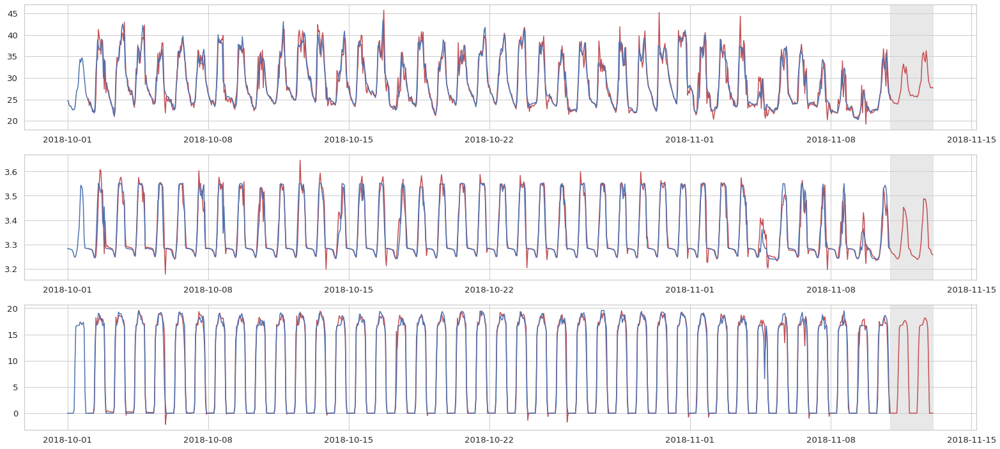

In [ ]:
#@title Set the parameters that give the lowest AIC for SARIMA and Forecast{ display-mode: "form" }

## setting initial values and some bounds for them
forecast_range = 50 #@param {type:"raw"}

p1, q1, P1, Q1 = result_table1.parameters[0]
p2, q2, P2, Q2 = result_table2.parameters[0]
p3, q3, P3, Q3 = result_table3.parameters[0]

SARIMAX_model1=sm.tsa.statespace.SARIMAX(serie_temp, order=(p1, d, q1), 
                                        seasonal_order=(P1, D, Q1, s)).fit(disp=-1)
SARIMAX_model2=sm.tsa.statespace.SARIMAX(serie_vbus, order=(p2, d, q2), 
                                        seasonal_order=(P2, D, Q2, s)).fit(disp=-1)
SARIMAX_model3=sm.tsa.statespace.SARIMAX(serie_vpanel, order=(p3, d, q3), 
                                        seasonal_order=(P3, D, Q3, s)).fit(disp=-1)                                                                              
print(SARIMAX_model1.summary())
print(SARIMAX_model2.summary())
print(SARIMAX_model3.summary())

sarima_serie1 = serie_temp.copy()
sarima_serie2 = serie_vbus.copy()
sarima_serie3 = serie_vpanel.copy()

sarima_serie1.columns = ['actual']
sarima_serie1['arima_model'] = SARIMAX_model1.fittedvalues
# making a shift on s+d steps, because these values were unobserved by the model
# due to the differentiating
sarima_serie1['arima_model'][:s+d] = np.NaN
# forecasting on n_steps forward 
forecast1 = SARIMAX_model1.predict(start = sarima_serie1.shape[0], end = sarima_serie1.shape[0]+forecast_range)
forecast1 = sarima_serie1.arima_model.append(forecast1)

sarima_serie2.columns = ['actual']
sarima_serie2['arima_model'] = SARIMAX_model2.fittedvalues
# making a shift on s+d steps, because these values were unobserved by the model
# due to the differentiating
sarima_serie2['arima_model'][:s+d] = np.NaN
# forecasting on n_steps forward 
forecast2 = SARIMAX_model2.predict(start = sarima_serie2.shape[0], end = sarima_serie2.shape[0]+forecast_range)
forecast2 = sarima_serie2.arima_model.append(forecast2)

sarima_serie3.columns = ['actual']
sarima_serie3['arima_model'] = SARIMAX_model3.fittedvalues
# making a shift on s+d steps, because these values were unobserved by the model
# due to the differentiating
sarima_serie3['arima_model'][:s+d] = np.NaN
# forecasting on n_steps forward 
forecast3 = SARIMAX_model3.predict(start = sarima_serie3.shape[0], end = sarima_serie3.shape[0]+forecast_range)
forecast3 = sarima_serie3.arima_model.append(forecast3)

# calculate error, again having shifted on s+d steps from the beginning
#error = mean_absolute_percentage_error(sarima_serie['actual'][s+d:], sarima_serie['arima_model'][s+d:])
#mae = mean_absolute_error(sarima_serie['actual'][s+d:], sarima_serie['arima_model'][s+d:])
#r2 = r2_score(sarima_serie['actual'][s+d:], sarima_serie['arima_model'][s+d:])

#print(f"Mean Absolute Percentage Error: {0:.3f}% MAE: {mae}, R2: {r2}")
fig, (ax1,ax2,ax3) = plt.subplots(3, 1, figsize=(22, 10))
ax1.plot(forecast1[-2000:], color='r', label="SARIMAX_model")
ax1.axvspan(sarima_serie1.index[-1], forecast1.index[-1], alpha=0.5, color='lightgrey')
ax1.plot(sarima_serie1.actual[-2000:], label="actual")

ax2.plot(forecast2[-2000:], color='r', label="SARIMAX_model")
ax2.axvspan(sarima_serie2.index[-1], forecast2.index[-1], alpha=0.5, color='lightgrey')
ax2.plot(sarima_serie2.actual[-2000:], label="actual")

ax3.plot(forecast3[-2000:], color='r', label="SARIMAX_model")
ax3.axvspan(sarima_serie3.index[-1], forecast3.index[-1], alpha=0.5, color='lightgrey')
ax3.plot(sarima_serie3.actual[-2000:], label="actual")

plt.tight_layout()
fig.savefig('ArimaForecast60MIN.pdf', bbox_inches='tight', dpi=300)
#plotSARIMA(serie, SARIMAX_model, forecast_range)

In [ ]:
P, D, Q, M = (0, 0, 0, 0)
p, d, q = (2, 0, 2)
forecast_range = 50

SARIMAX_model=sm.tsa.statespace.SARIMAX(serie_temp, order=(p, d, q), 
                                        seasonal_order=(P, D, Q, M)).fit(disp=-1)
print(SARIMAX_model.summary())
sarima_serie = serie_temp.copy()
sarima_serie.columns = ['actual']
sarima_serie['arima_model'] = SARIMAX_model.fittedvalues
# making a shift on s+d steps, because these values were unobserved by the model
# due to the differentiating
sarima_serie['arima_model'][:s+d] = np.NaN
# forecasting on n_steps forward 
forecast = SARIMAX_model.predict(start = sarima_serie.shape[0], end = sarima_serie.shape[0]+forecast_range)
forecast = sarima_serie.arima_model.append(forecast)

fig, ax1 = plt.subplots(1, 1, figsize=(18, 5))
ax1.plot(forecast[-2000:], color='r', label="SARIMAX_model")
ax1.axvspan(sarima_serie.index[-1], forecast.index[-1], alpha=0.5, color='lightgrey')
ax1.plot(sarima_serie.actual[-2000:], label="actual")

# Train or Load Forms

Training LSTM
Training model
Mean Absolute Error in Testing  0.044593544064414015
Mean Squared Error in Testing  0.004453277515158933
R2 Score in Testing  0.936886013612853
Root Mean Squared Error in Testing  0.06673288181368263


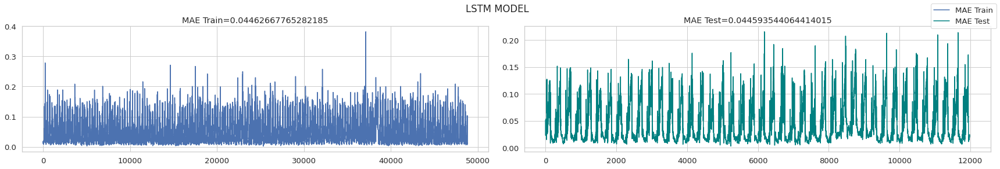

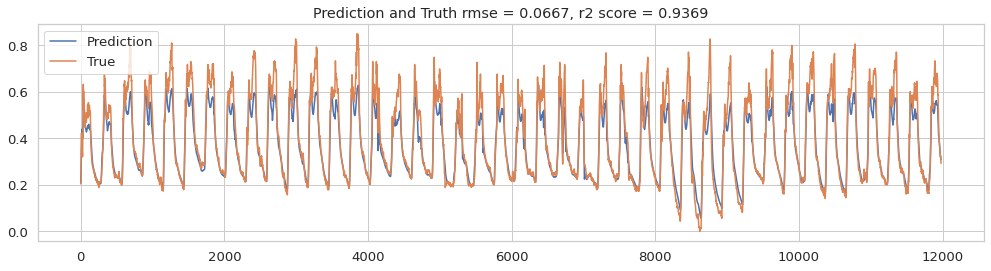

In [ ]:
#@title Train LSTM model{ display-mode: "form" }
train = True #@param ["False", "True"] {type:"raw"}
n_timesteps_in = 290 #@param {type:"slider", min:290, max:2030, step:290} 
n_timesteps_out = 12 #@param {type:"slider", min:4, max:16, step:2} 
n_hidden = 128 #@param {type:"slider", min:64, max:256, step:32}
epochs = 200  #@param {type:"slider", min:50, max:500, step:10}
batch_size = 245 #@param {type:"slider", min:120, max:350, step:5}

#n_timesteps_in = 290   # A day in samples
#n_timesteps_out = 12   # An hour in samples
n_features = 3         # 3 Features
#n_hidden = 128         # 128 units
#epochs = 200
#batch_size = 245       # DIvisor of the training set

#@markdown If you upload the models make sure to upload them all.

if train == False:
  print('UPLOAD ALL THE MODELS')
  ## To upload a file (or several) from your computer
  try:
    model_lstm = load_model(name='lstm_model')
  except:
    from google.colab import files
    files.upload()
    model_lstm = load_model(name='lstm_model')
else:
    print('Training LSTM')
    train_X, train_y = split_sequences_multivariate(normalized_train[:train_len], n_steps=n_timesteps_in)
    test_X, test_y = split_sequences_multivariate(normalized_train[train_len:], n_steps=n_timesteps_in)

    ###-------------LSTM MODEL--------------------------#####
    model_lstm = build_lstm(n_hidden, n_timesteps_in, n_features, dropout=0.2)
    ###-----------------------------------------------------

    optimizer = tf.keras.optimizers.Adam(lr=0.001)
    model_lstm.compile(loss='mean_squared_error', optimizer=optimizer, metrics=['mae'])

    early_stop = EarlyStopping(monitor='val_loss', patience=5)

    with tf.device('/device:GPU:0'):
      history_lstm = train_model(model_lstm, train_X, train_y, callbacks=[early_stop], epochs=epochs, batch_size=batch_size, patience=5, verbose=0)
      history_lstm_df = pd.DataFrame(history_lstm.history, columns=['mae', 'val_mae'])

    MAE_train, MAE_test, mae_overall_train, mae_overall_test, mse_test, r2_test, rmse_test = \
    get_errors(model_lstm, train_X, test_X, train_y, test_y)

    plot_mae_overall(MAE_train, MAE_test, mae_overall_train, mae_overall_test, suptitle='LSTM MODEL')

    plot_lstm(model_lstm, test_X, test_y, feature_index=0)

    print('Mean Absolute Error in Testing ',MAE_test)
    print('Mean Squared Error in Testing ',mse_test)
    print('R2 Score in Testing ',r2_test)
    print('Root Mean Squared Error in Testing ',rmse_test)
    ##---------------------------LSTM-------------------------------------------------


In [ ]:
#@title Find Input Timesteps LSTM{ display-mode: "form" }
start_from = 290 #@param {type:"slider", min:290, max:2030, step:290} 
end_in = 1450 #@param {type:"slider", min:290, max:2030, step:290}
epochs = 200  #@param {type:"slider", min:50, max:500, step:10}
batch_size = 245 #@param {type:"slider", min:120, max:350, step:5}
callback = 'earlyStop' #@param ["myCallback", "earlyStop"]
mae_val = 0.03  #@param {type:"slider", min:0.02, max:0.05, step:0.01}

n_timesteps_out = 12 #@param {type:"slider", min:4, max:16, step:2} 
n_hidden = 128 #@param {type:"slider", min:64, max:256, step:32}
epochs = 200  #@param {type:"slider", min:50, max:500, step:10}


#n_timesteps_in = 290   # A day in samples
#n_timesteps_out = 12   # An hour in samples
n_features = 3         # 3 Features
#n_hidden = 128         # 128 units
#epochs = 200
#batch_size = 245       # DIvisor of the training set
#mae_val = 0.03

MAE_test_list = []; mse_test_list=[]; r2_test_list=[]; rmse_test_list=[]

for ii in np.arange(start_from, end_in+1, step=290):
  train_X, train_y = split_sequences_multivariate(normalized_train[:train_len], n_steps=ii)
  test_X, test_y = split_sequences_multivariate(normalized_train[train_len:], n_steps=ii)

  ###-------------LSTM MODEL--------------------------#####
  model_lstm = build_lstm(n_hidden, ii, n_features, dropout=0.2)
  ###-----------------------------------------------------

  optimizer = tf.keras.optimizers.Adam(lr=0.001)
  model_lstm.compile(loss='mean_squared_error', optimizer=optimizer, metrics=['mae'])

  early_stop = EarlyStopping(monitor='val_loss', patience=5)

  with tf.device('/device:GPU:0'):
    history_lstm = train_model(model_lstm, train_X, train_y, callbacks=[early_stop], epochs=epochs, batch_size=batch_size, patience=5, verbose=0)
    history_lstm_df = pd.DataFrame(history_lstm.history, columns=['mae', 'val_mae'])

  MAE_train, MAE_test, mae_overall_train, mae_overall_test, mse_test, r2_test, rmse_test = \
  get_errors(model_lstm, train_X, test_X, train_y, test_y)

  MAE_test_list.append(MAE_test)
  mse_test_list.append(mse_test) 
  r2_test_list.append(r2_test)
  rmse_test_list.append(rmse_test)

errors_lstm_timesteps = pd.DataFrame(np.column_stack([MAE_test_list, mse_test_list, r2_test_list, rmse_test_list]),
                                      columns=['MAE_ATT', 'mse_ATT', 'r2_ATT', 'rmse_ATT'])
errors_lstm_timesteps.to_csv('errors_lstm_timesteps.csv')

Training model
Training model
Training model
Training model
Training model


Training model
Mean Absolute Error in Testing  0.08210330292820771
Mean Squared Error in Testing  0.01418933582911684
R2 Score in Testing  0.832948999077745
Root Mean Squared Error in Testing  0.11911899860692601
Saved model to disk


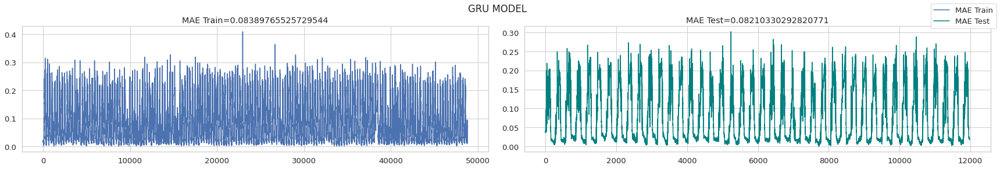

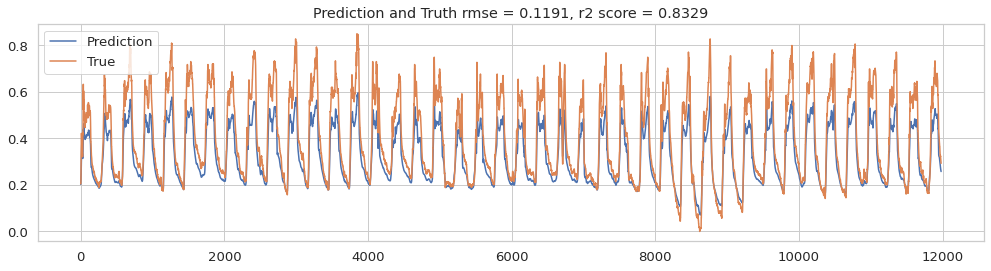

In [ ]:
#@title Train GRU model{ display-mode: "form" }
train = True #@param ["False", "True"] {type:"raw"}
n_timesteps_in = 290 #@param {type:"slider", min:290, max:2030, step:290} 
n_timesteps_out = 12 #@param {type:"slider", min:4, max:16, step:2} 
n_hidden = 128 #@param {type:"slider", min:64, max:256, step:32}
epochs = 200  #@param {type:"slider", min:50, max:500, step:10}
batch_size = 245 #@param {type:"slider", min:120, max:350, step:5}

#n_timesteps_in = 290   # A day in samples
#n_timesteps_out = 12   # An hour in samples
n_features = 3         # 3 Features
#n_hidden = 128         # 128 units
#epochs = 200
#batch_size = 245       # DIvisor of the training set

if train == False:
  print('UPLOAD ALL THE MODELS')
  ## To upload a file (or several) from your computer
  try:
    model_gru = load_model(name='gru_model')
  except:
    from google.colab import files
    files.upload()
    model_gru = load_model(name='gru_model')
else:
  model_gru = build_GRU(n_hidden, n_timesteps_in, n_features, dropout=0.2)

  optimizer = tf.keras.optimizers.Adam(lr=0.001)
  model_gru.compile(loss='mean_squared_error', optimizer=optimizer, metrics=['mae'])

  history_gru = train_model(model_gru, train_X, train_y, callbacks=[early_stop], epochs=epochs, batch_size=batch_size, patience=5, verbose=0)
  history_gru_df = pd.DataFrame(history_gru.history, columns=['mae', 'val_mae'])

  MAE_train, MAE_test, mae_overall_train, mae_overall_test, mse_test, r2_test, rmse_test = \
  get_errors(model_gru, train_X, test_X, train_y, test_y)

  plot_mae_overall(MAE_train, MAE_test, mae_overall_train, mae_overall_test, suptitle='GRU MODEL')

  plot_lstm(model_gru, test_X, test_y, feature_index=0)

  print('Mean Absolute Error in Testing ',MAE_test)
  print('Mean Squared Error in Testing ',mse_test)
  print('R2 Score in Testing ',r2_test)
  print('Root Mean Squared Error in Testing ',rmse_test)

  serialize_model(model_gru, history_lstm_df,name='gru_model')

Training CNN
Training model
Mean Absolute Error in Testing  0.08031157208946632
Mean Squared Error in Testing  0.01060932042294277
R2 Score in Testing  0.9035920075166191
Root Mean Squared Error in Testing  0.10300155543943387
Saved model to disk


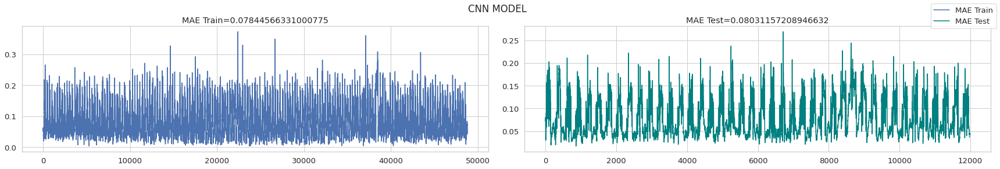

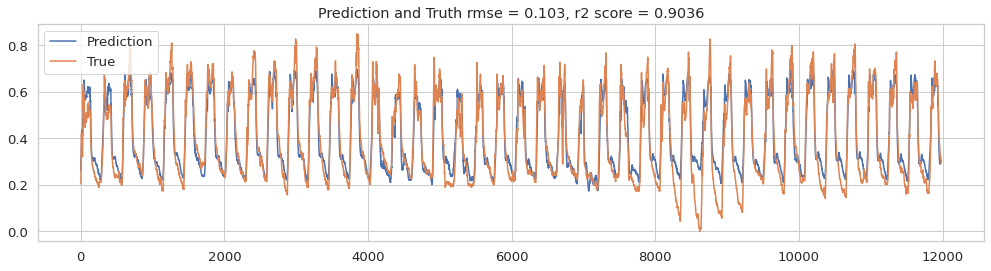

In [ ]:
#@title Train CNN model{ display-mode: "form" }
train = True #@param ["False", "True"] {type:"raw"}
n_timesteps_in = 290 #@param {type:"slider", min:290, max:2030, step:290} 
n_timesteps_out = 12 #@param {type:"slider", min:4, max:16, step:2} 
n_hidden = 128 #@param {type:"slider", min:64, max:256, step:32}
epochs = 200  #@param {type:"slider", min:50, max:500, step:10}
batch_size = 245 #@param {type:"slider", min:120, max:350, step:5}

#n_timesteps_in = 290   # A day in samples
#n_timesteps_out = 12   # An hour in samples
n_features = 3         # 3 Features
#n_hidden = 128         # 128 units
#epochs = 200
#batch_size = 245       # DIvisor of the training set

if train == False:
  print('UPLOAD ALL THE MODELS')
  ## To upload a file (or several) from your computer
  try:
    model_cnn = load_model(name='cnn_model')
  except:
    from google.colab import files
    files.upload()
    model_cnn = load_model(name='cnn_model')
else:
  print('Training CNN')
  train_X, train_y = split_sequences_multivariate(normalized_train[:train_len], n_steps=n_timesteps_in)
  test_X, test_y = split_sequences_multivariate(normalized_train[train_len:], n_steps=n_timesteps_in)
  
  model_cnn = Model_cnn(input_shape=(n_timesteps_in, n_features), filters=64,
                        kernel_size=3, dropout=0.2, LSTM=False)

  optimizer = tf.keras.optimizers.Adam(lr=0.01)
  model_cnn.compile(loss='mean_squared_error', optimizer=optimizer, metrics=['mae'])
  early_stop = EarlyStopping(monitor='val_loss', patience=5)

  history_cnn = train_model(model_cnn, train_X, train_y, callbacks=[early_stop], epochs=epochs, batch_size=batch_size, patience=5, verbose=0)
  history_cnn_df = pd.DataFrame(history_cnn.history, columns=['mae', 'val_mae'])

  MAE_train, MAE_test, mae_overall_train, mae_overall_test, mse_test, r2_test, rmse_test = \
  get_errors(model_cnn, train_X, test_X, train_y, test_y)

  plot_mae_overall(MAE_train, MAE_test, mae_overall_train, mae_overall_test, suptitle='CNN MODEL')

  plot_lstm(model_cnn, test_X, test_y, feature_index=0)

  print('Mean Absolute Error in Testing ',MAE_test)
  print('Mean Squared Error in Testing ',mse_test)
  print('R2 Score in Testing ',r2_test)
  print('Root Mean Squared Error in Testing ',rmse_test)

  serialize_model(model_cnn, history_cnn_df,name='cnn_model')

In [ ]:
#@title Hyperparamters Tuning{ display-mode: "form" }

#@markdown An important hyperparameter for the CNN is the number of filter maps. We can experiment with a range of different values, from less to many more than the 64 used in the first model that we developed.

#@markdown ### Changing size of Kernel
#@markdown The size of the kernel is another important hyperparameter of the 1D CNN to tune. The kernel size controls the number of time steps consider in each “read” of the input sequence, that is then projected onto the feature map (via the convolutional process).
#@markdown A large kernel size means a less rigorous reading of the data, but may result in a more generalized snapshot of the input.

n_params = [16, 32, 64, 128, 256]

scores = list()
history_df_list = list()
model_list = list()

for ii in range(len(n_params)):
    train_X, train_y = split_sequences_multivariate(normalized_train[:train_len], n_steps=n_timesteps_in)
    test_X, test_y = split_sequences_multivariate(normalized_train[train_len:], n_steps=n_timesteps_in)
    
    model_cnn = Model_cnn(input_shape=(n_timesteps_in, n_features), filters=n_params[ii],
                        kernel_size=3, dropout=0.2, LSTM=False)
    optimizer = tf.keras.optimizers.Adam(lr=0.01)
    model_cnn.compile(loss='mean_squared_error', optimizer=optimizer, metrics=['mae'])
    early_stop = EarlyStopping(monitor='val_loss', patience=5)
    
    history_cnn = train_model(model_cnn, train_X, train_y, callbacks=[early_stop], epochs=epochs, batch_size=batch_size, patience=5, verbose=0)
    #history_cnn_df = pd.DataFrame(history_cnn.history, columns=['mae', 'val_mae'])

    #history_df_list.append(history_cnn_df)
    #model_list.append(model_cnn)
    MAE_train, MAE_test, mae_overall_train, mae_overall_test, mse_test, r2_test, rmse_test = \
    get_errors(model_cnn, train_X, test_X, train_y, test_y)
    scores.append(rmse_test)
    print('R2 of {} with {} filters'.format(r2_test, n_params[ii]))

Training model
R2 of 0.6621230087776465 with 16 filters
Training model
R2 of 0.6282705169515231 with 32 filters
Training model
R2 of 0.7222166489819637 with 64 filters
Training model
R2 of 0.8843549325647903 with 128 filters
Training model
R2 of 0.7237882710270357 with 256 filters


Training model
Mean Absolute Error in Testing  0.0905035091915394
Mean Squared Error in Testing  0.0138275496856192
R2 Score in Testing  0.8361901723547178
Root Mean Squared Error in Testing  0.11759060202932546
Saved model to disk


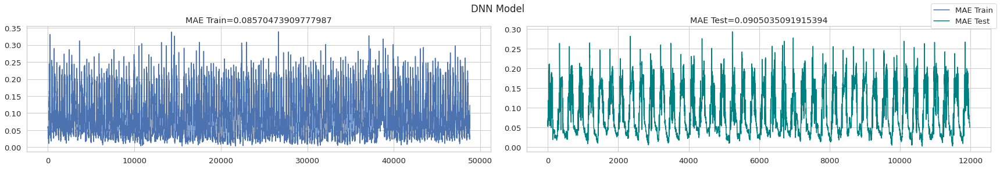

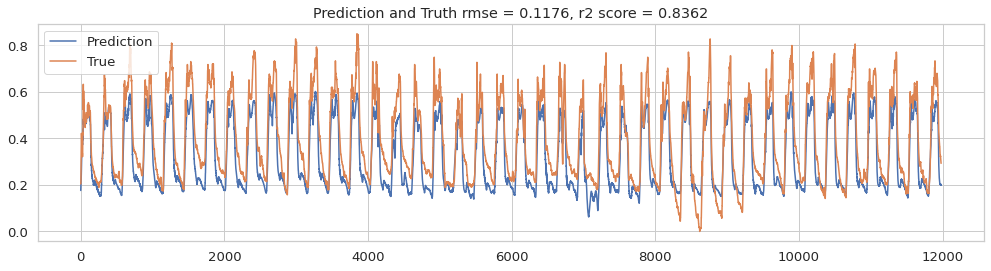

In [ ]:
#@title Train DNN model{ display-mode: "form" }
train = True #@param ["False", "True"] {type:"raw"}
n_timesteps_in = 290 #@param {type:"slider", min:290, max:2030, step:290} 
n_timesteps_out = 12 #@param {type:"slider", min:4, max:16, step:2} 
n_hidden = 128 #@param {type:"slider", min:64, max:256, step:32}
epochs = 200  #@param {type:"slider", min:50, max:500, step:10}
batch_size = 245 #@param {type:"slider", min:120, max:350, step:5}

#n_timesteps_in = 290   # A day in samples
#n_timesteps_out = 12   # An hour in samples
n_features = 3         # 3 Features
#n_hidden = 128         # 128 units
#epochs = 200
#batch_size = 245       # DIvisor of the training set

if train == False:
  print('UPLOAD ALL THE MODELS')
  ## To upload a file (or several) from your computer
  try:
    model_dnn = load_model(name='dnn_model')
  except:
    from google.colab import files
    files.upload()
    model_dnn = load_model(name='dnn_model')
else:
  train_X, train_y = split_sequences_multivariate(normalized_train[:train_len], n_steps=n_timesteps_in)
  test_X, test_y = split_sequences_multivariate(normalized_train[train_len:], n_steps=n_timesteps_in)

  model_dnn = Model_dnn(units=64, input_shape=(n_timesteps_in, n_features))

  optimizer = tf.keras.optimizers.Adam(lr=0.01)
  model_dnn.compile(loss='mean_squared_error', optimizer=optimizer, metrics=['mae'])

  early_stop = EarlyStopping(monitor='val_loss', patience=5)

  history_dnn = train_model(model_dnn, train_X, train_y, callbacks=[early_stop],
                            epochs=100, batch_size=256, patience=5, verbose=0)
  history_dnn_df = pd.DataFrame(history_dnn.history, columns=['mae', 'val_mae'])

  MAE_train, MAE_test, mae_overall_train, mae_overall_test, mse_test, r2_test, rmse_test = \
  get_errors(model_dnn, train_X, test_X, train_y, test_y)

  plot_mae_overall(MAE_train, MAE_test, mae_overall_train, mae_overall_test, suptitle='DNN Model')

  plot_lstm(model_dnn, test_X, test_y, feature_index=0)

  print('Mean Absolute Error in Testing ',MAE_test)
  print('Mean Squared Error in Testing ',mse_test)
  print('R2 Score in Testing ',r2_test)
  print('Root Mean Squared Error in Testing ',rmse_test)

  serialize_model(model_dnn, history_dnn_df,name='dnn_model')

Epoch 1/500
143/143 [==============================] - 60s 401ms/step - loss: 0.0692 - mae: 0.1737 - val_loss: 0.0220 - val_mae: 0.1008
Epoch 2/500
143/143 [==============================] - 57s 400ms/step - loss: 0.0109 - mae: 0.0659 - val_loss: 0.0272 - val_mae: 0.1084
Mean Absolute Error in Testing  0.10996508724061606
Mean Squared Error in Testing  0.027149821075818186
R2 Score in Testing  0.7614234545308367
Root Mean Squared Error in Testing  0.164772027589085
Saved model to disk


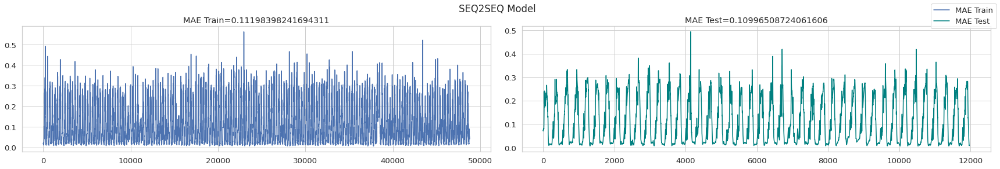

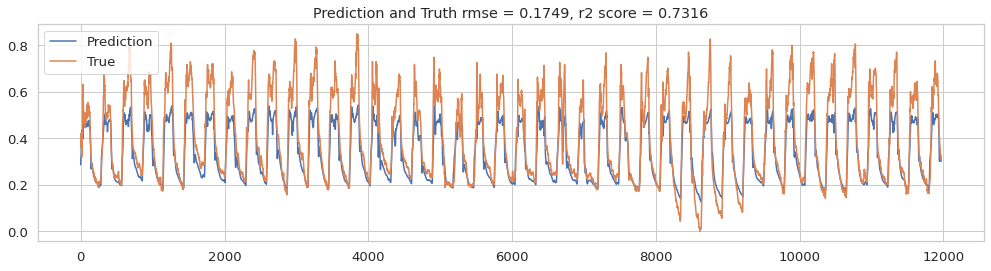

In [ ]:
#@title Train SEQ2SEQ model{ display-mode: "form" }
train = True #@param ["False", "True"] {type:"raw"}
n_timesteps_in = 290 #@param {type:"slider", min:290, max:2030, step:290} 
n_timesteps_out = 12 #@param {type:"slider", min:4, max:16, step:2} 
n_hidden = 128 #@param {type:"slider", min:64, max:256, step:32}
epochs = 200  #@param {type:"slider", min:50, max:500, step:10}
batch_size = 245 #@param {type:"slider", min:120, max:350, step:5}

#n_timesteps_in = 290   # A day in samples
#n_timesteps_out = 12   # An hour in samples
n_features = 3         # 3 Features
#n_hidden = 128         # 128 units
#epochs = 200
#batch_size = 245       # DIvisor of the training set

if train == False:
  print('UPLOAD ALL THE MODELS')
  ## To upload a file (or several) from your computer
  try:
    model_seq = load_model(name='seq_model')
  except:
    from google.colab import files
    files.upload()
    model_seq = load_model(name='seq_model')

else:
  tf.compat.v1.logging.set_verbosity(tf.compat.v1.logging.ERROR)

  n_timesteps_in = 290   # A day in samples
  n_timesteps_out = 12   # An hour in samples
  n_features = 3
  n_hidden = 128
  epochs = 500
  batch_size = 245

  train_X, train_y = multi_step_output(normalized_train[:train_len], n_steps_in=n_timesteps_in, n_steps_out=n_timesteps_out)
  test_X, test_y = multi_step_output(normalized_train[train_len:], n_steps_in=n_timesteps_in, n_steps_out=n_timesteps_out)

  model_seq = Model_Seq(n_hidden=n_hidden, input_shape=(n_timesteps_in, n_features), output_shape=(n_timesteps_out, n_features), dropout=0.2)

  optimizer = tf.keras.optimizers.Adam(lr=0.001)

  # Added this part new-------------------
  #lr_schedule = tf.keras.callbacks.LearningRateScheduler(lambda epoch: 1e-8 * 10**(epoch / 20))  
  #optimizer = tf.keras.optimizers.Adam(lr=1e-8)
  #----------------------------
  model_seq.compile(loss='mean_squared_error', optimizer=optimizer, metrics=['mae'])

  early_stop = EarlyStopping(monitor='val_loss', patience=1)
  fig = tf.keras.utils.plot_model(model_seq, to_file='model_seq.pdf', show_shapes=True, show_layer_names=True, dpi=300)

  %timeit
  history_seq = train_model(model_seq, train_X, train_y, callbacks=[early_stop], epochs=epochs, verbose=1)

  history_seq_df = pd.DataFrame(history_seq.history, columns=['mae', 'val_mae'])

  MAE_train, MAE_test, mae_overall_train, mae_overall_test, mse_test, r2_test, rmse_test = \
  get_errors(model_seq, train_X, test_X, train_y, test_y)

  plot_mae_overall(MAE_train, MAE_test, mae_overall_train, mae_overall_test, suptitle='SEQ2SEQ Model')

  plot_single_seq(model_seq, test_X, test_y)

  print('Mean Absolute Error in Testing ',MAE_test)
  print('Mean Squared Error in Testing ',mse_test)
  print('R2 Score in Testing ',r2_test)
  print('Root Mean Squared Error in Testing ',rmse_test)

  #plt.semilogx(history_seq.history["lr"], history_seq.history["loss"])
  #plt.axis([1e-8, 1e-4, 0, 1])

  serialize_model(model_seq, history_seq_df,name='seq_model')

In [ ]:
#@title Find Input Timesteps{ display-mode: "form" }
start_from = 290 #@param {type:"slider", min:290, max:2030, step:290} 
end_in = 1450 #@param {type:"slider", min:290, max:2030, step:290}
epochs = 200  #@param {type:"slider", min:50, max:500, step:10}
batch_size = 245 #@param {type:"slider", min:120, max:350, step:5}
callback = 'earlyStop' #@param ["myCallback", "earlyStop"]
mae_val = 0.03  #@param {type:"slider", min:0.02, max:0.05, step:0.01}

n_timesteps_out = 12 #@param {type:"slider", min:4, max:16, step:2} 
n_hidden = 128 #@param {type:"slider", min:64, max:256, step:32}
epochs = 200  #@param {type:"slider", min:50, max:500, step:10}


#n_timesteps_in = 290   # A day in samples
#n_timesteps_out = 12   # An hour in samples
n_features = 3         # 3 Features
#n_hidden = 128         # 128 units
#epochs = 200
#batch_size = 245       # DIvisor of the training set
#mae_val = 0.03

MAE_test_list = []; mse_test_list=[]; r2_test_list=[]; rmse_test_list=[]

for ii in np.arange(start_from, end_in+1, step=290):
  train_X, train_y = multi_step_output(normalized_train[:train_len], n_steps_in=ii, n_steps_out=n_timesteps_out)
  test_X, test_y = multi_step_output(normalized_train[train_len:], n_steps_in=ii, n_steps_out=n_timesteps_out)

  model_att = Model_Attention(n_hidden=n_hidden, input_shape=(ii, n_features),
                              output_shape=(n_timesteps_out, n_features), dropout=0.2)

  optimizer = tf.keras.optimizers.Adam(lr=0.001)
  model_att.compile(loss='mean_squared_error', optimizer=optimizer, metrics=['mae'])
  
  dot_img_file = '/tmp/model_att.pdf'

  if callback == 'myCallback':
    callback = myCallback(mae=0.03)
  else:
    callback = tf.keras.callbacks.EarlyStopping(monitor='val_mae', patience=3)

  history_att = train_model(model_att, train_X, train_y, epochs=epochs,
                        batch_size=batch_size, patience=5,
                        validation_split=0.20, verbose=0,
                        callbacks=callback)

  MAE_train, MAE_test, mae_overall_train, mae_overall_test, mse_test, r2_test, rmse_test = \
  get_errors(model_att, train_X, test_X, train_y, test_y)

  MAE_test_list.append(MAE_test)
  mse_test_list.append(mse_test) 
  r2_test_list.append(r2_test)
  rmse_test_list.append(rmse_test)

errors_att_timesteps = pd.DataFrame(np.column_stack([MAE_test_list, mse_test_list, r2_test_list, rmse_test_list]),
                                      columns=['MAE_ATT', 'mse_ATT', 'r2_ATT', 'rmse_ATT'])
errors_att_timesteps.to_csv('errors_att_timesteps.csv')


Training model
Training model
Training model
Training model
Training model


Model: "model_5"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_11 (InputLayer)           [(None, 290, 3)]     0                                            
__________________________________________________________________________________________________
lstm_10 (LSTM)                  [(None, 290, 128), ( 67584       input_11[0][0]                   
__________________________________________________________________________________________________
repeat_vector_5 (RepeatVector)  (None, 12, 128)      0           lstm_10[0][1]                    
__________________________________________________________________________________________________
lstm_11 (LSTM)                  (None, 12, 128)      131584      repeat_vector_5[0][0]            
                                                                 lstm_10[0][1]              

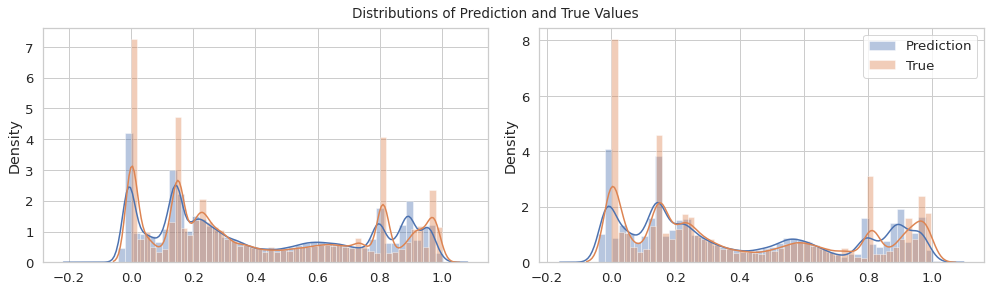

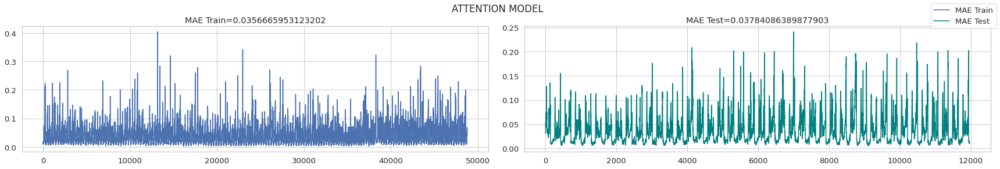

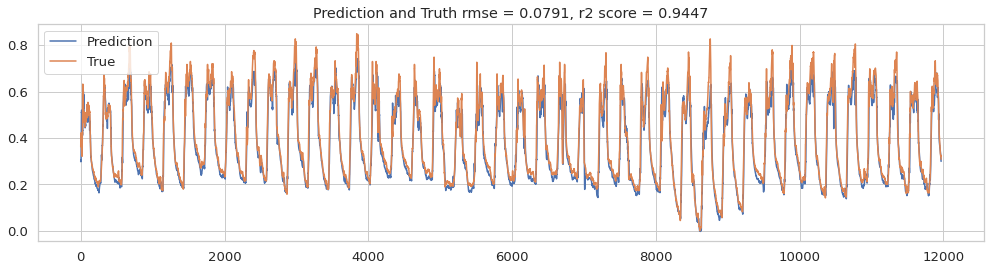

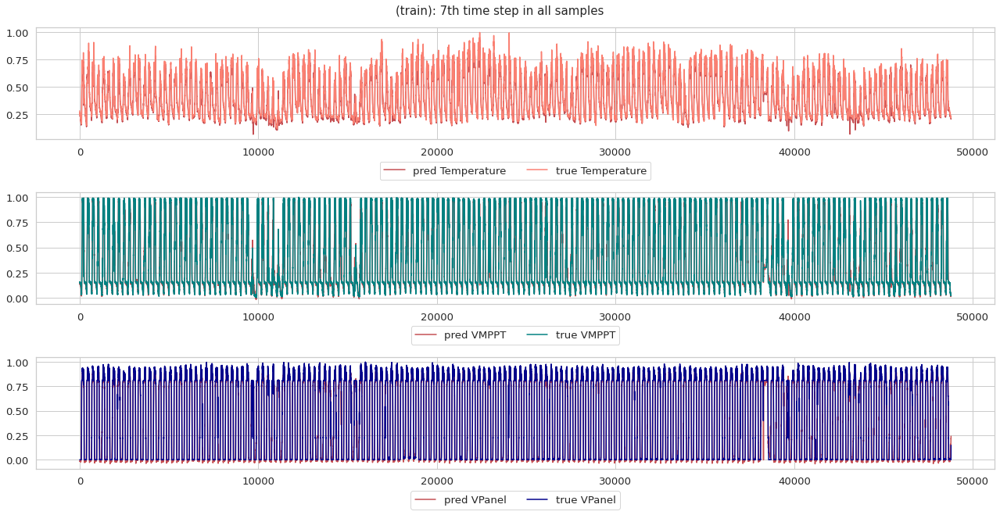

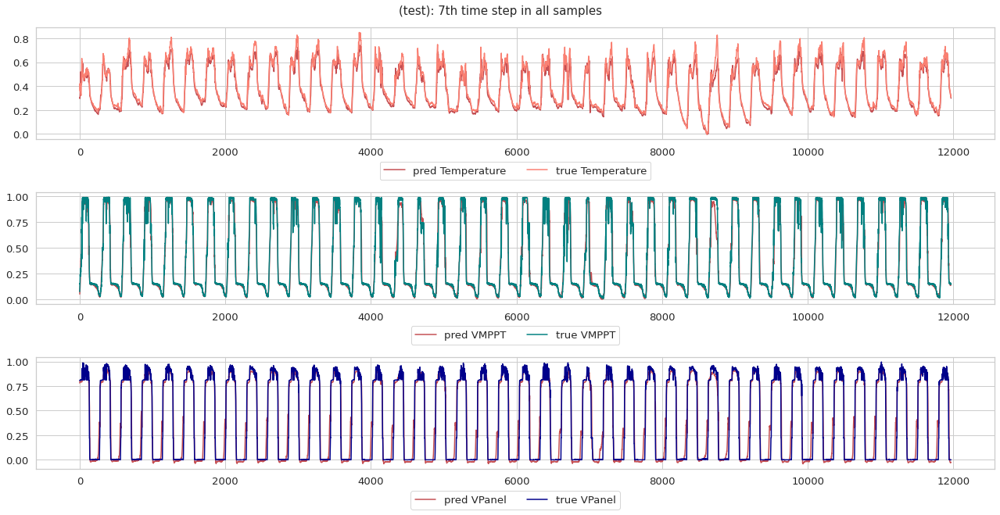

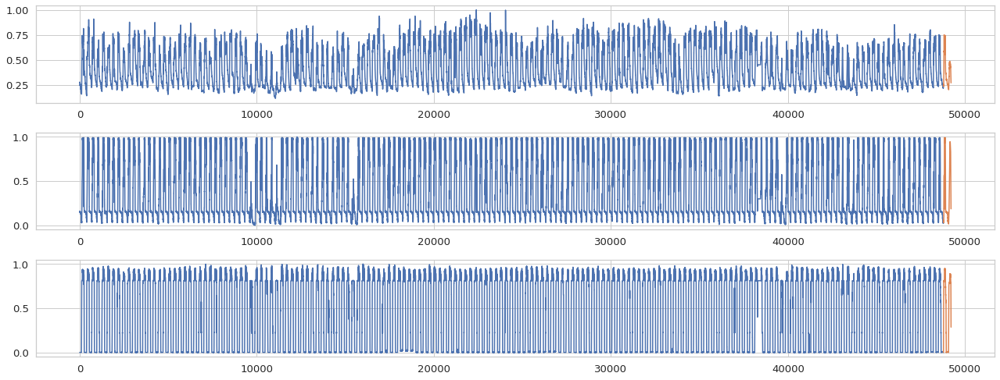

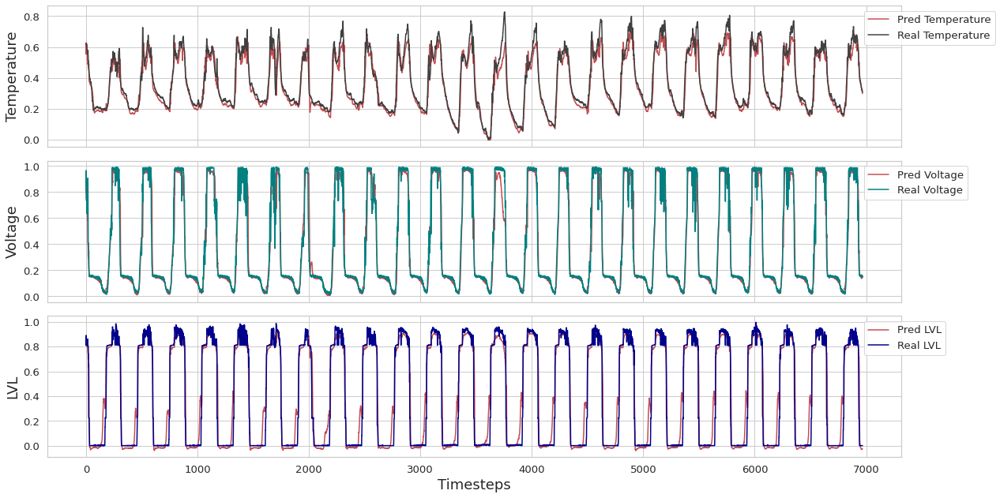

In [ ]:
#@title Train ATT model{ display-mode: "form" }
train = True #@param ["False", "True"] {type:"raw"}
n_timesteps_in = 290 #@param {type:"slider", min:290, max:2030, step:290} 
n_timesteps_out = 12 #@param {type:"slider", min:4, max:16, step:2} 
n_hidden = 128 #@param {type:"slider", min:64, max:256, step:32}
epochs = 200  #@param {type:"slider", min:50, max:500, step:10}
batch_size = 245 #@param {type:"slider", min:120, max:350, step:5}
callback = 'earlyStop' #@param ["myCallback", "earlyStop"]
mae_val = 0.02  #@param {type:"slider", min:0.02, max:0.05, step:0.01}


#n_timesteps_in = 290   # A day in samples
#n_timesteps_out = 12   # An hour in samples
n_features = 3         # 3 Features
#n_hidden = 128         # 128 units
#epochs = 200
#batch_size = 245       # DIvisor of the training set
#mae_val = 0.03

if train == False:
  print('UPLOAD ALL THE MODELS')
  ## To upload a file (or several) from your computer
  try:
    model_att = load_model(name='Att_model')
  except:
    from google.colab import files
    files.upload()
    model_att = load_model(name='Att_model')
else:
  #tf.keras.backend.clear_session()

  train_X, train_y = multi_step_output(normalized_train[:train_len], n_steps_in=n_timesteps_in, n_steps_out=n_timesteps_out)
  test_X, test_y = multi_step_output(normalized_train[train_len:], n_steps_in=n_timesteps_in, n_steps_out=n_timesteps_out)

  model_att = Model_Attention(n_hidden=n_hidden, input_shape=(n_timesteps_in, n_features),
                              output_shape=(n_timesteps_out, n_features), dropout=0.2)

  optimizer = tf.keras.optimizers.Adam(lr=0.001)
  model_att.compile(loss='mean_squared_error', optimizer=optimizer, metrics=['mae'])
  fig = tf.keras.utils.plot_model(model_att, to_file='model.pdf', show_shapes=True, show_layer_names=True, dpi=80)
  #fig.savefig('Points_Transmitted.pdf', bbox_inches='tight')

  model_att.summary()
  dot_img_file = '/tmp/model_att.pdf'
  tf.keras.utils.plot_model(model_att, to_file=dot_img_file, show_shapes=True, show_layer_names=False)

  if callback == 'myCallback':
    callback = myCallback(mae=0.03)
  else:
    callback = tf.keras.callbacks.EarlyStopping(monitor='val_mae', patience=3)

  history_att = train_model(model_att, train_X, train_y, epochs=epochs,
                        batch_size=batch_size, patience=5,
                        validation_split=0.20, verbose=1,
                        callbacks=callback)

  history_df = pd.DataFrame(history_att.history, columns=['mae', 'val_mae'])

  plot_distribution_error(model_att, train_X, test_X, train_y, test_y)

  MAE_train, MAE_test, mae_overall_train, mae_overall_test, mse_test, r2_test, rmse_test = \
  get_errors(model_att, train_X, test_X, train_y, test_y)

  plot_mae_overall(MAE_train, MAE_test, mae_overall_train, mae_overall_test, suptitle='ATTENTION MODEL')
  plot_single_seq(model_att, test_X, test_y)

  plot_predictions(model_att, train_X, test_X, train_y, test_y)

  forecast_att(model_att, train_X, train_y, forecast_range=12)

  print('Mean Absolute Error in Testing ',MAE_test)
  print('Mean Squared Error in Testing ',mse_test)
  print('R2 Score in Testing ',r2_test)
  print('Root Mean Squared Error in Testing ',rmse_test)

  serialize_model(model_att, history_df,name='Att_model')

#train_predictions = model_att.predict(train_X)
test_predictions = model_att.predict(test_X)
data_final = dict(test_pred=test_predictions[5000:], test_true=test_y[5000:])

# Number of time steps in the future, as increases the accuracy decreases
ith_timestep = 7

fig, axx = plt.subplots(3,1,figsize=(18,9), sharex=True)
for i, x_lbl, clr,axi in zip([0, 1, 2], ['Temperature', 'Voltage','LVL'], [colors['GRAY2'], 'teal','darkblue'], axx):
    axi.plot(data_final['test'+'_pred'][:, ith_timestep, i], linestyle='-', color='r', label='Pred '+x_lbl)
    axi.plot(data_final['test'+'_true'][:, ith_timestep, i], linestyle='-', color=clr, label='Real '+x_lbl)
    axi.legend(bbox_to_anchor=(0.95, 1), loc='upper left')
    axi.set_ylabel(x_lbl, fontsize=18)
plt.xlabel('Timesteps', fontsize=18)
plt.tight_layout()

fig.savefig('PredAndTruth.pdf', bbox_inches='tight', dpi=300)

# Train Models

### LSTM EVALUATION

In [ ]:
n_timesteps_in = 290   # A day in samples
n_timesteps_out = 12   # An hour in samples
n_features = 3         # 3 Features
n_hidden = 128         # 128 units
epochs = 200
batch_size = 245       # DIvisor of the training set

train_X, train_y = split_sequences_multivariate(normalized_train[:train_len], n_steps=n_timesteps_in)
test_X, test_y = split_sequences_multivariate(normalized_train[train_len:], n_steps=n_timesteps_in)

###-------------LSTM MODEL--------------------------#####
model_lstm = build_lstm(n_hidden, n_timesteps_in, n_features, dropout=0.2)
###-----------------------------------------------------

optimizer = tf.keras.optimizers.Adam(lr=0.001)
model_lstm.compile(loss='mean_squared_error', optimizer=optimizer, metrics=['mae'])

early_stop = EarlyStopping(monitor='val_loss', patience=5)

with tf.device('/device:GPU:0'):
  history_lstm = train_model(model_lstm, train_X, train_y, callbacks=[early_stop], epochs=epochs, batch_size=batch_size, patience=5, verbose=0)
  history_lstm_df = pd.DataFrame(history_lstm.history, columns=['mae', 'val_mae'])

Training model


Mean Absolute Error in Testing  0.050023990004263934
Mean Squared Error in Testing  0.006636314023331717
R2 Score in Testing  0.8828995943310165
Root Mean Squared Error in Testing  0.08146357482538878


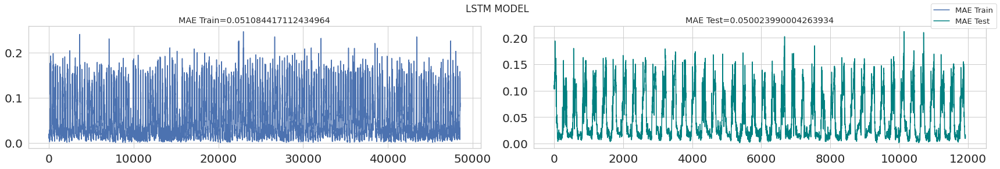

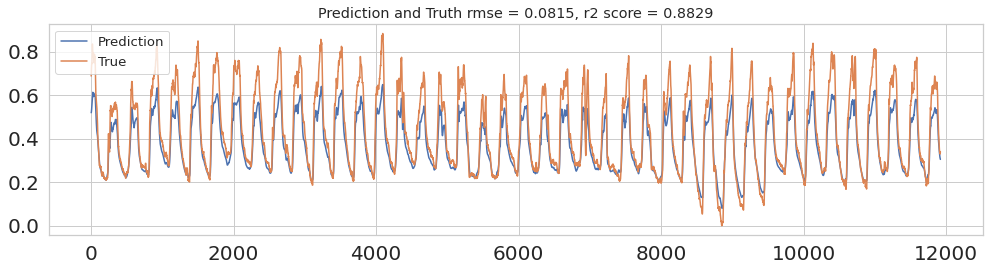

In [ ]:
MAE_train, MAE_test, mae_overall_train, mae_overall_test, mse_test, r2_test, rmse_test = \
get_errors(model_lstm, train_X, test_X, train_y, test_y)

plot_mae_overall(MAE_train, MAE_test, mae_overall_train, mae_overall_test, suptitle='LSTM MODEL')

plot_lstm(model_lstm, test_X, test_y, feature_index=0)

print('Mean Absolute Error in Testing ',MAE_test)
print('Mean Squared Error in Testing ',mse_test)
print('R2 Score in Testing ',r2_test)
print('Root Mean Squared Error in Testing ',rmse_test)

In [ ]:
serialize_model(model_lstm, history_lstm_df,name='lstm_model')

Saved model to disk


## GRU

### GRU MODEL BUILD

In [ ]:
def build_GRU(units, n_timesteps_in, n_features, dropout=0.2):

  input_shape = (n_timesteps_in, n_features)
  
  #tf.keras.backend.clear_session()
  model_gru = tf.keras.models.Sequential()

  model_gru.add(tf.keras.layers.GRU(units=units, dropout=dropout, return_sequences=True, input_shape=input_shape)) 
  model_gru.add(tf.keras.layers.GRU(units=units, input_shape=input_shape, return_sequences=False, dropout=dropout))
  #model_gru.add(tf.keras.layers.GRU(units=units, input_shape=input_shape, return_sequences=False, dropout=dropout))
  
  #model_gru.add(tf.keras.layers.BatchNormalization())
  model_gru.add(tf.keras.layers.Dense(120))
  model_gru.add(tf.keras.layers.Dense(n_features))

  return model_gru
###-----------------------------------------------------

### GRU EVALUATION

In [ ]:
n_timesteps_in = 290   # A day in samples
n_timesteps_out = 12   # An hour in samples
n_features = 3         # 3 Features
n_hidden = 128         # 128 units
epochs = 200
batch_size = 245       # DIvisor of the training set

model_gru = build_GRU(n_hidden, n_timesteps_in, n_features, dropout=0.2)

optimizer = tf.keras.optimizers.Adam(lr=0.001)
model_gru.compile(loss='mean_squared_error', optimizer=optimizer, metrics=['mae'])

history_gru = train_model(model_gru, train_X, train_y, callbacks=[early_stop], epochs=epochs, batch_size=batch_size, patience=5, verbose=0)
history_gru_df = pd.DataFrame(history_gru.history, columns=['mae', 'val_mae'])

Training model


Mean Absolute Error in Testing  0.05546230837046441
Mean Squared Error in Testing  0.007933826071691172
R2 Score in Testing  0.8679828495172005
Root Mean Squared Error in Testing  0.08907202743673892


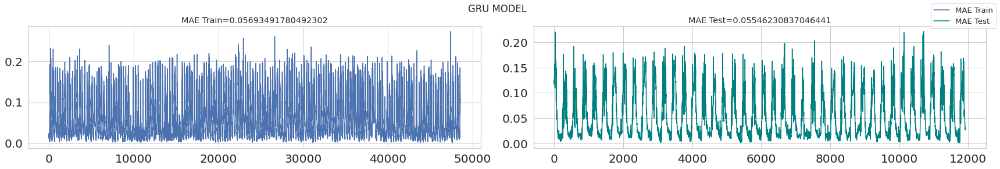

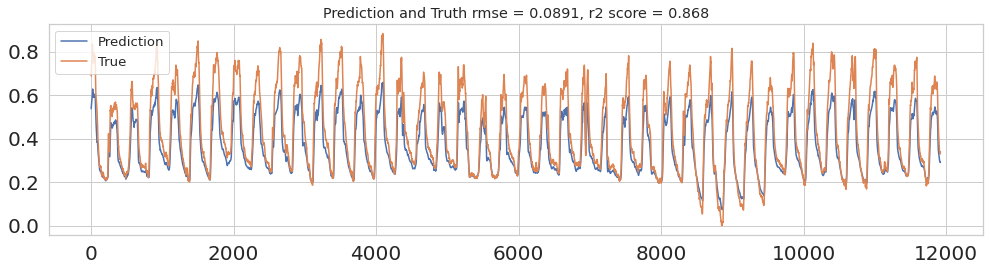

In [ ]:
MAE_train, MAE_test, mae_overall_train, mae_overall_test, mse_test, r2_test, rmse_test = \
get_errors(model_gru, train_X, test_X, train_y, test_y)

plot_mae_overall(MAE_train, MAE_test, mae_overall_train, mae_overall_test, suptitle='GRU MODEL')

plot_lstm(model_gru, test_X, test_y, feature_index=0)

print('Mean Absolute Error in Testing ',MAE_test)
print('Mean Squared Error in Testing ',mse_test)
print('R2 Score in Testing ',r2_test)
print('Root Mean Squared Error in Testing ',rmse_test)

In [ ]:
serialize_model(model_gru, history_lstm_df,name='gru_model')

Saved model to disk


## CNN

#### CNN MODEL BUILD

In [ ]:
def Model_cnn(input_shape, units=128, filters=64, kernel_size=3, dropout=0.2, LSTM=False):
  #tf.keras.backend.clear_session()
  model = tf.keras.models.Sequential()

  if LSTM==False:
    model.add(tf.keras.layers.Conv1D(filters=32, kernel_size=kernel_size, input_shape=input_shape,
                                     activation='relu')) 
    model.add(tf.keras.layers.MaxPooling1D(pool_size=2))
    model.add(tf.keras.layers.Conv1D(filters=64, kernel_size=kernel_size, activation='relu'))
    model.add(tf.keras.layers.MaxPooling1D(pool_size=2))
    model.add(tf.keras.layers.Flatten())
    model.add(tf.keras.layers.Dense(120))
    
  else:
    model.add(tf.keras.layers.Conv1D(filters=filters, kernel_size=kernel_size, input_shape=input_shape,
                                     activation='relu'))
    model.add(tf.keras.layers.LSTM(units=units, input_shape=input_shape,
                                      return_sequences=False, dropout=dropout))
    model.add(tf.keras.layers.LSTM(units=units, return_sequences=False,
                                   dropout=dropout))
    
  #model_LSTM.add(tf.keras.layers.BatchNormalization())
  model.add(tf.keras.layers.Dense(n_features))
  
  return model

#### CNN MODEL EVALUATION

Training model
Mean Absolute Error in Testing  0.021653953370354716
Mean Squared Error in Testing  0.001267861876621261
R2 Score in Testing  0.9684990895562274
Root Mean Squared Error in Testing  0.0356070481312515
Saved model to disk


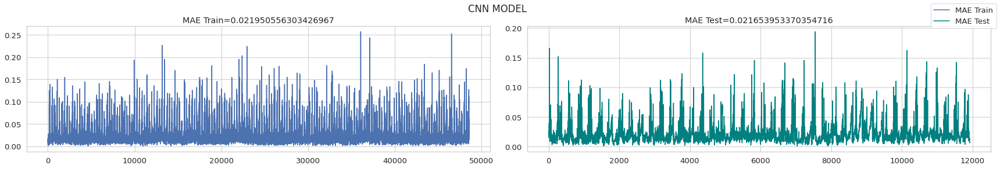

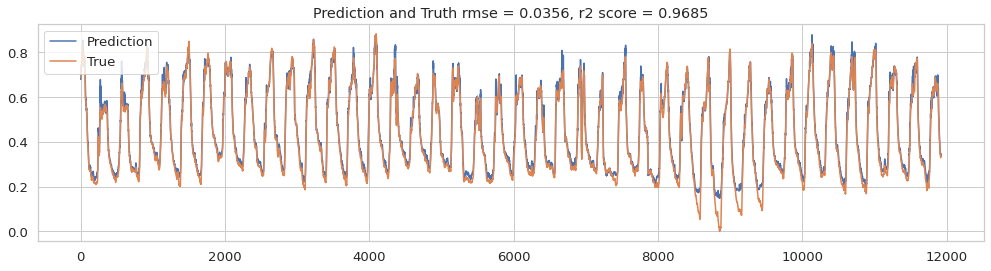

In [ ]:
n_timesteps_in = 290   # A day in samples
n_timesteps_out = 12   # An hour in samples
n_features = 3         # 3 Features
n_hidden = 128         # 128 units
epochs = 200
batch_size = 245       # DIvisor of the training set

model_cnn = Model_cnn(input_shape=(n_timesteps_in, n_features), filters=64,
                      kernel_size=3, dropout=0.2, LSTM=False)

optimizer = tf.keras.optimizers.Adam(lr=0.01)
model_cnn.compile(loss='mean_squared_error', optimizer=optimizer, metrics=['mae'])
early_stop = EarlyStopping(monitor='val_loss', patience=5)

history_cnn = train_model(model_cnn, train_X, train_y, callbacks=[early_stop], epochs=epochs, batch_size=batch_size, patience=5, verbose=0)
history_cnn_df = pd.DataFrame(history_cnn.history, columns=['mae', 'val_mae'])

MAE_train, MAE_test, mae_overall_train, mae_overall_test, mse_test, r2_test, rmse_test = \
get_errors(model_cnn, train_X, test_X, train_y, test_y)

plot_mae_overall(MAE_train, MAE_test, mae_overall_train, mae_overall_test, suptitle='CNN MODEL')

plot_lstm(model_cnn, test_X, test_y, feature_index=0)

print('Mean Absolute Error in Testing ',MAE_test)
print('Mean Squared Error in Testing ',mse_test)
print('R2 Score in Testing ',r2_test)
print('Root Mean Squared Error in Testing ',rmse_test)

serialize_model(model_cnn, history_cnn_df,name='cnn_model')

## DNN

### DNN MODEL BUILDING

In [ ]:
def Model_dnn(units, input_shape, dropout=0.2):   # Simple Deep Learning Model
  tf.keras.backend.clear_session()
  model = Sequential()
  #model.add(tf.keras.layers.Reshape(input_shape, input_shape=(input_shape,)))
  model.add(tf.keras.layers.Dense(units=128, activation='relu', input_shape=input_shape))
  model.add(tf.keras.layers.Dense(units=128, activation='relu'))
  model.add(tf.keras.layers.Dropout(dropout))
  model.add(tf.keras.layers.MaxPooling1D(pool_size=2))
  model.add(tf.keras.layers.Flatten())
  model.add(tf.keras.layers.Dense(units=input_shape[1]))
  return model

### DNN MODEL EVALUATION

Training model
Mean Absolute Error in Testing  0.0694508691107613
Mean Squared Error in Testing  0.008126376669105012
R2 Score in Testing  0.7272533964948259
Root Mean Squared Error in Testing  0.09014641794938395


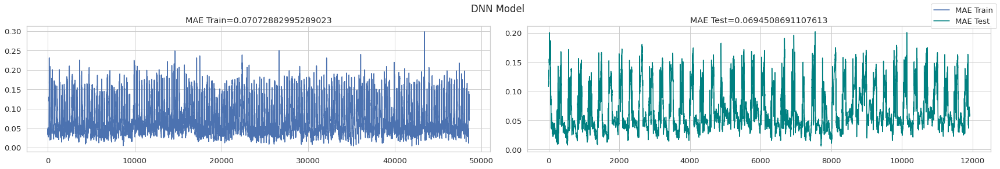

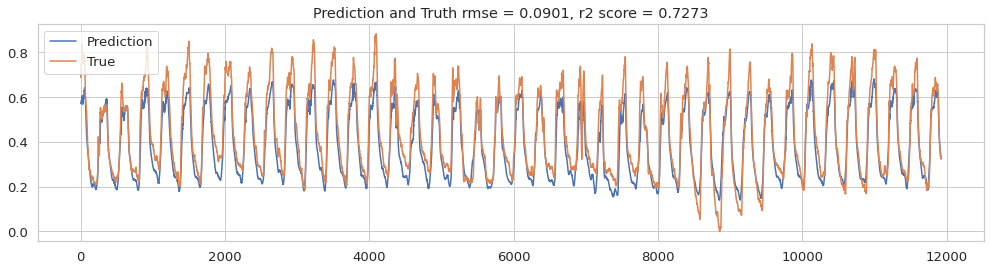

In [ ]:
train_X, train_y = split_sequences_multivariate(normalized_train[:train_len], n_steps=n_timesteps_in)
test_X, test_y = split_sequences_multivariate(normalized_train[train_len:], n_steps=n_timesteps_in)

model_dnn = Model_dnn(units=64, input_shape=(n_timesteps_in, n_features))

optimizer = tf.keras.optimizers.Adam(lr=0.01)
model_dnn.compile(loss='mean_squared_error', optimizer=optimizer, metrics=['mae'])

early_stop = EarlyStopping(monitor='val_loss', patience=5)

history_dnn = train_model(model_dnn, train_X, train_y, callbacks=[early_stop],
                           epochs=100, batch_size=256, patience=5, verbose=0)
history_dnn_df = pd.DataFrame(history_dnn.history, columns=['mae', 'val_mae'])

MAE_train, MAE_test, mae_overall_train, mae_overall_test, mse_test, r2_test, rmse_test = \
get_errors(model_dnn, train_X, test_X, train_y, test_y)

plot_mae_overall(MAE_train, MAE_test, mae_overall_train, mae_overall_test, suptitle='DNN Model')

plot_lstm(model_dnn, test_X, test_y, feature_index=0)

print('Mean Absolute Error in Testing ',MAE_test)
print('Mean Squared Error in Testing ',mse_test)
print('R2 Score in Testing ',r2_test)
print('Root Mean Squared Error in Testing ',rmse_test)

In [ ]:
serialize_model(model_dnn, history_dnn_df,name='dnn_model')

Saved model to disk


In [ ]:
####--------------------------------SEQ2SEQ--------------------------------------------------

## SEQ2SEQ

### SEQ2SEQ MODEL BUILD

In [ ]:
def Model_Seq(n_hidden, input_shape, output_shape, dropout):
  #tf.keras.backend.clear_session()
  input_train = Input(shape=input_shape)
  output_train = Input(shape=output_shape)

  encoder_last_h1, encoder_last_h2, encoder_last_c = \
  tf.keras.layers.LSTM(n_hidden, activation='relu', dropout=dropout,
                       return_sequences=False,
                       return_state=True)(input_train)

  #Batch normalisation is added because we want to avoid gradient
  #explosion caused by the activation function ELU in the encoder.
  encoder_last_h1 = BatchNormalization(momentum=0.9)(encoder_last_h1)
  encoder_last_c = BatchNormalization(momentum=0.9)(encoder_last_c)

  # Create copies of las hidden state
  decoder = RepeatVector(output_train.shape[1])(encoder_last_h1)

  # nitial_state: List of initial state tensors to be passed to the first call of the cell 
  #(optional, defaults to None which causes creation of zero-filled initial state tensors).
  # In this case initial state is the output from encoder
  decoder = tf.keras.layers.LSTM(n_hidden, activation='relu', dropout=dropout,
                                return_state=False,
                                return_sequences=True)(decoder, initial_state=[encoder_last_h1, encoder_last_c])

  out = TimeDistributed(Dense(output_train.shape[2]))(decoder)
  model = tf.keras.Model(inputs=input_train, outputs=out)
  return model

### SEQ2SEQ MODEL EVALUATION

Epoch 1/500
143/143 [==============================] - 58s 387ms/step - loss: 334.0604 - mae: 1.0513 - val_loss: 0.0121 - val_mae: 0.0802
Epoch 2/500
143/143 [==============================] - 55s 388ms/step - loss: 0.0076 - mae: 0.0571 - val_loss: 0.0145 - val_mae: 0.0912
Epoch 3/500
143/143 [==============================] - 54s 380ms/step - loss: 0.0065 - mae: 0.0514 - val_loss: 0.0165 - val_mae: 0.0991
Epoch 4/500
143/143 [==============================] - 54s 380ms/step - loss: 0.0057 - mae: 0.0478 - val_loss: 0.0125 - val_mae: 0.0825
Mean Absolute Error in Testing  0.08352875176718517
Mean Squared Error in Testing  0.012704375177778551
R2 Score in Testing  0.6958374075223999
Root Mean Squared Error in Testing  0.11271368673669827


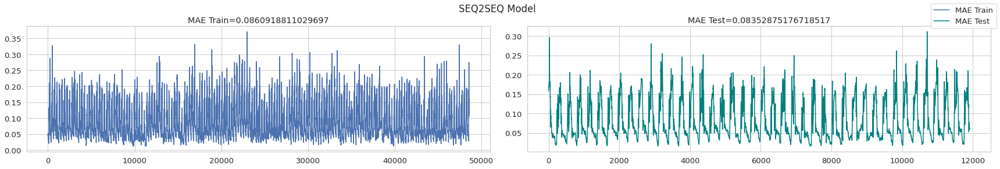

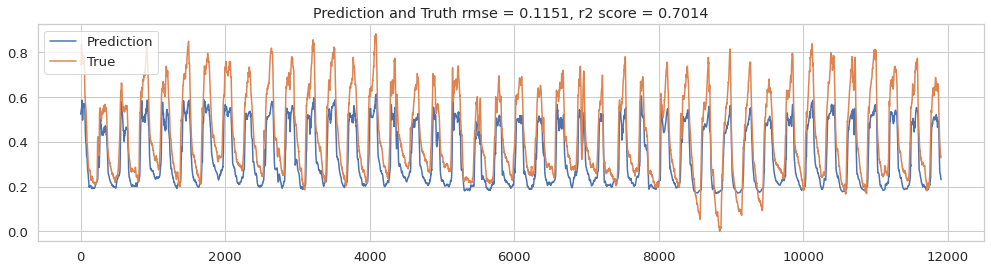

In [ ]:
tf.compat.v1.logging.set_verbosity(tf.compat.v1.logging.ERROR)

n_timesteps_in = 290   # A day in samples
n_timesteps_out = 12   # An hour in samples
n_features = 3
n_hidden = 128
epochs = 500
batch_size = 245

train_X, train_y = multi_step_output(normalized_train[:train_len], n_steps_in=n_timesteps_in, n_steps_out=n_timesteps_out)
test_X, test_y = multi_step_output(normalized_train[train_len:], n_steps_in=n_timesteps_in, n_steps_out=n_timesteps_out)

model_seq = Model_Seq(n_hidden=n_hidden, input_shape=(n_timesteps_in, n_features), output_shape=(n_timesteps_out, n_features), dropout=0.2)

optimizer = tf.keras.optimizers.Adam(lr=0.01)

# Added this part new-------------------
#lr_schedule = tf.keras.callbacks.LearningRateScheduler(lambda epoch: 1e-8 * 10**(epoch / 20))  
#optimizer = tf.keras.optimizers.Adam(lr=1e-8)
#----------------------------
model_seq.compile(loss='mean_squared_error', optimizer=optimizer, metrics=['mae'])

early_stop = EarlyStopping(monitor='val_loss', patience=3)

%timeit
history_seq = train_model(model_seq, train_X, train_y, callbacks=[early_stop], epochs=epochs, verbose=1)

history_seq_df = pd.DataFrame(history_seq.history, columns=['mae', 'val_mae'])

MAE_train, MAE_test, mae_overall_train, mae_overall_test, mse_test, r2_test, rmse_test = \
get_errors(model_seq, train_X, test_X, train_y, test_y)

plot_mae_overall(MAE_train, MAE_test, mae_overall_train, mae_overall_test, suptitle='SEQ2SEQ Model')

plot_single_seq(model_seq, test_X, test_y)

print('Mean Absolute Error in Testing ',MAE_test)
print('Mean Squared Error in Testing ',mse_test)
print('R2 Score in Testing ',r2_test)
print('Root Mean Squared Error in Testing ',rmse_test)

In [ ]:
#plt.semilogx(history_seq.history["lr"], history_seq.history["loss"])
#plt.axis([1e-8, 1e-4, 0, 1])

serialize_model(model_seq, history_seq_df,name='seq_model')

Saved model to disk


## ATTENTION

### BUILD ATTENTION MODEL

In [ ]:
def Model_Attention(n_hidden, input_shape, output_shape, dropout):

  input_train = Input(shape=input_shape)
  output_train = Input(shape=output_shape)

  encoder_stack_h, encoder_last_h, encoder_last_c = \
  tf.keras.layers.LSTM(n_hidden, activation='tanh', 
                      return_sequences=True,
                      return_state=True)(input_train)

  #encoder_last_h = BatchNormalization(momentum=0.6)(encoder_last_h)
  #encoder_last_c = BatchNormalization(momentum=0.6)(encoder_last_c)

  # Repeat the last hidden state of encoder 20 times, and use them as input to decoder LSTM.
  decoder_input = tf.keras.layers.RepeatVector(output_train.shape[1])(encoder_last_h)

  decoder_stack_h = tf.keras.layers.LSTM(n_hidden, activation='tanh', return_state=False,
                                        return_sequences=True)(decoder_input, initial_state=[encoder_last_h, encoder_last_c])

  # Alignment Score is Dot Product in Luong Attention
  attention = tf.keras.layers.dot([decoder_stack_h, encoder_stack_h], axes=[2, 2])
  attention = tf.keras.layers.Activation('softmax', name='Softmax')(attention)
  context = tf.keras.layers.dot([attention, encoder_stack_h], axes=[2,1])
  #context = BatchNormalization(momentum=0.6)(context)
  # Now we concat the context vector and stacked hidden states of decoder, 
  # and use it as input to the last dense layer.
  decoder_combined_context = tf.keras.layers.concatenate([context, decoder_stack_h])
  out = tf.keras.layers.TimeDistributed(tf.keras.layers.Dense(output_train.shape[2]))(decoder_combined_context)

  model = tf.keras.models.Model(inputs=input_train, outputs=out)
  
  return model

### ATTENTION MODEL EVALUATION

In [ ]:
n_timesteps_in = 290
n_timesteps_out = 12
n_features = 3
n_hidden = 128
epochs = 500
batch_size = 245

In [ ]:
#tf.keras.backend.clear_session()

train_X, train_y = multi_step_output(normalized_train[:train_len], n_steps_in=n_timesteps_in, n_steps_out=n_timesteps_out)
test_X, test_y = multi_step_output(normalized_train[train_len:], n_steps_in=n_timesteps_in, n_steps_out=n_timesteps_out)

model_att = Model_Attention(n_hidden=n_hidden, input_shape=(n_timesteps_in, n_features),
                            output_shape=(n_timesteps_out, n_features), dropout=0.2)

optimizer = tf.keras.optimizers.Adam(lr=0.001)
model_att.compile(loss='mean_squared_error', optimizer=optimizer, metrics=['mae'])
fig = tf.keras.utils.plot_model(model_att, to_file='model.png', show_shapes=True, show_layer_names=True, dpi=80)
#fig.savefig('Points_Transmitted.pdf', bbox_inches='tight')

model_att.summary()
dot_img_file = '/tmp/model_att.pdf'
tf.keras.utils.plot_model(model_att, to_file=dot_img_file, show_shapes=True, show_layer_names=False)

Model: "model_16"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_33 (InputLayer)           [(None, 290, 3)]     0                                            
__________________________________________________________________________________________________
lstm_34 (LSTM)                  [(None, 290, 128), ( 67584       input_33[0][0]                   
__________________________________________________________________________________________________
repeat_vector_16 (RepeatVector) (None, 12, 128)      0           lstm_34[0][1]                    
__________________________________________________________________________________________________
lstm_35 (LSTM)                  (None, 12, 128)      131584      repeat_vector_16[0][0]           
                                                                 lstm_34[0][1]             

Epoch 1/500
159/159 [==============================] - 9s 39ms/step - loss: 0.0236 - mae: 0.0962 - val_loss: 0.0052 - val_mae: 0.0399
Epoch 2/500
159/159 [==============================] - 5s 34ms/step - loss: 0.0044 - mae: 0.0385 - val_loss: 0.0042 - val_mae: 0.0359
Epoch 3/500
159/159 [==============================] - 5s 34ms/step - loss: 0.0037 - mae: 0.0349 - val_loss: 0.0038 - val_mae: 0.0321
Epoch 4/500
159/159 [==============================] - 5s 34ms/step - loss: 0.0032 - mae: 0.0315 - val_loss: 0.0038 - val_mae: 0.0313
Epoch 5/500
159/159 [==============================] - 5s 34ms/step - loss: 0.0031 - mae: 0.0307 - val_loss: 0.0034 - val_mae: 0.0302
Epoch 6/500
159/159 [==============================] - 5s 34ms/step - loss: 0.0029 - mae: 0.0297 - val_loss: 0.0034 - val_mae: 0.0289

Reached 0.03 mae so cancelling training!
Mean Absolute Error in Testing  0.025258261751945246
Mean Squared Error in Testing  0.002292262763696708
R2 Score in Testing  0.9683389929677255
Root Mean

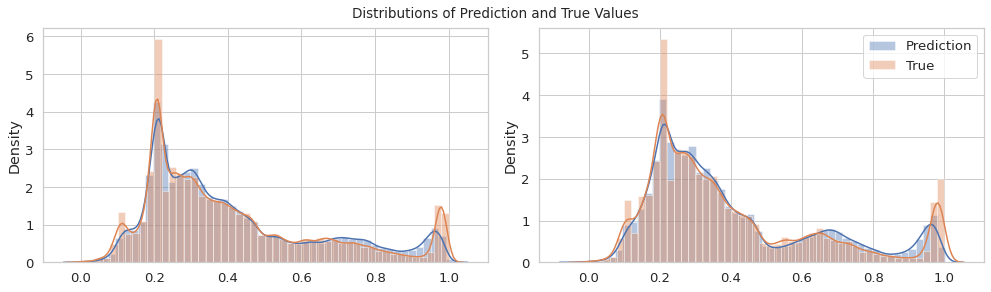

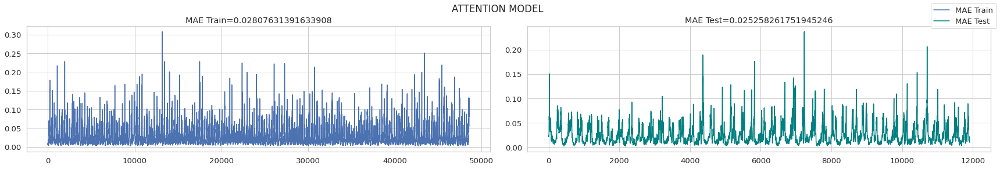

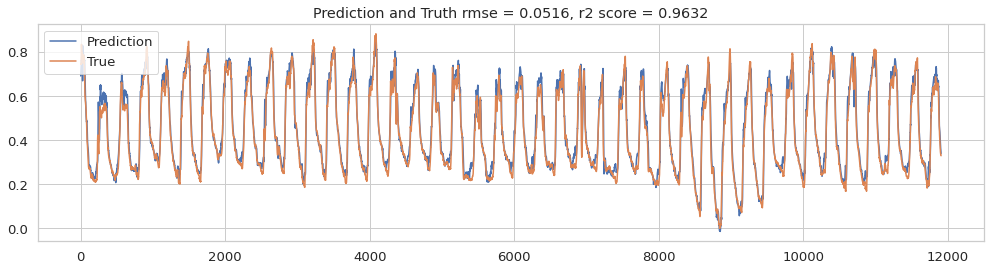

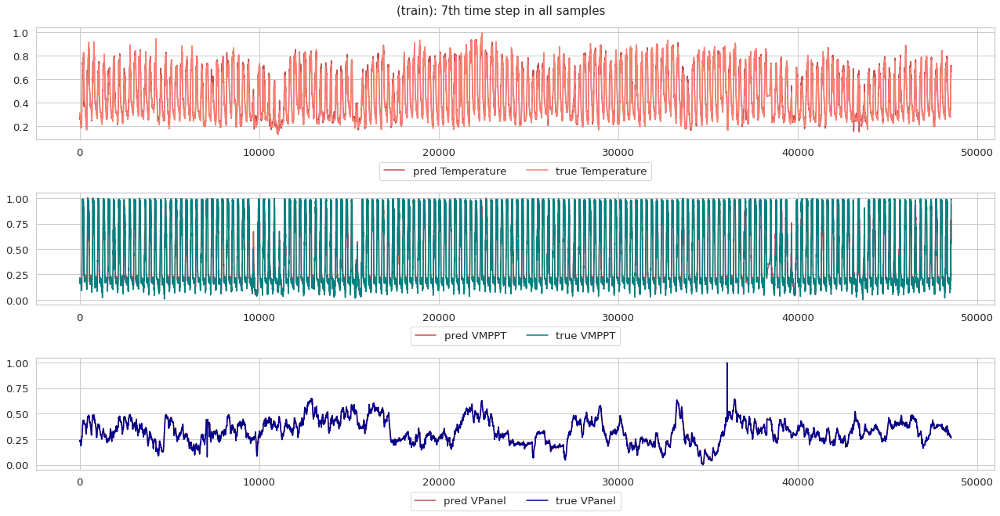

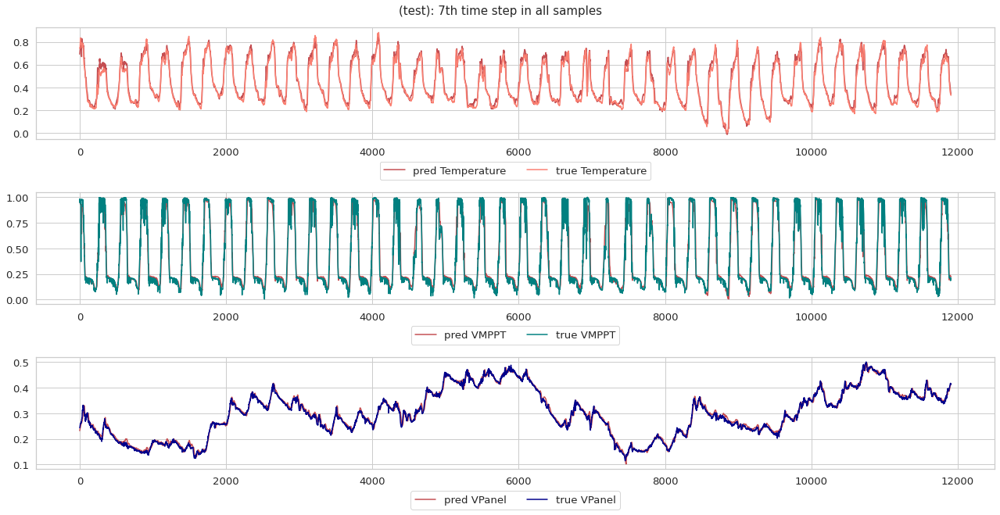

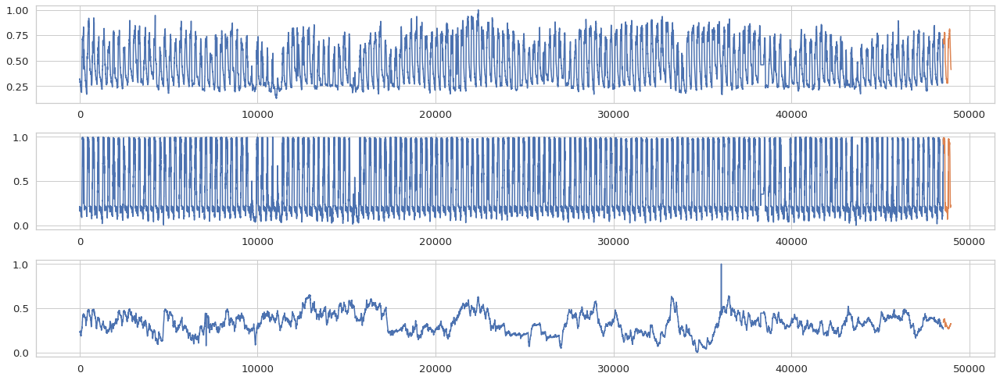

In [ ]:
callback = myCallback(mae=0.03)
#callback = tf.keras.callbacks.EarlyStopping(monitor='val_mae', patience=3)

history_att = train_model(model_att, train_X, train_y, epochs=epochs,
                      batch_size=batch_size, patience=5,
                      validation_split=0.20, verbose=1,
                      callbacks=callback)

history_df = pd.DataFrame(history_att.history, columns=['mae', 'val_mae'])

plot_distribution_error(model_att, train_X, test_X, train_y, test_y)

MAE_train, MAE_test, mae_overall_train, mae_overall_test, mse_test, r2_test, rmse_test = \
get_errors(model_att, train_X, test_X, train_y, test_y)

plot_mae_overall(MAE_train, MAE_test, mae_overall_train, mae_overall_test, suptitle='ATTENTION MODEL')
plot_single_seq(model_att, test_X, test_y)

plot_predictions(model_att, train_X, test_X, train_y, test_y)

forecast_att(model_att, train_X, train_y, forecast_range=12)

print('Mean Absolute Error in Testing ',MAE_test)
print('Mean Squared Error in Testing ',mse_test)
print('R2 Score in Testing ',r2_test)
print('Root Mean Squared Error in Testing ',rmse_test)

In [ ]:
serialize_model(model_att, history_df,name='Att_model_weekly')

from google.colab import files
files.download('Att_model.h5')
files.download('Att_model.json')
files.download('Att_model.csv')

Saved model to disk


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

## Plot To Save

In [ ]:
test_predictions = model_att.predict(test_X)

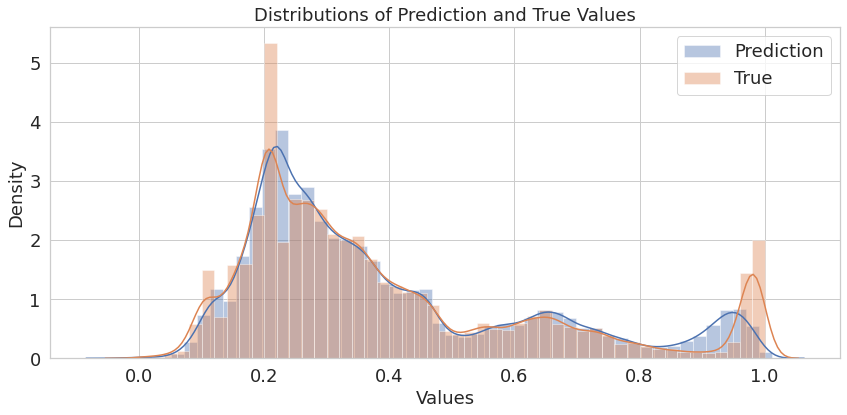

In [ ]:
plt.rc('xtick',labelsize=18)
plt.rc('ytick',labelsize=18)

fig, (ax1) = plt.subplots(1, 1, figsize=(12,6))
sns.distplot(a=test_predictions.flatten(), ax=ax1, label='Prediction')
sns.distplot(a=test_y.flatten(), ax=ax1, label='True')
plt.title('Distributions of Prediction and True Values', fontsize=18)
plt.xlabel('Values', fontsize=18)
plt.ylabel('Density',fontsize=18)
plt.legend(fontsize=18)
plt.tight_layout()

fig.savefig('DistributionsPredAndTrue.pdf', bbox_inches='tight', dpi=300)

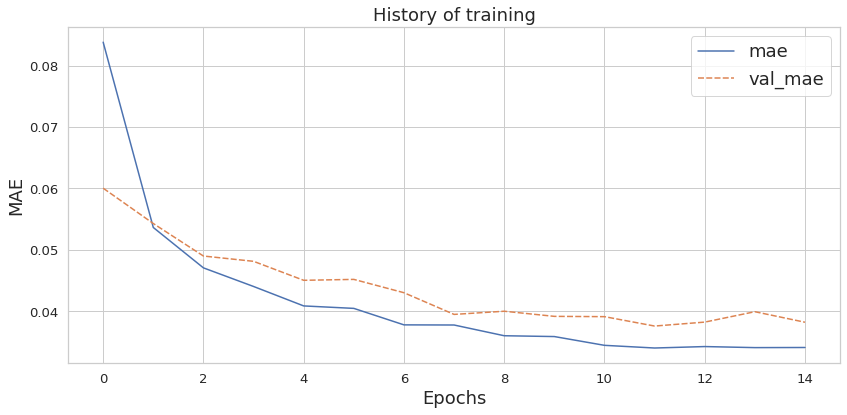

In [ ]:
fig, (ax1) = plt.subplots(1, 1, figsize=(12,6))
sns.lineplot(data = history_df, ax=ax1)
plt.title('History of training', fontsize=18)
plt.xlabel('Epochs', fontsize=18)
plt.ylabel('MAE',fontsize=18)
plt.legend(fontsize=18)
plt.tight_layout()

fig.savefig('Historyoftraining.pdf', bbox_inches='tight', dpi=300)

In [ ]:
#train_predictions = model_att.predict(train_X)
test_predictions = model_att.predict(test_X)
data_final = dict(test_pred=test_predictions[5000:], test_true=test_y[5000:])

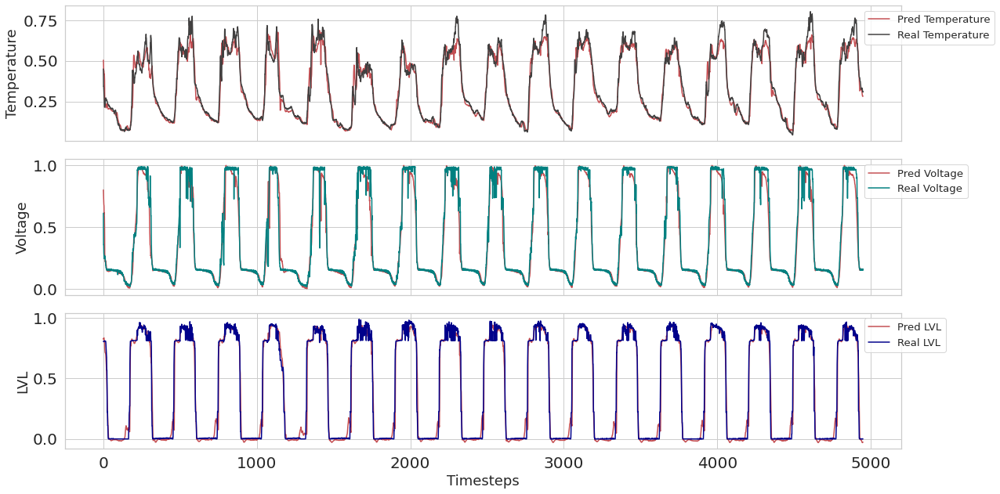

In [ ]:
# Number of time steps in the future, as increases the accuracy decreases
ith_timestep = 7

fig, axx = plt.subplots(3,1,figsize=(18,9), sharex=True)
for i, x_lbl, clr,axi in zip([0, 1, 2], ['Temperature', 'Voltage','LVL'], [colors['GRAY2'], 'teal','darkblue'], axx):
    axi.plot(data_final['test'+'_pred'][:, ith_timestep, i], linestyle='-', color='r', label='Pred '+x_lbl)
    axi.plot(data_final['test'+'_true'][:, ith_timestep, i], linestyle='-', color=clr, label='Real '+x_lbl)
    axi.legend(bbox_to_anchor=(0.95, 1), loc='upper left')
    axi.set_ylabel(x_lbl, fontsize=18)
plt.xlabel('Timesteps', fontsize=18)
plt.tight_layout()

fig.savefig('PredAndTruth.pdf', bbox_inches='tight', dpi=300)

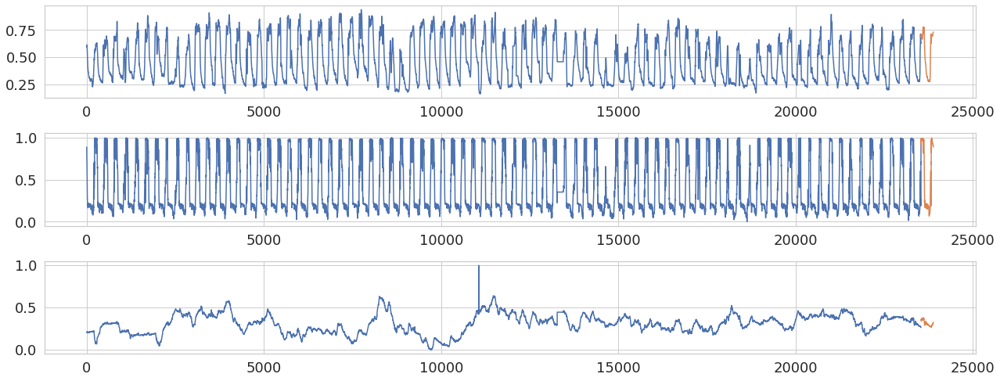

In [ ]:
n_timesteps_in = train_X.shape[1]
n_timesteps_out = train_y.shape[1]
n_features = train_X.shape[2]

# first set of samples

batch = train_X[-1, :, :]
predictions_forecast = batch
# future timesteps to forcast times X horizon timesteps
for i in range(5):
  one_step_pred = model_att.predict(batch.reshape(1, n_timesteps_in, n_features))
  batch = np.concatenate([batch[n_timesteps_out:], one_step_pred.reshape(n_timesteps_out, n_features)], axis=0)
  predictions_forecast = np.row_stack([predictions_forecast, one_step_pred.reshape(n_timesteps_out, n_features)])

fig, axx = plt.subplots(3, 1, figsize=(18,7))

forecast = np.concatenate([train_y[:, n_timesteps_out-1, :], predictions_forecast], axis=0)
forecast[:train_y.shape[0]] = None
axx[0].plot(train_y[:, 0, 0][25000:])
axx[0].plot(forecast[:,0][25000:])
axx[1].plot(train_y[:, 0, 1][25000:])
axx[1].plot(forecast[:,1][25000:])
axx[2].plot(train_y[:, 0, 2][25000:])
axx[2].plot(forecast[:,2][25000:])
plt.tight_layout()

# Compare

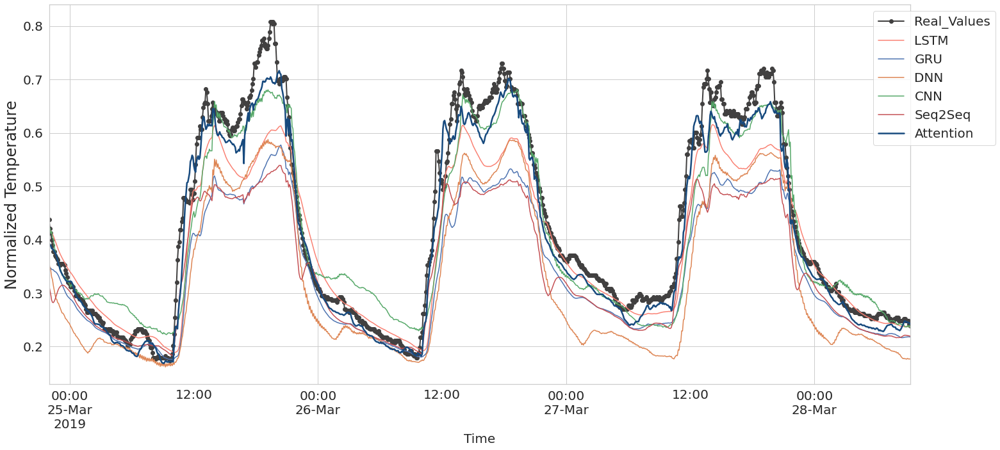

In [ ]:
#@title Compare Models{ display-mode: "form" }
feature_index =  0#@param {type:"number"} 
init = 1000 #@param {type:"number"} 
#@markdown Make sure the init and the end make sense.
end = 2000 #@param {type:"number"} 

#n_timesteps_in = 290
#n_timesteps_out = 12
#n_features = 3
#n_hidden = 128
#epochs = 500
#batch_size = 245

# Baseline models
train_X, train_y = split_sequences_multivariate(normalized_train[:train_len], n_steps=n_timesteps_in)
test_X, test_y = split_sequences_multivariate(normalized_train[train_len:], n_steps=n_timesteps_in)

prediction_lstm = model_lstm.predict(test_X)
prediction_gru = model_gru.predict(test_X)
prediction_cnn = model_cnn.predict(test_X)
prediction_dnn = model_dnn.predict(test_X)

data = np.column_stack([prediction_lstm[:,feature_index],
                       prediction_gru[:,feature_index],
                       prediction_cnn[:,feature_index],
                       prediction_dnn[:,feature_index]])
## Sequences models
train_X, train_y = multi_step_output(normalized_train[:train_len], n_steps_in=n_timesteps_in, n_steps_out=n_timesteps_out)
test_X, test_y = multi_step_output(normalized_train[train_len:], n_steps_in=n_timesteps_in, n_steps_out=n_timesteps_out)

prediction_seq = model_seq.predict(test_X)[:,7,:]
prediction_att = model_att.predict(test_X)[:,7,:]

data = data[:prediction_att.reshape(-1,3).shape[0]]
data_seq = np.column_stack([data, prediction_seq.reshape(-1,3)[:,feature_index],
                           prediction_att.reshape(-1,3)[:,feature_index],
                            test_y[:,7,:].reshape(-1,3)[:,feature_index]])

predictions_df = pd.DataFrame(data=data_seq, columns=['LSTM','GRU', 'CNN', 'DNN', 'Seq2Seq','Attention','Real_Values'])
predictions_df = predictions_df.set_index(train_data[train_len:].index[-predictions_df.shape[0]:])


fig, ax1 = plt.subplots(1, 1, figsize=(22, 10))
plt.rc('xtick',labelsize=20)
plt.rc('ytick',labelsize=20)

predictions_df[init:end]['Real_Values'].plot(ax=ax1, linewidth=2.0, color=colors['GRAY2'], marker='o')
predictions_df[init:end]['LSTM'].plot(ax=ax1, color='salmon')
predictions_df[init:end]['GRU'].plot(ax=ax1)
predictions_df[init:end]['DNN'].plot(ax=ax1)
predictions_df[init:end]['CNN'].plot(ax=ax1)
predictions_df[init:end]['Seq2Seq'].plot(ax=ax1)
predictions_df[init:end]['Attention'].plot(ax=ax1, linewidth=2.5, color=colors['BLUE1'])
#plt.title(label='Prediction Results of Trained Models', fontsize=22)
plt.xlabel('Time', fontsize=20)
plt.ylabel('Normalized Temperature', fontsize=24)
plt.legend(fontsize=20, bbox_to_anchor=(0.95, 1), loc='upper left')
plt.tight_layout()

In [ ]:
fig.savefig('Comparison.pdf', bbox_inches='tight', dpi=300)

## PLOT FORECAST

In [ ]:
expanded_end_date = '2019-04-30'

expanded_train=resampled[init_date : expanded_end_date]
expanded_train=scaler.transform(expanded_train)

# first set of samples
forecast_range=10
palette = sns.color_palette('deep')

batch = train_X[-1, :, :]
predictions_forecast = train_X[-1, :, :]
# future timesteps to forcast times X horizon timesteps
for i in range(forecast_range):
  one_step_pred = model_att.predict(batch.reshape(1, n_timesteps_in, n_features))
  batch = np.row_stack([batch[n_timesteps_out:], one_step_pred.reshape(n_timesteps_out, n_features)])
  predictions_forecast = np.row_stack([predictions_forecast, one_step_pred.reshape(n_timesteps_out, n_features)])

In [ ]:

fig, axx = plt.subplots(3, 1, figsize=(19,11), sharex=True)

fig.suptitle('Forecast of Normalized Data',y=1.02, fontsize=20)
forecast = np.concatenate([normalized_train[:train_len], predictions_forecast], axis=0)
forecast[:train_y.shape[0]] = None
axx[0].plot(train_y[:, 0, 0][60000:], color=palette[0], label='Temperature')
axx[0].plot(forecast[:,0][60000:110000], color=palette[1], label='Forecast')
axx[0].set_ylabel('Temperature', fontsize=18); axx[0].legend(loc='upper left', fontsize=20)

axx[1].plot(train_y[:, 0, 1][60000:], color=palette[2], label='V_MPPT')
axx[1].plot(forecast[:,1][60000:110000], color=palette[1], label='Forecast')
axx[1].set_ylabel('Voltage_MPPT', fontsize=18); axx[1].legend(loc='upper left', fontsize=20)

axx[2].plot(train_y[:, 0, 2][60000:], color=palette[4], label='V_Panel')
axx[2].plot(forecast[:,2][60000:180000], color=palette[1], label='Forecast')
axx[2].set_ylabel('V_Panel', fontsize=18); axx[2].legend(loc='upper left', fontsize=20)
axx[2].set_xlabel('Timesteps', fontsize=18)
plt.tight_layout()
axx[0].legend(bbox_to_anchor=(0.95, 1), loc='upper left')
axx[1].legend(bbox_to_anchor=(0.95, 1), loc='upper left')
axx[2].legend(bbox_to_anchor=(0.95, 1), loc='upper left')
fig.savefig('Forecast.pdf', bbox_inches='tight')

# Transmission

## TRANSMITTING DATA

Since the error distribution in training does not follows a Gaussian Distribution, the Interquartile Range (IQR) was calculated to identify outliers by defining a threshold of two times the 75th percentile.

In [ ]:
# get the errors
k = 2
_, _, mae_overall_train, _, _, _, _ = get_errors(model_att, train_X, test_X, train_y, test_y)
_, _, _, mae_overall_test, _, _, _ = get_errors(model_att, train_X, test_X, train_y, test_y)
quartiles = np.percentile(mae_overall_train, [25, 50, 75])
data_min, data_max = mae_overall_train.min(), mae_overall_train.max()
print('Q3: %.3f' % quartiles[2])

threshold = quartiles[2]*k
print('threshold ',threshold)

Q3: 0.077
threshold  0.15354594125713333


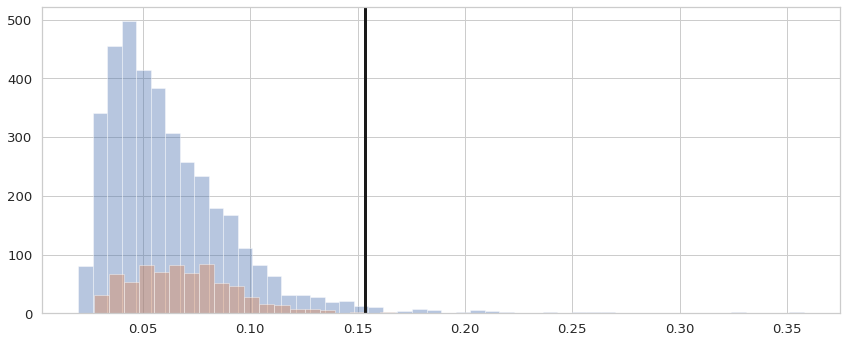

In [ ]:
fig, ax1 = plt.subplots(1, 1, figsize=(12,5))
sns.distplot(mae_overall_train, ax=ax1, kde=False)
sns.distplot(mae_overall_test, ax=ax1, kde=False)
ax1.axvline(threshold, color='k', linewidth=3)
plt.tight_layout()

ATT Chosen
Number of Points to transmit  612
Percent of Points transmitted  51.0


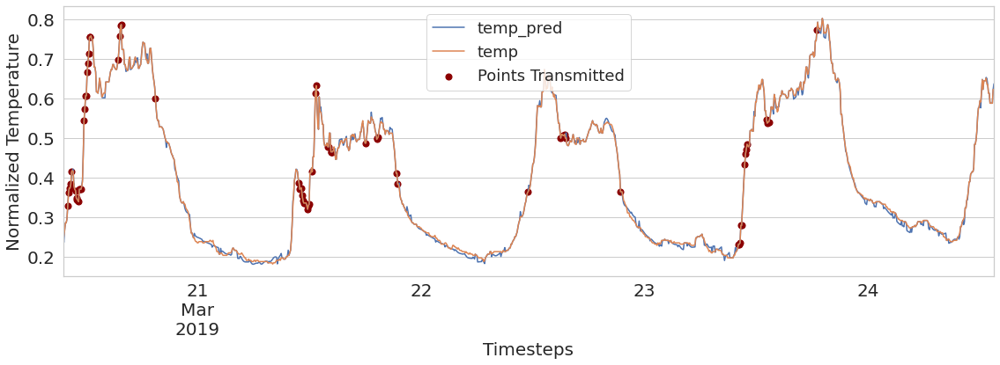

In [ ]:
#@title Choose Between LSTM and ATT{ display-mode: "form" }
model = 'ATT' #@param ["LSTM", "ATT"]
threshold = 0.015 #@param {type:"slider", min:0.005, max:0.2, step:0.005}
pred_range = 100 #@param {type:"slider", min:10, max:200, step:10}

if model=='LSTM':
  print('LSTM Chosen')
  train_X, train_y = split_sequences_multivariate(normalized_train[:train_len], n_steps=n_timesteps_in)
  test_X, test_y = split_sequences_multivariate(normalized_train[train_len:], n_steps=n_timesteps_in)
  error_stack, forecast_result, counter = forecast_for_tx(model_lstm, train_X, normalized_train, n_timesteps_out=1, threshold=0.01, pred_range=pred_range)
else:
  print('ATT Chosen')
  train_X, train_y = multi_step_output(normalized_train[:train_len], n_steps_in=n_timesteps_in, n_steps_out=n_timesteps_out)
  test_X, test_y = multi_step_output(normalized_train[train_len:], n_steps_in=n_timesteps_in, n_steps_out=n_timesteps_out)
  error_stack, forecast_result, counter = forecast_for_tx(model_att, train_X, normalized_train, n_timesteps_out, threshold=threshold, pred_range=pred_range)

print('Number of Points to transmit ',counter)
# create dataframe with truth and error
forecast_result_df = pd.DataFrame(data=forecast_result, columns=['temp_pred','vmppt_pred','vpanel_pred','temp','vmppt','vpanel'])
# Set date index for dataframe taking
forecast_result_df = forecast_result_df.set_index(train_data[train_len:][:forecast_result_df.shape[0]].index)
# error stack only contains temperature error
err = np.array(error_stack).reshape(-1,1)

# add the error to the dataframe to plot the points
forecast_result_df['error'] = err
# compare with a threshold
forecast_result_df['Transmitted'] = (forecast_result_df['error'] > 0.08)
# create dataframe that contains points to be transmitted
points_tx = pd.DataFrame(data = forecast_result_df[forecast_result_df['Transmitted']==True]['temp'], index=forecast_result_df[forecast_result_df['Transmitted']==True].index)
# Plot
fig, ax1 = plt.subplots(1, 1, figsize=(16,6))
forecast_result_df[['temp_pred','temp']].plot(ax=ax1)
ax1.scatter(x=points_tx.index, y=points_tx['temp'],
                    color='darkred', label='Points Transmitted', s=50)
plt.xlabel('Timesteps', fontsize=20, y=1.03)
plt.ylabel('Normalized Temperature', fontsize=20)
plt.legend(fontsize=18)
plt.tight_layout()
plt.tight_layout()

print('Percent of Points transmitted ',(counter*100)/forecast_result.shape[0])
fig.savefig('Points_Transmitted.pdf', bbox_inches='tight', dpi=300)

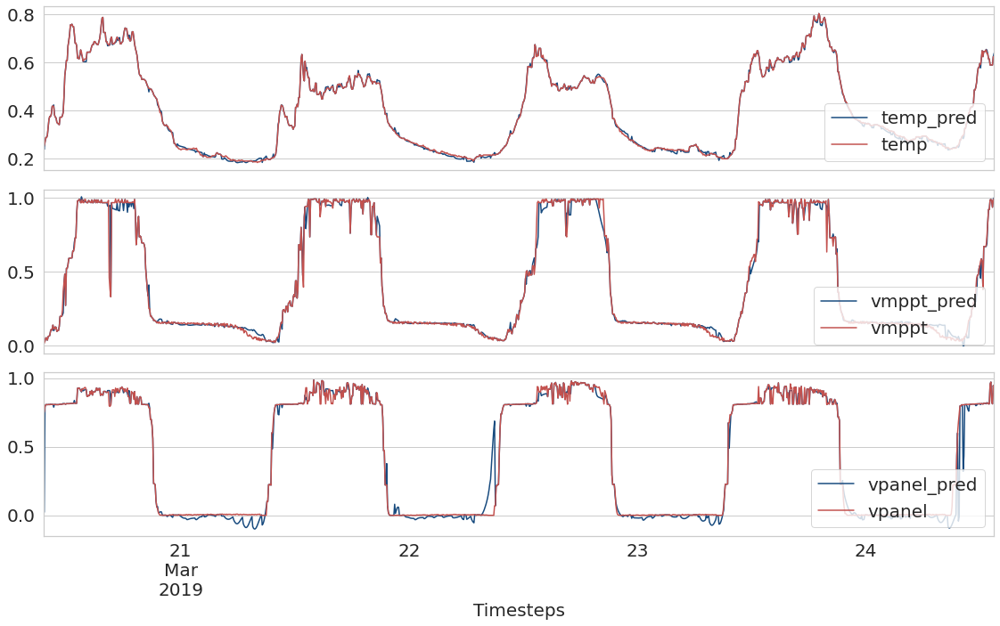

In [ ]:
fig, axx = plt.subplots(3, 1, figsize=(16, 10), sharex=True)

plt.rc('xtick',labelsize=20)
plt.rc('ytick',labelsize=20)

forecast_result_df[['temp_pred','temp']].plot(ax=axx[0], color=[colors['BLUE1'], colors['RED1']])
forecast_result_df[['vmppt_pred','vmppt']].plot(ax=axx[1], color=[colors['BLUE1'], colors['RED1']])
forecast_result_df[['vpanel_pred','vpanel']].plot(ax=axx[2], color=[colors['BLUE1'], colors['RED1']])
axx[0].legend(fontsize=20, loc='lower right')
axx[1].legend(fontsize=20, loc='lower right')
axx[2].legend(fontsize=20, loc='lower right')
plt.xlabel('Timesteps',fontsize=20)
plt.tight_layout()

fig.savefig('Transmission.pdf', bbox_inches='tight', dpi=300)

## Checking multiple thresholds

Unnormalized

In [ ]:
count_list = []
percent_list=[]
error_list = []
std_list = []
rolling_mae = []
for ii in np.linspace(0.010, 0.12, 25):
  error_stack, forecast_result, counter = forecast_for_tx(model_att, train_X, normalized_train, n_timesteps_out, threshold=ii)
  count_list.append(counter)
  percent_list.append((counter*100)/forecast_result.shape[0])
  error_list.append(abs(forecast_result[:,0] - forecast_result[:,3]).mean() * 43.5)
  std_list.append(abs(forecast_result[:,0] - forecast_result[:,3]).std())
  rolling_mae.append(abs(forecast_result[:,0] - forecast_result[:,3]).reshape(-1,1).mean(axis=1))

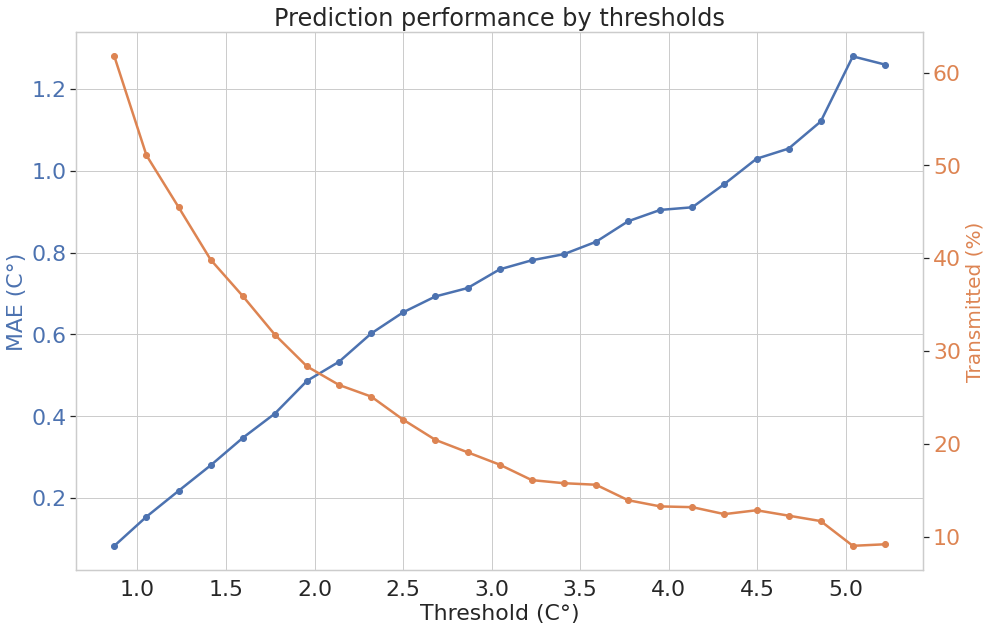

In [ ]:
bars = False
fig, ax1 = plt.subplots(1,1, figsize=(14,9))
if bars==True:
  ax1.errorbar(np.linspace(0.020, 0.15, 25)*43.5, np.array(error_list),yerr=np.array(std_list)*43.5, linewidth=2.5, fmt='-o',)
else:
  ax1.plot(np.linspace(0.020, 0.12, 25)*43.5, np.array(error_list), linewidth=2.5, marker='o')
  ax1.set_title('Prediction performance by thresholds', fontsize=24)
  ax1.set_ylabel('MAE (C\N{DEGREE SIGN})', fontsize=22, color=sns.color_palette('deep')[0])
  ax1.set_xlabel('Threshold (C\N{DEGREE SIGN})', fontsize=22)
  ax1.xaxis.set_tick_params(labelsize=22)
  ax1.yaxis.set_tick_params(labelsize=22, labelcolor=sns.color_palette('deep')[0])
  ax1.set_xticks(np.arange(0.5, 7, 0.5))

  ax2 = ax1.twinx()  # instantiate a second axes that shares the same x-axis

  ax2.plot(np.linspace(0.020, 0.12, 25)*43.5, percent_list, color=sns.color_palette('deep')[1], linewidth=2.5, marker='o')
  ax2.set_xlabel('Threshold \n b)', fontsize=20)
  ax2.set_ylabel('Transmitted (%)', fontsize=20, color=sns.color_palette('deep')[1])
  ax2.grid(b=False)
  ax2.xaxis.set_tick_params(labelsize=22)
  ax2.yaxis.set_tick_params(labelsize=22, labelcolor=sns.color_palette('deep')[1])
  plt.tight_layout()

  fig.savefig('Thresholds_sweep.pdf', bbox_inches='tight')

In [ ]:
# Comparing two forecast
# Threshols = 0.03, 0.07
error_stack, forecast_result, counter = forecast_for_tx(model_att, train_X, normalized_train, n_timesteps_out, threshold=0.02)
forecast_result_df = pd.DataFrame(data=forecast_result, columns=['temp_pred','vmppt_pred','vpanel_pred','temp','vmppt','vpanel'])
forecast_result_df = forecast_result_df.set_index(train_data[train_len:][:forecast_result_df.shape[0]].index)
# Threshols = 0.08
error_stack_2, forecast_result_2, counter_2 = forecast_for_tx(model_att, train_X, normalized_train, n_timesteps_out, threshold=0.05)
forecast_result_df_2 = pd.DataFrame(data=forecast_result_2, columns=['temp_pred','vmppt_pred','vpanel_pred','temp','vmppt','vpanel'])
forecast_result_df_2 = forecast_result_df_2.set_index(train_data[train_len:][:forecast_result_df_2.shape[0]].index)
print(counter)
print(counter_2)

669
443


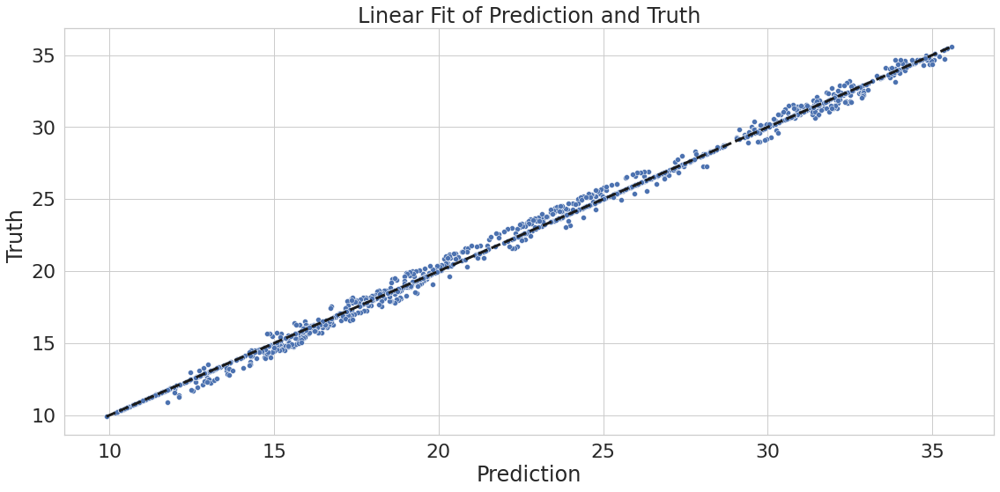

In [ ]:
# Need to convert the list to numpy array and reshape to column form
x = np.array(forecast_result[:,0]).reshape(-1,1)
y = np.array(forecast_result[:,3]).reshape(-1,1)

# Scatter between prediction and real data to check accuracy
fig, ax1 = plt.subplots(1,1,figsize=(16,8))
sns.scatterplot(x=forecast_result[:,0]*43.5, y=forecast_result[:,3]*43.5, ax=ax1)
ax1.plot([y.min()*43.5, y.max()*43.5], [y.min()*43.5, y.max()*43.5], 'k--', lw=3)
ax1.set_title(label='Linear Fit of Prediction and Truth', fontsize=24)
ax1.set_xlabel('Prediction', fontsize=24)
ax1.set_ylabel('Truth ', fontsize=24)
ax1.xaxis.set_tick_params(labelsize=22)
ax1.yaxis.set_tick_params(labelsize=22)
plt.tight_layout()

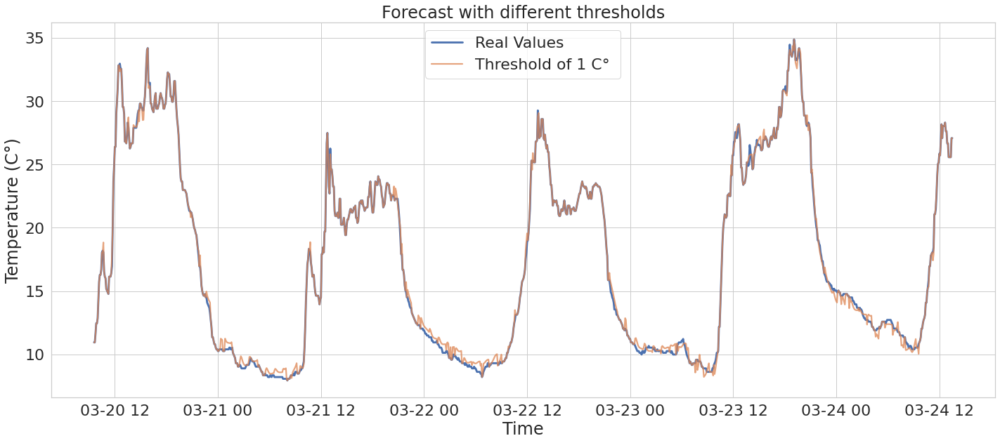

In [ ]:
fig, axx = plt.subplots(1, 1, figsize=(20, 9))
# Multiplying by Max value of temperature
axx.plot(forecast_result_df['temp']*43.5, label = 'Real Values', linewidth=2.85)
axx.plot(forecast_result_df[['temp_pred']]*43.5, label='Threshold of 1 C\N{DEGREE SIGN} ', linewidth=2.2, alpha=0.75)
#axx.plot(forecast_result_df_2[['temp_pred']]*43.5, label = 'Threshold of 3 C\N{DEGREE SIGN}', linewidth=2.2,alpha=0.7)
plt.title(label='Forecast with different thresholds', fontsize=24)
plt.xlabel('Time', fontsize=24)
plt.ylabel('Temperature (C\N{DEGREE SIGN})', fontsize=24)
axx.xaxis.set_tick_params(labelsize=22)
axx.yaxis.set_tick_params(labelsize=22)
plt.legend(fontsize=22, loc='upper center')
plt.tight_layout()
fig.savefig('Compare_thresholds.pdf', bbox_inches='tight')

In [ ]:
fig, axx = plt.subplots(1, 1, figsize=(20, 9))
# Multiplying by Max value of temperature
axx.plot(forecast_result_df['vpanel']*43.5, label = 'Real Values', linewidth=2.85)
axx.plot(forecast_result_df[['vpanel_pred']]*43.5, label='Threshold of 1 C\N{DEGREE SIGN} ', linewidth=2.2, alpha=0.75)
#axx.plot(forecast_result_df_2[['vpanel_pred']]*43.5, label = 'Threshold of 3 C\N{DEGREE SIGN}', linewidth=2.2,alpha=0.7)
plt.title(label='Forecast with different thresholds', fontsize=24)
plt.xlabel('Time', fontsize=24)
plt.ylabel('Temperature (C\N{DEGREE SIGN})', fontsize=24)
axx.xaxis.set_tick_params(labelsize=22)
axx.yaxis.set_tick_params(labelsize=22)
plt.legend(fontsize=22, loc='upper center')
plt.tight_layout()
fig.savefig('Compare_thresholds.pdf', bbox_inches='tight')

# Run Many training examples and save Errors

### LSTM LOOP

In [ ]:
def train_lstm_loop(times = 10, n_timesteps_in = 290, n_timesteps_out = 12, n_features = 3, n_hidden = 128, epochs = 500, batch_size = 245):

  MAE_test_list = []; mse_test_list=[]; r2_test_list=[]; rmse_test_list=[]

  for ii in range(times):
    train_X, train_y = split_sequences_multivariate(normalized_train[:train_len], n_steps=n_timesteps_in)
    test_X, test_y = split_sequences_multivariate(normalized_train[train_len:], n_steps=n_timesteps_in)

    ###-------------LSTM MODEL--------------------------#####
    model_lstm = build_lstm(n_hidden, n_timesteps_in, n_features, dropout=0.2)
    ###-----------------------------------------------------

    optimizer = tf.keras.optimizers.Adam(lr=0.01)
    model_lstm.compile(loss='mean_squared_error', optimizer=optimizer, metrics=['mae'])

    early_stop = EarlyStopping(monitor='val_loss', patience=5)

    history_lstm = train_model(model_lstm, train_X, train_y, callbacks=[early_stop], epochs=epochs, batch_size=batch_size, patience=5, verbose=0)
    history_lstm_df = pd.DataFrame(history_lstm.history, columns=['mae', 'val_mae'])

    MAE_train, MAE_test, mae_overall_train, mae_overall_test, mse_test, r2_test, rmse_test = \
    get_errors(model_lstm, train_X, test_X, train_y, test_y)

    MAE_test_list.append(MAE_test)
    mse_test_list.append(mse_test) 
    r2_test_list.append(r2_test)
    rmse_test_list.append(rmse_test)

  return  MAE_test_list, mse_test_list, r2_test_list, rmse_test_list
  
#errors = pd.DataFrame([], columns=['MAE_test', 'mse_test', 'r2_test', 'rmse_test'])

In [ ]:
MAE_test_list, mse_test_list, r2_test_list, rmse_test_list = train_lstm_loop()

In [ ]:
errors_lstm = pd.DataFrame(np.column_stack([MAE_test_list, mse_test_list, r2_test_list, rmse_test_list]),
                           columns=['MAE_LSTM', 'mse_LSTM', 'r2_LSTM', 'rmse_LSTM'])
fig, ax1 = plt.subplots(figsize=(16,5))
sns.boxplot(data=errors_lstm.drop('r2_LSTM',axis=1), palette='Set3', ax=ax1)
plt.tight_layout()

### GRU LOOP

In [ ]:
def train_gru_loop(times = 10, n_timesteps_in = 290, n_timesteps_out = 12, n_features = 3, n_hidden = 128, epochs = 500, batch_size = 245):

  MAE_test_list = []; mse_test_list=[]; r2_test_list=[]; rmse_test_list=[]

  for ii in range(times):
    train_X, train_y = split_sequences_multivariate(normalized_train[:train_len], n_steps=n_timesteps_in)
    test_X, test_y = split_sequences_multivariate(normalized_train[train_len:], n_steps=n_timesteps_in)

    model_gru = build_GRU(n_hidden, n_timesteps_in, n_features, dropout=0.2)

    optimizer = tf.keras.optimizers.Adam(lr=0.001)
    model_gru.compile(loss='mean_squared_error', optimizer=optimizer, metrics=['mae'])

    history_gru = train_model(model_gru, train_X, train_y, callbacks=[early_stop], epochs=epochs, batch_size=batch_size, patience=5, verbose=0)
    history_gru_df = pd.DataFrame(history_gru.history, columns=['mae', 'val_mae'])

    MAE_train, MAE_test, mae_overall_train, mae_overall_test, mse_test, r2_test, rmse_test = \
    get_errors(model_gru, train_X, test_X, train_y, test_y)

    MAE_test_list.append(MAE_test)
    mse_test_list.append(mse_test) 
    r2_test_list.append(r2_test)
    rmse_test_list.append(rmse_test)

  return  MAE_test_list, mse_test_list, r2_test_list, rmse_test_list

MAE_test_list, mse_test_list, r2_test_list, rmse_test_list = train_gru_loop()

errors_gru = pd.DataFrame(np.column_stack([MAE_test_list, mse_test_list, r2_test_list, rmse_test_list]),
                           columns=['MAE_GRU', 'mse_GRU', 'r2_GRU', 'rmse_GRU'])
errors_gru.to_csv('error_gru.csv')

Training model
Training model
Training model
Training model
Training model
Training model
Training model
Training model
Training model
Training model


### CNN LOOP

In [ ]:
def train_cnn_loop(times = 10, n_timesteps_in = 290, n_timesteps_out = 12, n_features = 3, n_hidden = 128, epochs = 500, batch_size = 245):

  MAE_test_list = []; mse_test_list=[]; r2_test_list=[]; rmse_test_list=[]

  for ii in range(times):
    train_X, train_y = split_sequences_multivariate(normalized_train[:train_len], n_steps=n_timesteps_in)
    test_X, test_y = split_sequences_multivariate(normalized_train[train_len:], n_steps=n_timesteps_in)

    model_cnn = Model_cnn(input_shape=(n_timesteps_in, n_features), filters=64,
                      kernel_size=3, dropout=0.2, LSTM=False)

    optimizer = tf.keras.optimizers.Adam(lr=0.01)
    model_cnn.compile(loss='mean_squared_error', optimizer=optimizer, metrics=['mae'])
    early_stop = EarlyStopping(monitor='val_loss', patience=5)

    history_cnn = train_model(model_cnn, train_X, train_y, callbacks=[early_stop], epochs=epochs, batch_size=batch_size, patience=5, verbose=0)
    history_cnn_df = pd.DataFrame(history_cnn.history, columns=['mae', 'val_mae'])

    MAE_train, MAE_test, mae_overall_train, mae_overall_test, mse_test, r2_test, rmse_test = \
    get_errors(model_cnn, train_X, test_X, train_y, test_y)

    MAE_test_list.append(MAE_test)
    mse_test_list.append(mse_test) 
    r2_test_list.append(r2_test)
    rmse_test_list.append(rmse_test)

  return  MAE_test_list, mse_test_list, r2_test_list, rmse_test_list

MAE_test_list, mse_test_list, r2_test_list, rmse_test_list = train_cnn_loop()

errors_cnn = pd.DataFrame(np.column_stack([MAE_test_list, mse_test_list, r2_test_list, rmse_test_list]),
                           columns=['MAE_CNN', 'mse_CNN', 'r2_CNN', 'rmse_CNN'])

Training model
Training model
Training model
Training model
Training model
Training model
Training model
Training model
Training model
Training model


### ATT LOOP

In [ ]:
def train_att_loop(times = 10, n_timesteps_in = 290, n_timesteps_out = 12, n_features = 3, n_hidden = 128, epochs = 500, batch_size = 245):

  MAE_test_list = []; mse_test_list=[]; r2_test_list=[]; rmse_test_list=[]

  for ii in range(times):


    train_X, train_y = multi_step_output(normalized_train[:train_len], n_steps_in=n_timesteps_in, n_steps_out=n_timesteps_out)
    test_X, test_y = multi_step_output(normalized_train[train_len:], n_steps_in=n_timesteps_in, n_steps_out=n_timesteps_out)

    model_att = Model_Attention(n_hidden=n_hidden, input_shape=(n_timesteps_in, n_features),
                                output_shape=(n_timesteps_out, n_features), dropout=0.2)

    optimizer = tf.keras.optimizers.Adam(lr=0.001)
    model_att.compile(loss='mean_squared_error', optimizer=optimizer, metrics=['mae'])
    callback = myCallback(mae=0.03)

    history_att = train_model(model_att, train_X, train_y, epochs=epochs,
                          batch_size=batch_size, patience=5,
                          validation_split=0.20, verbose=1,
                          callbacks=callback)

    history_df = pd.DataFrame(history_att.history, columns=['mae', 'val_mae'])

    plot_distribution_error(model_att, train_X, test_X, train_y, test_y)

    MAE_train, MAE_test, mae_overall_train, mae_overall_test, mse_test, r2_test, rmse_test = \
    get_errors(model_att, train_X, test_X, train_y, test_y)

    MAE_test_list.append(MAE_test)
    mse_test_list.append(mse_test) 
    r2_test_list.append(r2_test)
    rmse_test_list.append(rmse_test)

  return  MAE_test_list, mse_test_list, r2_test_list, rmse_test_list

MAE_test_list, mse_test_list, r2_test_list, rmse_test_list = train_att_loop()

errors_att = pd.DataFrame(np.column_stack([MAE_test_list, mse_test_list, r2_test_list, rmse_test_list]),
                           columns=['MAE_ATT', 'mse_ATT', 'r2_ATT', 'rmse_ATT'])

### DNN LOOP

In [ ]:
def train_dnn_loop(times = 10, n_timesteps_in = 290, n_timesteps_out = 12, n_features = 3, n_hidden = 128, epochs = 500, batch_size = 245):

  MAE_test_list = []; mse_test_list=[]; r2_test_list=[]; rmse_test_list=[]

  for ii in range(times):

    train_X, train_y = split_sequences_multivariate(normalized_train[:train_len], n_steps=n_timesteps_in)
    test_X, test_y = split_sequences_multivariate(normalized_train[train_len:], n_steps=n_timesteps_in)

    model_dnn = Model_dnn(units=64, input_shape=(n_timesteps_in, n_features))

    optimizer = tf.keras.optimizers.Adam(lr=0.01)
    model_dnn.compile(loss='mean_squared_error', optimizer=optimizer, metrics=['mae'])

    early_stop = EarlyStopping(monitor='val_loss', patience=5)

    history_dnn = train_model(model_dnn, train_X, train_y, callbacks=[early_stop],
                              epochs=100, batch_size=256, patience=5, verbose=0)
    history_dnn_df = pd.DataFrame(history_dnn.history, columns=['mae', 'val_mae'])

    MAE_train, MAE_test, mae_overall_train, mae_overall_test, mse_test, r2_test, rmse_test = \
    get_errors(model_dnn, train_X, test_X, train_y, test_y)

    MAE_test_list.append(MAE_test)
    mse_test_list.append(mse_test) 
    r2_test_list.append(r2_test)
    rmse_test_list.append(rmse_test)

  return  MAE_test_list, mse_test_list, r2_test_list, rmse_test_list

MAE_test_list, mse_test_list, r2_test_list, rmse_test_list = train_dnn_loop()

errors_dnn = pd.DataFrame(np.column_stack([MAE_test_list, mse_test_list, r2_test_list, rmse_test_list]),
                           columns=['MAE_DNN', 'mse_DNN', 'r2_DNN', 'rmse_DNN'])

### SEQ2SEQ LOOP

In [ ]:
def train_seq_loop(times = 12, n_timesteps_in = 290, n_timesteps_out = 12, n_features = 3, n_hidden = 128, epochs = 500, batch_size = 245):

  MAE_test_list = []; mse_test_list=[]; r2_test_list=[]; rmse_test_list=[]

  for ii in range(times):

    train_X, train_y = multi_step_output(normalized_train[:train_len], n_steps_in=n_timesteps_in, n_steps_out=n_timesteps_out)
    test_X, test_y = multi_step_output(normalized_train[train_len:], n_steps_in=n_timesteps_in, n_steps_out=n_timesteps_out)

    model_seq = Model_Seq(n_hidden=n_hidden, input_shape=(n_timesteps_in, n_features), output_shape=(n_timesteps_out, n_features), dropout=0.2)

    optimizer = tf.keras.optimizers.Adam(lr=0.01)

    # Added this part new-------------------
    #lr_schedule = tf.keras.callbacks.LearningRateScheduler(lambda epoch: 1e-8 * 10**(epoch / 20))  
    #optimizer = tf.keras.optimizers.Adam(lr=1e-8)
    #----------------------------
    model_seq.compile(loss='mean_squared_error', optimizer=optimizer, metrics=['mae'])

    early_stop = EarlyStopping(monitor='val_loss', patience=1)

    history_seq = train_model(model_seq, train_X, train_y, callbacks=[early_stop], epochs=epochs, verbose=1)

    MAE_train, MAE_test, mae_overall_train, mae_overall_test, mse_test, r2_test, rmse_test = \
    get_errors(model_att, train_X, test_X, train_y, test_y)

    MAE_test_list.append(MAE_test)
    mse_test_list.append(mse_test) 
    r2_test_list.append(r2_test)
    rmse_test_list.append(rmse_test)

  return  MAE_test_list, mse_test_list, r2_test_list, rmse_test_list

MAE_test_list, mse_test_list, r2_test_list, rmse_test_list = train_seq_loop()

errors_seq = pd.DataFrame(np.column_stack([MAE_test_list, mse_test_list, r2_test_list, rmse_test_list]),
                           columns=['MAE_SEQ', 'mse_SEQ', 'r2_SEQ', 'rmse_SEQ'])

errors_seq.to_csv('error_seq.csv')

### Save and Plot all

In [ ]:
errors_dnn.to_csv('error_dnn.csv')
errors_lstm.to_csv('error_lstm.csv')
errors_att.to_csv('error_att.csv')
errors_cnn.to_csv('error_cnn.csv')

from google.colab import files
files.download('error_lstm.csv')
files.download('error_dnn.csv')
files.download('error_att.csv')
files.download('error_gru.csv')
files.download('error_cnn.csv')

In [ ]:
errors_loop_df = pd.concat([errors_lstm, errors_gru, errors_cnn, errors_dnn, errors_att], axis=1)
errors_loop_df.to_csv('errors_loop_df.csv')
files.download('errors_loop_df.csv')

In [ ]:
## To upload a file (or several) from your computer
from google.colab import files
files.upload()

Saving error_loop_df.csv to error_loop_df.csv


{'error_loop_df.csv': b',MAE,mse,r2,rmse,ANN\r\n0,0.046156814,0.004522552,0.895803346,0.067249921,LSTM\r\n1,0.045674061,0.004337758,0.90305708,0.06586166,LSTM\r\n2,0.051379399,0.005410924,0.876301625,0.073558981,LSTM\r\n3,0.063118453,0.00717113,0.822400493,0.084682522,LSTM\r\n4,0.052843554,0.005367338,0.861041619,0.073262119,LSTM\r\n5,0.052052421,0.00492116,0.875484004,0.070150982,LSTM\r\n6,0.043908818,0.004108101,0.909108815,0.064094468,LSTM\r\n7,0.06389086,0.007729109,0.853364293,0.087915353,LSTM\r\n8,0.060369739,0.006967846,0.871043806,0.083473622,LSTM\r\n9,0.060645026,0.00710961,0.858265348,0.084318502,LSTM\r\n10,0.061445853,0.008444805,0.837090412,0.091895618,GRU\r\n11,0.061532922,0.008938048,0.847045604,0.094541252,GRU\r\n12,0.059087865,0.007379307,0.835647358,0.085902895,GRU\r\n13,0.059290096,0.007812433,0.852581716,0.088387969,GRU\r\n14,0.058140251,0.008154606,0.852481978,0.090302857,GRU\r\n15,0.059970338,0.00823486,0.842215301,0.090746129,GRU\r\n16,0.057366575,0.00748815,0.861

In [ ]:
error_loop_df = pd.read_csv('error_loop_df.csv').drop('Unnamed: 0', axis=1)
error_loop_df.head()
error_loop_df.groupby('ANN').mean()

,MAE,mse,r2,rmse
ANN,,,,
ATT,0.023398,0.002064,0.971567,0.045421
CNN,0.077358,0.014503,0.647007,0.099798
DNN,0.072263,0.011395,0.699971,0.095527
GRU,0.059624,0.008037,0.842438,0.089584
LSTM,0.054004,0.005765,0.872587,0.075457


No handles with labels found to put in legend.


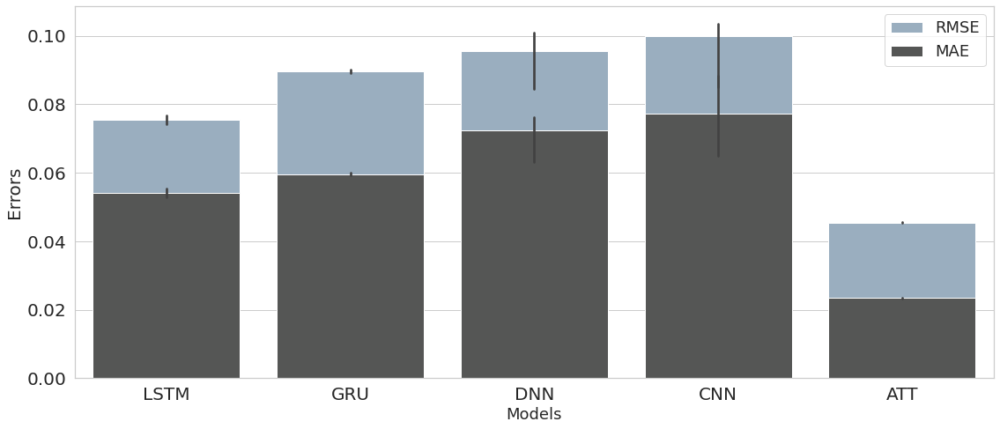

In [ ]:
plt.rc('xtick',labelsize=20)
plt.rc('ytick',labelsize=20)

fig, (ax1) = plt.subplots(1, 1, figsize=(16, 7))
sns.barplot(x='ANN', y='rmse', data=error_loop_df.drop(['r2'], axis=1), ax=ax1, color=colors['BLUE4'], label='RMSE', ci=40)
sns.barplot(x='ANN', y='MAE', data=error_loop_df.drop(['r2'], axis=1), ax=ax1, color=colors['GRAY3'], label='MAE', ci=40)
ax1.legend(fontsize=18);ax2.legend(fontsize=18)
ax1.set_xlabel('Models', fontsize=18); ax2.set_xlabel('Models', fontsize=18)
ax1.set_ylabel('Errors', fontsize=20); ax2.set_ylabel('Errors', fontsize=20)
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
plt.savefig('error_loop_df.pdf', dpi=300, bbox_inches='tight')
plt.tight_layout()

# Load saved model

Run this cell if you want to load a model and skip train

In [ ]:
#@title Load a Model to forecast. Model A is a stable one to forecast and B for preds{ display-mode: "form" }

option = 'No Download' #@param ["No Download", "Model A", "Model B"]

if option == 'Model A':
  # This is a stable model to forecast
  !wget --no-check-certificate \
      https://www.dropbox.com/s/o45us0s57bgm4xn/model_att_forecast.h5?dl=0 \
      -O /tmp/model_att_forecast.h5
  !wget --no-check-certificate \
      https://www.dropbox.com/s/eraffylxnpwljb3/model_att_forecast.json?dl=0 \
      -O /tmp/model_att_forecast.json
  !wget --no-check-certificate \
      https://www.dropbox.com/s/9l2331jysaj2i6g/model_att_forecast.csv?dl=0 \
      -O /tmp/model_att_forecast.csv
  print('ModelA')

if option == 'Model B':
  # An Overfitted Attention Model. I won't be using this model.
  !wget --no-check-certificate \
      https://www.dropbox.com/s/vc3o4g84pf6kjlk/overfitted_att.h5?dl=0 \
      -O /tmp/overfitted_att.h5
  !wget --no-check-certificate \
      https://www.dropbox.com/s/4bjy9bcuri9c1l2/overfitted_att.json?dl=0 \
      -O /tmp/overfitted_att.json
  !wget --no-check-certificate \
      https://www.dropbox.com/s/x2mc3mghz291t8a/overfitted_att.csv?dl=0 \
      -O /tmp/overfitted_att.csv
  # Loaded model is trained for 324 input sequences
  model_att = load_model(name='/tmp/model_att_forecast')
  n_timesteps_in = 324
  n_timesteps_out = 16
  n_features = 3
  n_hidden = 128
  epochs = 100
  batch_size = 256

  train_X, train_y = multi_step_output(normalized_train[:train_len], n_steps_in=n_timesteps_in, n_steps_out=n_timesteps_out)
  test_X, test_y = multi_step_output(normalized_train[train_len:], n_steps_in=n_timesteps_in, n_steps_out=n_timesteps_out)

  print('ModelB')


# Data Aggregation to Cluster HEAD

Running on CoLab
Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
                          Module             Type  ...  V_MPPT_TE  V_Panel_TE
Timestamp                                          ...                       
2017-10-01 00:00:05  00.57.FE.04  Net-Coordinator  ...        NaN         NaN
2017-10-01 00:00:42  00.57.FE.04  Net-Coordinator  ...        NaN         NaN
2017-10-01 00:01:13  00.57.FE.04  Net-Coordinator  ...        NaN         NaN
2017-10-01 00:01:42  00.57.FE.04  Net-Coordinator  ...        NaN         NaN
2017-10-01 00:02:05  00.57.FE.04  Net-Coordinator  ...        NaN         NaN

[5 rows x 16 columns]
Lenght of Data 61344
Lenght of Train 49075
Lenght of Test 12269
Lenght of Data2 52704
Lenght of Train2 42163
Lenght of Test2 10541


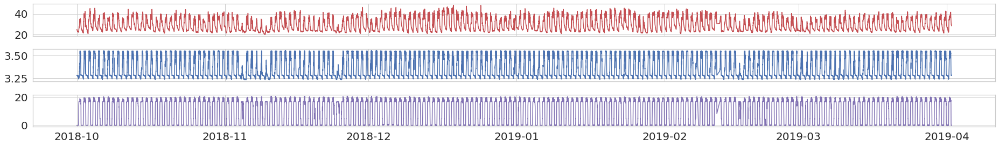

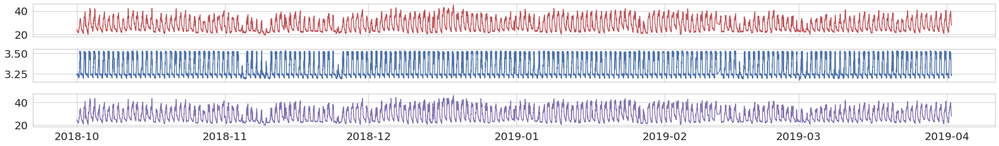

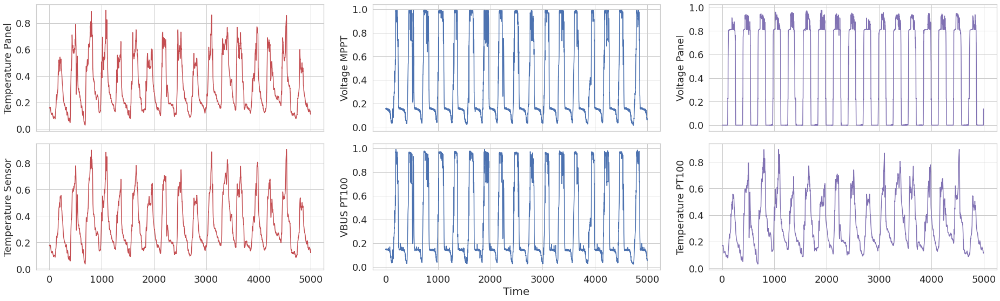

In [ ]:
#@title Choose the Module to Download{ display-mode: "form" }
module1 = '34.B2.9F.A9' #@param ["A7.CB.0A.C0", '9F.8D.AC.91', '29.E5.5A.24', '34.B2.9F.A9', '01.E9.39.32', 'A4.0D.82.38', '9F.8D.AC.91', '50.39.E2.80']
module2 = '29.E5.5A.24' #@param ["A7.CB.0A.C0", '9F.8D.AC.91', '29.E5.5A.24', '34.B2.9F.A9', '01.E9.39.32', 'A4.0D.82.38', '9F.8D.AC.91', '50.39.E2.80']
resample_time = '5Min' #@param ["5Min","10Min", '30Min', '60Min']
init_date = '2018-10-01' #@param {type:"date"}
end_date = '2019-04-01' #@param {type:"date"}

#n_timesteps_in = 290   # A day in samples
#n_timesteps_out = 12   # An hour in samples
n_features = 3         # 3 Features

#defaults '2018-10-01'   '2019-04'

# Block to load file depending if you are in Colab or in Jupyter
if 'google.colab' in str(get_ipython()):
    print('Running on CoLab')
    
    from google.colab import drive
    drive.mount('/content/drive')
    path = '/content/drive/My Drive/DeepLearning/Data/Features.csv'
    data = pd.read_csv(path, parse_dates=['Timestamp'], index_col='Timestamp')
    data = data.drop('Unnamed: 0', axis=1)
else:
    path_of_file = '../Data/single_feature.csv'
    data = pd.read_csv(path_of_file, parse_dates=['Timestamp'], index_col='Timestamp')

data1 = data[data['Module']==module1].dropna(axis=1, how='all')[init_date:end_date]
data2 = data[data['Module']==module2].dropna(axis=1, how='all')[init_date:end_date]

print(data.head())

try:
  data1 = data1.drop(['Module','Type'], axis=1)
  data2 = data2.drop(['Module','Type'], axis=1)
except:
  pass

if len(data1.columns) > 3:
  if module1 == '34.B2.9F.A9':
    data1 = data1.drop(data1.columns[2], axis=1)
  else:
    data1 = data1.drop(data1.columns[-1], axis=1)

if len(data2.columns) > 3:
  if module2 == '34.B2.9F.A9':
    data2 = data2.drop(data2.columns[2], axis=1)
  else:
    data2 = data2.drop(data2.columns[-1], axis=1)

fig, axx = plt.subplots(len(data1.columns), 1, figsize=(26,4), sharex=True)
for ax, ii, c in zip(axx, range(len(data1.columns)), ['r','b','m']):
  ax.plot(data1[data1.columns[ii]], color=c)
plt.tight_layout()

fig, axx = plt.subplots(len(data2.columns), 1, figsize=(26,4), sharex=True)
for ax, ii, c in zip(axx, range(len(data2.columns)), ['r','b','m']):
  ax.plot(data2[data2.columns[ii]], color=c)
plt.tight_layout()

# The data is higly irregular so let's resample it to 10 min and take the mean
resampled1 = data1.resample('5Min').mean()
resampled1 = resampled1.fillna(resampled1.bfill())
resampled2 = data2.resample('5Min').mean()
resampled2 = resampled2.fillna(resampled2.bfill())
# Now let's take only a slice of it

#Separate Train and test
train_data1 = resampled1[init_date:end_date]
train_data2 = resampled2[init_date:end_date]

train_ratio = 0.8
train_len1 = int(train_ratio*len(train_data1))
train_len2 = int(train_ratio*len(train_data2))
scaler = MinMaxScaler()
normalized_train1 = scaler.fit_transform(train_data1)
normalized_train2 = scaler.fit_transform(train_data2)

print('Lenght of Data {}'.format(len(normalized_train)))
print('Lenght of Train {}'.format(train_len))
print('Lenght of Test {}'.format(len(normalized_train) - train_len)) 
print('Lenght of Data2 {}'.format(len(normalized_train2)))
print('Lenght of Train2 {}'.format(train_len2))
print('Lenght of Test2 {}'.format(len(normalized_train2) - train_len2)) 

plt.rc('xtick',labelsize=18)
plt.rc('ytick',labelsize=18)

fig, axx = plt.subplots(2,3, figsize=(26,8), sharex=True)
axx[0,0].plot(normalized_train1[:,0][:5000], color='r')
axx[0,0].set_ylabel('Temperature Panel', fontsize=18)
axx[0,1].plot(normalized_train1[:,1][:5000], color='b')
axx[0,1].set_ylabel('Voltage MPPT', fontsize=18)
axx[0,2].plot(normalized_train1[:,2][:5000], color='m')
axx[0,2].set_ylabel('Voltage Panel', fontsize=18)
axx[1,0].plot(normalized_train2[:,0][:5000], color='r')
axx[1,0].set_ylabel('Temperature Sensor', fontsize=18)
axx[1,1].plot(normalized_train2[:,1][:5000], color='b')
axx[1,1].set_ylabel('VBUS PT100', fontsize=18)
axx[1,2].plot(normalized_train2[:,2][:5000], color='m')
axx[1,2].set_ylabel('Temperature PT100', fontsize=18)
axx[1,1].set_xlabel('Time', fontsize=20)
plt.tight_layout()
fig.savefig('Inputs.pdf', bbox_inches='tight', dpi=300)

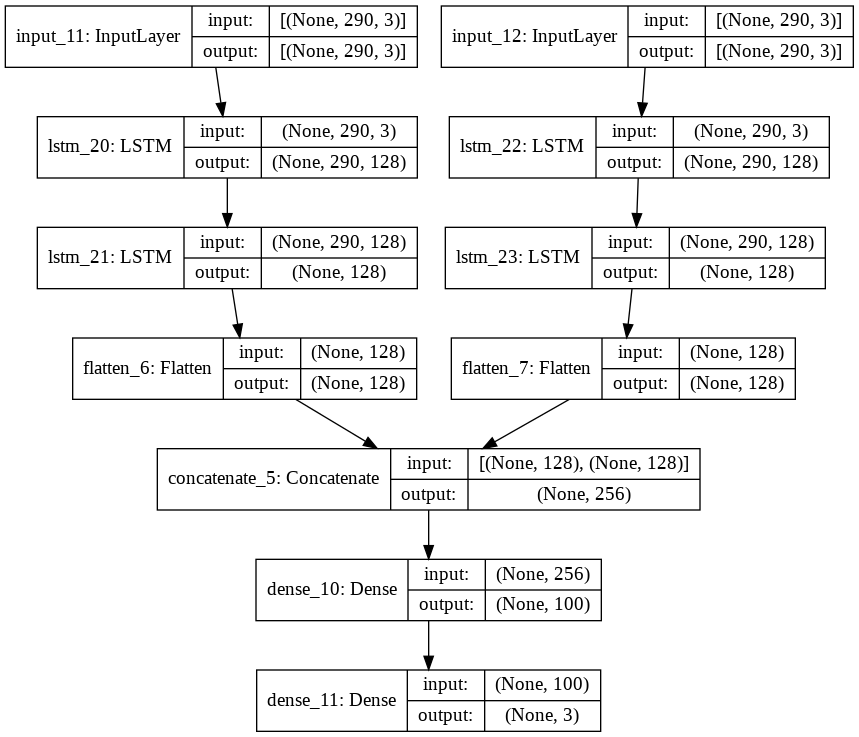

In [ ]:
# head 1
#@title Multiheaded LSTM { display-mode: "form" }
n_timesteps_in = 290 #@param {type:"slider", min:290, max:2030, step:290} 
n_timesteps_out = 12 #@param {type:"slider", min:4, max:16, step:2} 
n_hidden = 128 #@param {type:"slider", min:64, max:256, step:32}
epochs = 200  #@param {type:"slider", min:50, max:500, step:10}
batch_size = 245 #@param {type:"slider", min:120, max:350, step:5}

input_shape= (n_timesteps_in, n_features)

train_X1, train_y1 = split_sequences_multivariate(normalized_train1[:train_len1], n_steps=n_timesteps_in)
test_X1, test_y1 = split_sequences_multivariate(normalized_train1[train_len1:], n_steps=n_timesteps_in)

train_X2, train_y2 = split_sequences_multivariate(normalized_train2[:train_len2], n_steps=n_timesteps_in)
test_X2, test_y2 = split_sequences_multivariate(normalized_train2[train_len2:], n_steps=n_timesteps_in)

inputs_h1 = tf.keras.layers.Input(shape=input_shape)
lstm_h1 = tf.keras.layers.LSTM(units=128, input_shape=input_shape, return_sequences=True, dropout=0.2)(inputs_h1)
lstm2_h1 = tf.keras.layers.LSTM(units=128, input_shape=input_shape, return_sequences=False, dropout=0.2)(lstm_h1)
flat_h1 = tf.keras.layers.Flatten()(lstm2_h1)
# head 2
inputs_h2 = tf.keras.layers.Input(shape=input_shape)
lstm_h2 = tf.keras.layers.LSTM(units=128, input_shape=input_shape, return_sequences=True, dropout=0.2)(inputs_h2)
lstm2_h2 = tf.keras.layers.LSTM(units=128, input_shape=input_shape, return_sequences=False, dropout=0.2)(lstm_h2)
flat_h2 = tf.keras.layers.Flatten()(lstm2_h2)

merged = tf.keras.layers.concatenate([flat_h1, flat_h2])

# interpretation
dense1 = tf.keras.layers.Dense(100, activation='relu')(merged)
outputs = tf.keras.layers.Dense(3, activation='relu')(dense1)
model = tf.keras.Model(inputs=[inputs_h1, inputs_h2], outputs=outputs)

# save a plot of the model
model.compile(optimizer='adam', loss='mean_squared_error', metrics=['mae'])
plot_model(model, show_shapes=True, to_file='multichannel.pdf', dpi=300)
plot_model(model, show_shapes=True, to_file='multichannel.png')

Epoch 1/200
137/137 [==============================] - 24s 140ms/step - loss: 0.0626 - mae: 0.1374 - val_loss: 0.0050 - val_mae: 0.0392
Epoch 2/200
137/137 [==============================] - 18s 131ms/step - loss: 0.0061 - mae: 0.0471 - val_loss: 0.0036 - val_mae: 0.0336
Epoch 3/200
137/137 [==============================] - 18s 131ms/step - loss: 0.0049 - mae: 0.0414 - val_loss: 0.0037 - val_mae: 0.0331
Epoch 4/200
137/137 [==============================] - 18s 131ms/step - loss: 0.0045 - mae: 0.0390 - val_loss: 0.0030 - val_mae: 0.0312
Epoch 5/200
137/137 [==============================] - 18s 131ms/step - loss: 0.0039 - mae: 0.0358 - val_loss: 0.0033 - val_mae: 0.0298
Epoch 6/200
137/137 [==============================] - 18s 131ms/step - loss: 0.0039 - mae: 0.0360 - val_loss: 0.0037 - val_mae: 0.0350
Epoch 7/200
137/137 [==============================] - 18s 131ms/step - loss: 0.0037 - mae: 0.0349 - val_loss: 0.0027 - val_mae: 0.0282
Epoch 8/200
137/137 [===========================

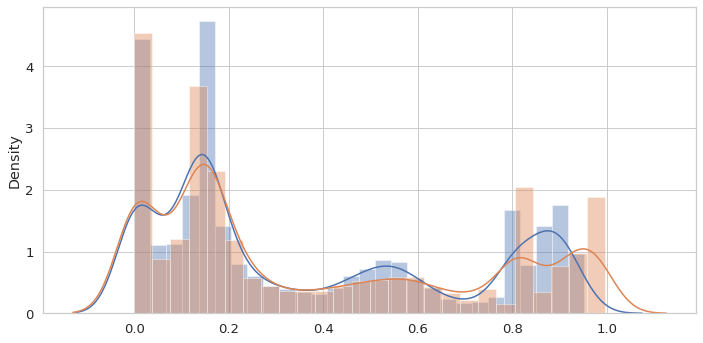

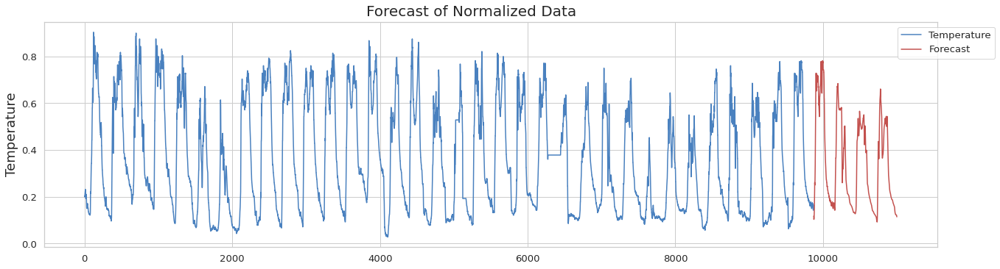

In [ ]:
#@title Train the model LSTM { display-mode: "form" }

#print(model.summary())

early_stop = EarlyStopping(monitor='val_loss', patience=3)
history = model.fit([train_X1,train_X2], y=train_y1, batch_size=batch_size, epochs=epochs, validation_split=0.2, verbose=True, callbacks=[early_stop])

predictions = model.predict(x=[test_X1,test_X2], batch_size=batch_size)
print(f'R2 {r2_score(test_y1, predictions)}')
print(f'MSE {mean_squared_error(test_y1, predictions)}')

fig, ax1 = plt.subplots(1, 1, figsize=(10,5))

sns.distplot(a = predictions.flatten(), ax=ax1)
sns.distplot(a = test_y1.flatten(), ax=ax1)
plt.tight_layout()

fig, axx = plt.subplots(1, 1, figsize=(18,5), sharex=True)

fig.suptitle('Forecast of Normalized Data',y=1.02, fontsize=20)
forecast = np.concatenate([normalized_train1[:train_len1], predictions], axis=0)
forecast[:train_y1.shape[0]] = None
axx.plot(train_y1[:, 0][32000:43000], color=colors['BLUE2'], label='Temperature')
axx.plot(forecast[:,0][32000:43000], color=colors['RED1'], label='Forecast')
axx.set_ylabel('Temperature', fontsize=18); axx.legend(loc='upper left', fontsize=20)
plt.tight_layout()

axx.legend(bbox_to_anchor=(0.95, 1), loc='upper left')

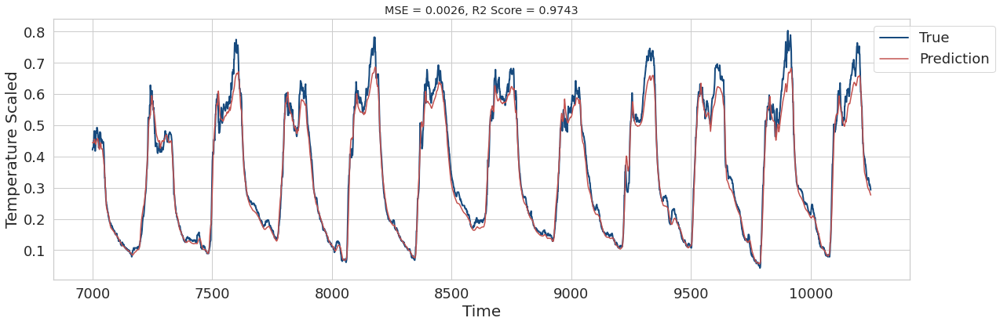

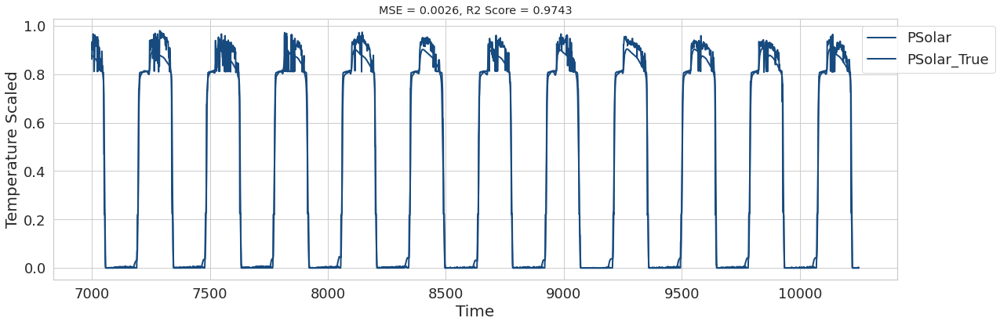

In [ ]:
pred_df = pd.DataFrame(data= np.concatenate((predictions[:,0].reshape(-1,1), test_y1[:,0].reshape(-1,1)), axis=1), columns=['Prediction', 'True'])
pred_df_mppt = pd.DataFrame(data= np.concatenate((predictions[:,1].reshape(-1,1), test_y1[:,1].reshape(-1,1)), axis=1), columns=['mppt', 'mppt_True'])
pred_df_solar = pd.DataFrame(data= np.concatenate((predictions[:,2].reshape(-1,1), test_y1[:,2].reshape(-1,1)), axis=1), columns=['PSolar', 'PSolar_True'])

plt.rc('xtick',labelsize=18)
plt.rc('ytick',labelsize=18)

fig, ax1 = plt.subplots(1,1,figsize=(18,6))
pred_df[7000:]['True'].plot(ax=ax1, color=colors['BLUE1'], linewidth=2.0)
pred_df[7000:]['Prediction'].plot(ax=ax1, color=colors['RED1'], linewidth=1.5)
plt.legend(loc='upper left')
plt.title('MSE = {}, R2 Score = {}'.format(np.round(mean_squared_error(test_y1, predictions),4), np.round(r2_score(test_y1, predictions),4)))    
plt.xlabel('Time', fontsize=20)
plt.ylabel('Temperature Scaled', fontsize=20)
plt.legend(fontsize=18, bbox_to_anchor=(0.95, 1), loc='upper left')
plt.tight_layout()

fig.savefig('MultiH_LSTM_Pred.pdf', bbox_inches='tight', dpi=300)

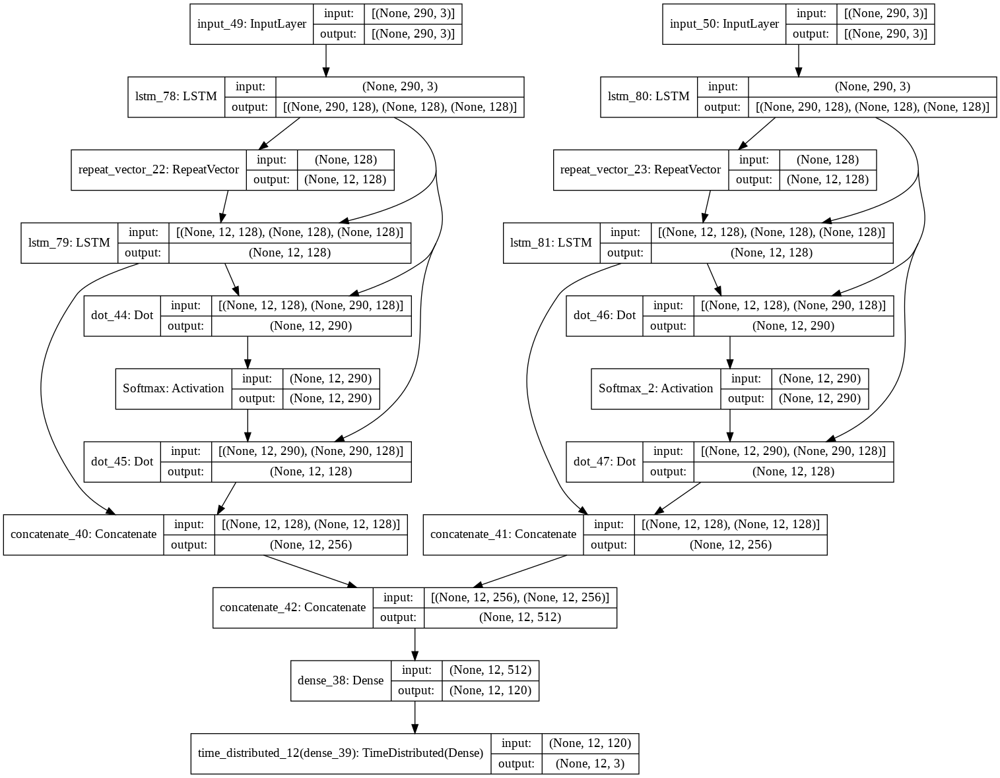

In [ ]:
# head 1
#@title Multiheaded Attention { display-mode: "form" }
n_timesteps_in = 290 #@param {type:"slider", min:290, max:2030, step:290} 
n_timesteps_out = 12 #@param {type:"slider", min:4, max:16, step:2} 
n_hidden = 128 #@param {type:"slider", min:64, max:256, step:32}
epochs = 200  #@param {type:"slider", min:50, max:500, step:10}
batch_size = 245 #@param {type:"slider", min:120, max:350, step:5}

input_shape= (n_timesteps_in, n_features)

train_X1, train_y1 = multi_step_output(normalized_train1[:train_len1], n_steps_in=n_timesteps_in, n_steps_out=n_timesteps_out)
test_X1, test_y1 = multi_step_output(normalized_train1[train_len1:], n_steps_in=n_timesteps_in, n_steps_out=n_timesteps_out)

train_X2, train_y2 = multi_step_output(normalized_train2[:train_len2], n_steps_in=n_timesteps_in, n_steps_out=n_timesteps_out)
test_X2, test_y2 = multi_step_output(normalized_train2[train_len2:], n_steps_in=n_timesteps_in, n_steps_out=n_timesteps_out)

input_shape=(n_timesteps_in, n_features)
output_shape=(n_timesteps_out, n_features)

####---------------------------MODEL BUILD-------------------------------

input_h1 = Input(shape=input_shape)
output_train = Input(shape=output_shape)

encoder_stack_h, encoder_last_h, encoder_last_c = tf.keras.layers.LSTM(n_hidden, activation='tanh', return_sequences=True, return_state=True)(inputs_h1)
decoder_input = tf.keras.layers.RepeatVector(output_train.shape[1])(encoder_last_h)
decoder_stack_h = tf.keras.layers.LSTM(n_hidden, activation='tanh', return_state=False,return_sequences=True)(decoder_input, initial_state=[encoder_last_h, encoder_last_c])
attention = tf.keras.layers.dot([decoder_stack_h, encoder_stack_h], axes=[2, 2])
attention = tf.keras.layers.Activation('softmax', name='Softmax')(attention)
context = tf.keras.layers.dot([attention, encoder_stack_h], axes=[2,1])
decoder_combined_context = tf.keras.layers.concatenate([context, decoder_stack_h])

#flat_h1 = tf.keras.layers.Flatten()(decoder_combined_context)
#out = tf.keras.layers.TimeDistributed(tf.keras.layers.Dense(output_train.shape[2]))(decoder_combined_context)

#model = tf.keras.models.Model(inputs=input_train, outputs=out)
#flat_h1 = tf.keras.layers.Flatten()(lstm2_h1)

# head 2--------------------------------------
input_h2 = Input(shape=input_shape)
encoder_stack_h2, encoder_last_h2, encoder_last_c2 = tf.keras.layers.LSTM(n_hidden, activation='tanh', return_sequences=True, return_state=True)(inputs_h2)
decoder_input2 = tf.keras.layers.RepeatVector(output_train.shape[1])(encoder_last_h2)
decoder_stack_h2 = tf.keras.layers.LSTM(n_hidden, activation='tanh', return_state=False,return_sequences=True)(decoder_input2, initial_state=[encoder_last_h2, encoder_last_c2])
attention2 = tf.keras.layers.dot([decoder_stack_h2, encoder_stack_h2], axes=[2, 2])
attention2 = tf.keras.layers.Activation('softmax', name='Softmax_2')(attention2)
context2 = tf.keras.layers.dot([attention2, encoder_stack_h2], axes=[2,1])
decoder_combined_context2 = tf.keras.layers.concatenate([context2, decoder_stack_h2])

#flat_h2 = tf.keras.layers.Flatten()(decoder_combined_context2)

#out2 = tf.keras.layers.TimeDistributed(tf.keras.layers.Dense(output_train.shape[2]))(decoder_combined_context2)
###---------------MODEL BUILD-----------------------------------------------

merged = tf.keras.layers.concatenate([decoder_combined_context, decoder_combined_context2])   # CONCAT

#------------------------- interpretation-----------------------------------

dense = tf.keras.layers.Dense(120, activation='relu')(merged)
outputs = tf.keras.layers.TimeDistributed(tf.keras.layers.Dense(output_train.shape[2]))(dense)
#dense1 = tf.keras.layers.Dense(100, activation='relu')(merged)
#outputs = tf.keras.layers.Dense(3, activation='relu')(dense1)
model = tf.keras.Model(inputs=[inputs_h1, inputs_h2], outputs=outputs)
#------------------------- interpretation-----------------------------------

# save a plot of the model
optimizer = tf.keras.optimizers.Adam(lr=0.001)
model.compile(optimizer=optimizer, loss='mean_squared_error', metrics=['mae'])
plot_model(model, show_shapes=True, to_file='multichannel_att.pdf', dpi=300)
plot_model(model, show_shapes=True, to_file='multichannel_att.png')

#print(model.summary())
#model_att = Model_Attention(n_hidden=n_hidden, input_shape=(n_timesteps_in, n_features),
#                              output_shape=(n_timesteps_out, n_features), dropout=0.2)

Epoch 1/200
137/137 [==============================] - 16s 80ms/step - loss: 0.0401 - mae: 0.1266 - val_loss: 0.0087 - val_mae: 0.0549
Epoch 2/200
137/137 [==============================] - 10s 72ms/step - loss: 0.0083 - mae: 0.0536 - val_loss: 0.0064 - val_mae: 0.0451
Epoch 3/200
137/137 [==============================] - 10s 72ms/step - loss: 0.0058 - mae: 0.0426 - val_loss: 0.0066 - val_mae: 0.0436
Epoch 4/200
137/137 [==============================] - 10s 72ms/step - loss: 0.0056 - mae: 0.0418 - val_loss: 0.0070 - val_mae: 0.0438
Epoch 5/200
137/137 [==============================] - 10s 72ms/step - loss: 0.0050 - mae: 0.0390 - val_loss: 0.0061 - val_mae: 0.0409
Epoch 6/200
137/137 [==============================] - 10s 72ms/step - loss: 0.0047 - mae: 0.0382 - val_loss: 0.0056 - val_mae: 0.0388
Epoch 7/200
137/137 [==============================] - 10s 72ms/step - loss: 0.0044 - mae: 0.0368 - val_loss: 0.0054 - val_mae: 0.0389
Epoch 8/200
137/137 [==============================] - 

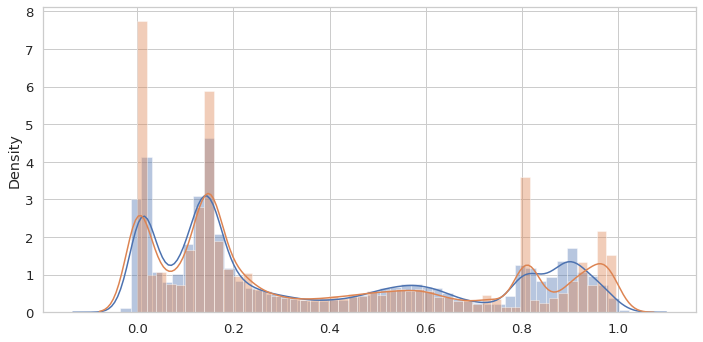

In [ ]:
early_stop = EarlyStopping(monitor='val_loss', patience=3)
history = model.fit([train_X1,train_X2], y=train_y1, batch_size=batch_size, epochs=epochs, validation_split=0.2, verbose=True, callbacks=[early_stop])

predictions = model.predict(x=[test_X1,test_X2], batch_size=batch_size)

mse_test = mean_squared_error(test_y1.reshape(-1,3), predictions.reshape(-1,3))
r2_test = r2_score(test_y1.reshape(-1,3), predictions.reshape(-1,3)) 
print(f'R2 {r2_test}')
print(f'MSE {mse_test}')

fig, ax1 = plt.subplots(1, 1, figsize=(10,5))

sns.distplot(a = predictions.flatten(), ax=ax1)
sns.distplot(a = test_y1.flatten(), ax=ax1)
plt.tight_layout()

```python
input_train = Input(shape=input_shape)
output_train = Input(shape=output_shape)

encoder_stack_h, encoder_last_h, encoder_last_c = \
tf.keras.layers.LSTM(n_hidden, activation='tanh', 
                  return_sequences=True,
                  return_state=True)(input_train)

#encoder_last_h = BatchNormalization(momentum=0.6)(encoder_last_h)
#encoder_last_c = BatchNormalization(momentum=0.6)(encoder_last_c)

# Repeat the last hidden state of encoder 20 times, and use them as input to decoder LSTM.
decoder_input = tf.keras.layers.RepeatVector(output_train.shape[1])(encoder_last_h)

decoder_stack_h = tf.keras.layers.LSTM(n_hidden, activation='tanh', return_state=False,
                                    return_sequences=True)(decoder_input, initial_state=[encoder_last_h, encoder_last_c])

# Alignment Score is Dot Product in Luong Attention
attention = tf.keras.layers.dot([decoder_stack_h, encoder_stack_h], axes=[2, 2])
attention = tf.keras.layers.Activation('softmax', name='Softmax')(attention)
context = tf.keras.layers.dot([attention, encoder_stack_h], axes=[2,1])
#context = BatchNormalization(momentum=0.6)(context)
# Now we concat the context vector and stacked hidden states of decoder, 
# and use it as input to the last dense layer.
decoder_combined_context = tf.keras.layers.concatenate([context, decoder_stack_h])
out = tf.keras.layers.TimeDistributed(tf.keras.layers.Dense(output_train.shape[2]))(decoder_combined_context)

model = tf.keras.models.Model(inputs=input_train, outputs=out)
```